In [3]:
import os
import numpy as np
import random
from PIL import Image
import matplotlib.pyplot as plt
from math import floor
import tensorflow as tf
from keras.layers import Conv2D, LeakyReLU, BatchNormalization, Dense, AveragePooling2D, GaussianNoise
from keras.layers import Reshape, UpSampling2D, Activation, Dropout, Flatten, Conv2DTranspose
from keras.models import model_from_json, Sequential
from keras.optimizers import Adam

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)

In [4]:
def zero():
    return np.random.uniform(0.0, 0.01, size = [1])

def one():
    return np.random.uniform(0.99, 1.0, size = [1])

def noise(n):
    return np.random.uniform(-1.0, 1.0, size = [n, 4096])

In [5]:
print("Importing Images...")

images_path = "/home/trojan/Desktop/dimentia/DCGAN/dataset/AD"
Images = []
files = os.listdir(images_path)
for file in os.listdir(images_path):
    temp1 = Image.open(images_path + '/' + file)
                
    temp = np.array(temp1.convert('RGB'), dtype='float32')
    
    Images.append(temp / 255)
    
    Images.append(np.flip(Images[-1], 1))
    

Importing Images...


In [6]:
class GAN(object):
    
    def __init__(self):
        
        #Models
        self.D = None
        self.G = None
        
        self.OD = None
        
        self.DM = None
        self.AM = None
        
        #Config
        self.LR = 0.0001
        self.steps = 1
        
    def discriminator(self):
        
        if self.D:
            return self.D
        
        self.D = Sequential()
        
        #add Gaussian noise to prevent Discriminator overfitting
        self.D.add(GaussianNoise(0.2, input_shape = [256, 256, 3]))
        
        #256x256x3 Image
        self.D.add(Conv2D(filters = 8, kernel_size = 3, padding = 'same'))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #128x128x8
        self.D.add(Conv2D(filters = 16, kernel_size = 3, padding = 'same'))
        self.D.add(BatchNormalization(momentum = 0.7))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #64x64x16
        self.D.add(Conv2D(filters = 32, kernel_size = 3, padding = 'same'))
        self.D.add(BatchNormalization(momentum = 0.7))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #32x32x32
        self.D.add(Conv2D(filters = 64, kernel_size = 3, padding = 'same'))
        self.D.add(BatchNormalization(momentum = 0.7))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #16x16x64
        self.D.add(Conv2D(filters = 128, kernel_size = 3, padding = 'same'))
        self.D.add(BatchNormalization(momentum = 0.7))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #8x8x128
        self.D.add(Conv2D(filters = 256, kernel_size = 3, padding = 'same'))
        self.D.add(BatchNormalization(momentum = 0.7))
        self.D.add(LeakyReLU(0.2))
        self.D.add(Dropout(0.25))
        self.D.add(AveragePooling2D())
        
        #4x4x256
        self.D.add(Flatten())
        
        #256
        self.D.add(Dense(128))
        self.D.add(LeakyReLU(0.2))
        
        self.D.add(Dense(1, activation = 'sigmoid'))
        
        return self.D
    
    def generator(self):
        
        if self.G:
            return self.G
        
        self.G = Sequential()
        
        self.G.add(Reshape(target_shape = [1, 1, 4096], input_shape = [4096]))
        
        #1x1x4096 
        self.G.add(Conv2DTranspose(filters = 512, kernel_size = 4))
        self.G.add(Activation('relu'))
        
        #4x4x256 - kernel sized increased by 1
        self.G.add(Conv2D(filters = 256, kernel_size = 4, padding = 'same'))
        self.G.add(BatchNormalization(momentum = 0.7))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #8x8x256 - kernel sized increased by 1
        self.G.add(Conv2D(filters = 128, kernel_size = 4, padding = 'same'))
        self.G.add(BatchNormalization(momentum = 0.7))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #16x16x128
        self.G.add(Conv2D(filters = 64, kernel_size = 3, padding = 'same'))
        self.G.add(BatchNormalization(momentum = 0.7))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #32x32x64
        self.G.add(Conv2D(filters = 32, kernel_size = 3, padding = 'same'))
        self.G.add(BatchNormalization(momentum = 0.7))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #64x64x32
        self.G.add(Conv2D(filters = 16, kernel_size = 3, padding = 'same'))
        self.G.add(BatchNormalization(momentum = 0.7))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #128x128x16
        self.G.add(Conv2D(filters = 8, kernel_size = 3, padding = 'same'))
        self.G.add(Activation('relu'))
        self.G.add(UpSampling2D())
        
        #256x256x8
        self.G.add(Conv2D(filters = 3, kernel_size = 3, padding = 'same'))
        self.G.add(Activation('sigmoid'))
        
        return self.G
    
    def DisModel(self):
        
        if self.DM == None:
            self.DM = Sequential()
            self.DM.add(self.discriminator())
        
        self.DM.compile(optimizer = Adam(lr = self.LR * (0.85 ** floor(self.steps / 10000))), loss = 'binary_crossentropy')
        
        return self.DM
    
    def AdModel(self):
        
        if self.AM == None:
            self.AM = Sequential()
            self.AM.add(self.generator())
            self.AM.add(self.discriminator())
            
        self.AM.compile(optimizer = Adam(lr = self.LR * (0.85 ** floor(self.steps / 10000))), loss = 'binary_crossentropy')
        
        return self.AM
    
    def sod(self):
        
        self.OD = self.D.get_weights()
        
    def lod(self):
        
        self.D.set_weights(self.OD)


In [7]:
class Model_GAN(object):
    
    def __init__(self):
        
        self.GAN = GAN()
        self.DisModel = self.GAN.DisModel()
        self.AdModel = self.GAN.AdModel()
        self.generator = self.GAN.generator()
        
    def train(self, batch = 8): # 16
        
        (a, b) = self.train_dis(batch)
        c = self.train_gen(batch)
        
        print(f"D Real: {str(a)}, D Fake: {str(b)}, G All: {str(c)}")
        
        if self.GAN.steps % 500 == 0:
            self.save(floor(self.GAN.steps / 1000))
            self.evaluate()
            
        if self.GAN.steps % 5000 == 0:
            self.GAN.AM = None
            self.GAN.DM = None
            self.AdModel = self.GAN.AdModel()
            self.DisModel = self.GAN.DisModel()
        
        self.GAN.steps = self.GAN.steps + 1
        
    def train_dis(self, batch):
        
        #Get Real Images
        im_no = random.randint(0, len(Images) - batch - 1)
        train_data = Images[im_no : im_no + int(batch / 2)]
        #train_data = np.array(train_data)
        #train_data = train_data.reshape(-1, 8, 256, 256)
        label_data = []
        for i in range(int(batch / 2)):
            #label_data.append(one())
            label_data.append(zero())
            
        d_loss_real = self.DisModel.train_on_batch(np.array(train_data), np.array(label_data))
        
        #Get Fake Images
        train_data = self.generator.predict(noise(int(batch / 2)))
        label_data = []
        for i in range(int(batch / 2)):
            #label_data.append(zero())
            label_data.append(one())
            
        d_loss_fake = self.DisModel.train_on_batch(train_data, np.array(label_data))
        
        return (d_loss_real, d_loss_fake)
        
    def train_gen(self, batch):
        
        self.GAN.sod()
        
        label_data = []
        for i in range(int(batch)):
            #label_data.append(one())
            label_data.append(zero())
        
        g_loss = self.AdModel.train_on_batch(noise(batch), np.array(label_data))
        
        self.GAN.lod()
        
        return g_loss
        
    def evaluate(self):
        
        im_no = random.randint(0, len(Images) - 1)
        im1 = Images[im_no]
        
        im2 = self.generator.predict(noise(2))
        
        plt.figure(1)
        plt.imshow(im1)
        
        plt.figure(2)
        plt.imshow(im2[0])
        
        plt.figure(3)
        plt.imshow(im2[1])
        
        plt.show()
        
    def save(self, num):
        gen_json = self.GAN.G.to_json()
        dis_json = self.GAN.D.to_json()

        with open("Models/gen.json", "w+") as json_file:
            json_file.write(gen_json)

        with open("Models/dis.json", "w+") as json_file:
            json_file.write(dis_json)

        self.GAN.G.save_weights("Models/gen"+str(num)+".h5")
        self.GAN.D.save_weights("Models/dis"+str(num)+".h5")

        print(f"Model number {str(num)} Saved!")

    def load(self, num):
        steps1 = self.GAN.steps
        
        self.GAN = None
        self.GAN = GAN()

        #Generator
        gen_file = open("Models/gen.json", 'r')
        gen_json = gen_file.read()
        gen_file.close()
        
        self.GAN.G = model_from_json(gen_json)
        self.GAN.G.load_weights("Models/gen"+str(num)+".h5")

        #Discriminator
        dis_file = open("Models/dis.json", 'r')
        dis_json = dis_file.read()
        dis_file.close()
        
        self.GAN.D = model_from_json(dis_json)
        self.GAN.D.load_weights("Models/dis"+str(num)+".h5")

        #Reinitialize
        self.generator = self.GAN.generator()
        self.DisModel = self.GAN.DisModel()
        self.AdModel = self.GAN.AdModel()
        
        self.GAN.steps = steps1
        
    def eval2(self, num = 0):
        
        im2 = self.generator.predict(noise(48))
        
        r1 = np.concatenate(im2[:8], axis = 1)
        r2 = np.concatenate(im2[8:16], axis = 1)
        r3 = np.concatenate(im2[16:24], axis = 1)
        r4 = np.concatenate(im2[24:32], axis = 1)
        r5 = np.concatenate(im2[32:40], axis = 1)
        r6 = np.concatenate(im2[40:48], axis = 1)
        
        c1 = np.concatenate([r1, r2, r3, r4, r5, r6], axis = 0)
        
        x = Image.fromarray(np.uint8(c1*255))
        
        x.save("Results/i"+str(num)+".png")

In [8]:
len(files)

4530

In [9]:
os.mkdir('Results')
os.mkdir('Models')

FileExistsError: [Errno 17] File exists: 'Results'


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gaussian_noise_1 (GaussianNo (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 8)       224       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256, 256, 8)       0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256, 256, 8)       0         
_________________________________________________________________
average_pooling2d_1 (Average (None, 128, 128, 8)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 16)      1168      
_________________________


D Real: 0.7101321, D Fake: 0.96206653, G All: 0.9721713
D Real: 0.08826227, D Fake: 0.7694726, G All: 0.6651144
D Real: 0.12401196, D Fake: 0.44567385, G All: 0.5669009
D Real: 0.07405366, D Fake: 0.46204758, G All: 0.6174077
D Real: 0.15723804, D Fake: 0.63888645, G All: 0.7830039
D Real: 0.29027683, D Fake: 0.28928122, G All: 1.1442292
D Real: 0.2760334, D Fake: 0.11454205, G All: 1.6118951
D Real: 0.24089968, D Fake: 0.09361416, G All: 1.7365856
D Real: 0.39261174, D Fake: 0.07691969, G All: 1.5175209
D Real: 0.11563437, D Fake: 0.14675888, G All: 1.2352426
D Real: 0.15769337, D Fake: 0.31113708, G All: 0.9940154
D Real: 0.14901736, D Fake: 0.13891263, G All: 1.384123
D Real: 0.11342013, D Fake: 0.20808035, G All: 1.7498398
D Real: 0.17646466, D Fake: 0.20560339, G All: 2.5794556
D Real: 0.21333578, D Fake: 0.109336354, G All: 3.0471206
D Real: 1.0549792, D Fake: 0.12819244, G All: 2.8581548
D Real: 0.35993263, D Fake: 0.16161641, G All: 2.5053015
D Real: 0.0700856, D Fake: 0.14804

D Real: 0.031206733, D Fake: 0.048066415, G All: 5.27086
D Real: 0.036976527, D Fake: 0.029455472, G All: 5.2242556
D Real: 0.040203318, D Fake: 0.0333881, G All: 5.1405463
D Real: 0.037513025, D Fake: 0.03697208, G All: 5.0694084
D Real: 0.047472987, D Fake: 0.03762588, G All: 5.171129
D Real: 0.021218432, D Fake: 0.040019415, G All: 5.2640786
D Real: 0.024315607, D Fake: 0.027797794, G All: 4.970281
D Real: 0.035830602, D Fake: 0.0344854, G All: 5.316374
D Real: 0.6111584, D Fake: 0.031955685, G All: 3.7186248
D Real: 0.059849083, D Fake: 0.110598475, G All: 2.9167404
D Real: 0.07028961, D Fake: 0.10502098, G All: 3.1494346
D Real: 0.070609115, D Fake: 0.054138616, G All: 4.231139
D Real: 0.058988027, D Fake: 0.046408817, G All: 4.7099133
D Real: 0.052475393, D Fake: 0.039029293, G All: 4.544499
D Real: 0.079823464, D Fake: 0.0537209, G All: 4.8412485
D Real: 0.08287287, D Fake: 0.060482547, G All: 4.143499
D Real: 0.058245815, D Fake: 0.08247976, G All: 4.116433
D Real: 0.060229413,

D Real: 0.03544669, D Fake: 0.03612663, G All: 5.0951524
D Real: 0.027326472, D Fake: 0.029101258, G All: 5.268721
D Real: 0.03242877, D Fake: 0.03956598, G All: 5.0812483
D Real: 0.04177128, D Fake: 0.029847775, G All: 4.9755926
D Real: 0.029191153, D Fake: 0.029937163, G All: 4.98333
D Real: 0.036853287, D Fake: 0.024789732, G All: 4.815172
D Real: 0.032494277, D Fake: 0.029454567, G All: 5.105567
D Real: 0.0345749, D Fake: 0.032809325, G All: 4.69096
D Real: 0.058702458, D Fake: 0.040735826, G All: 4.6117907
D Real: 0.06929684, D Fake: 0.047494628, G All: 3.9105604
D Real: 0.029222775, D Fake: 0.051805537, G All: 4.6595435
D Real: 0.033044145, D Fake: 0.03833498, G All: 4.623176
D Real: 0.03765948, D Fake: 0.042028233, G All: 5.358461
D Real: 0.01888854, D Fake: 0.033183403, G All: 6.5370665
D Real: 0.03135305, D Fake: 0.03890948, G All: 6.916606
D Real: 0.030396238, D Fake: 0.040415145, G All: 6.8565483
D Real: 0.030958991, D Fake: 0.044501886, G All: 6.4650955
D Real: 0.037028074,

D Real: 0.050844427, D Fake: 0.07141769, G All: 4.7581186
D Real: 0.30700687, D Fake: 0.04419786, G All: 3.8722453
D Real: 0.04903616, D Fake: 0.17340055, G All: 4.465475
D Real: 0.06063485, D Fake: 0.043574154, G All: 5.122306
D Real: 0.041791826, D Fake: 0.060453102, G All: 5.787534
D Real: 0.038668975, D Fake: 0.043124314, G All: 6.5069165
D Real: 0.03548798, D Fake: 0.05065825, G All: 6.9496336
D Real: 0.05643309, D Fake: 0.028318588, G All: 6.2218866
D Real: 0.027344938, D Fake: 0.022558339, G All: 5.7351723
D Real: 0.4452824, D Fake: 0.08695179, G All: 4.29884
D Real: 0.027679648, D Fake: 0.15767899, G All: 4.411267
D Real: 0.027441889, D Fake: 0.040471062, G All: 6.240999
D Real: 0.04382669, D Fake: 0.03486469, G All: 7.4493804
D Real: 0.046800036, D Fake: 0.046999663, G All: 7.6688843
D Real: 0.03412767, D Fake: 0.024071557, G All: 7.7024317
D Real: 0.07664329, D Fake: 0.03680923, G All: 7.250065
D Real: 0.11699243, D Fake: 0.039648168, G All: 6.1282563
D Real: 0.071068935, D F

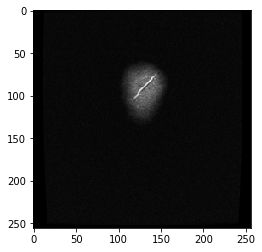

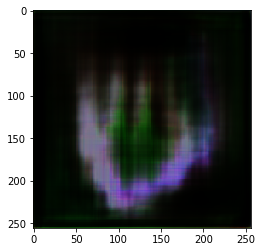

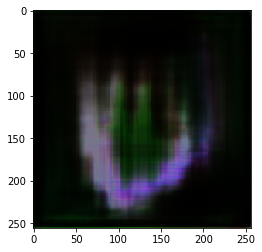

D Real: 0.15310733, D Fake: 0.043777432, G All: 4.6083956
D Real: 0.034181576, D Fake: 0.11453648, G All: 4.191383
D Real: 0.041800063, D Fake: 0.042182527, G All: 4.243642
D Real: 0.041211665, D Fake: 0.047357306, G All: 4.7777042
D Real: 0.039428987, D Fake: 0.047035716, G All: 5.4987974
D Real: 0.119041234, D Fake: 0.038238496, G All: 4.3048096
D Real: 0.11412453, D Fake: 0.09872107, G All: 3.5207183
D Real: 0.034784064, D Fake: 0.21348687, G All: 4.14168
D Real: 0.02735824, D Fake: 0.04013698, G All: 5.8381667
D Real: 0.029286463, D Fake: 0.026035573, G All: 6.9664226
D Real: 0.051588356, D Fake: 0.03579282, G All: 7.7162604
D Real: 0.06234771, D Fake: 0.036639426, G All: 7.545202
D Real: 0.046537366, D Fake: 0.028128099, G All: 6.238549
D Real: 0.0699516, D Fake: 0.041372113, G All: 5.0169544
D Real: 0.18849403, D Fake: 0.12608093, G All: 3.2638445
D Real: 0.06779621, D Fake: 0.33632433, G All: 4.932054
D Real: 0.042587854, D Fake: 0.036273543, G All: 8.163828
D Real: 0.17146596, 

D Real: 0.06196631, D Fake: 0.06178297, G All: 4.018095
D Real: 0.06768507, D Fake: 0.047614902, G All: 6.852674
D Real: 0.07595283, D Fake: 0.027735557, G All: 7.368554
D Real: 0.04609493, D Fake: 0.04831811, G All: 8.204744
D Real: 0.07176401, D Fake: 0.034351133, G All: 8.558002
D Real: 0.05839696, D Fake: 0.046464764, G All: 8.002974
D Real: 0.2816263, D Fake: 0.040382877, G All: 5.1523066
D Real: 0.06084955, D Fake: 0.059218775, G All: 2.9577172
D Real: 0.047581762, D Fake: 0.24539956, G All: 3.2606177
D Real: 0.07099624, D Fake: 0.031010032, G All: 6.1475143
D Real: 0.041370966, D Fake: 0.03499514, G All: 7.8756647
D Real: 0.03996844, D Fake: 0.032381147, G All: 8.302679
D Real: 0.04355879, D Fake: 0.050691564, G All: 8.865377
D Real: 0.11885132, D Fake: 0.03461271, G All: 8.1077795
D Real: 0.06746379, D Fake: 0.035023935, G All: 6.3902497
D Real: 0.0513978, D Fake: 0.06373358, G All: 4.654024
D Real: 0.037079945, D Fake: 0.19365335, G All: 4.399134
D Real: 0.035006896, D Fake: 0

D Real: 0.049753837, D Fake: 0.03396465, G All: 7.201419
D Real: 0.03328137, D Fake: 0.035657004, G All: 8.26395
D Real: 0.08806159, D Fake: 0.025969233, G All: 8.851831
D Real: 0.07646051, D Fake: 0.047695618, G All: 8.92044
D Real: 0.05696035, D Fake: 0.028567113, G All: 8.223601
D Real: 0.043522332, D Fake: 0.04783903, G All: 8.096202
D Real: 0.03718514, D Fake: 0.034321908, G All: 7.2595873
D Real: 0.21188535, D Fake: 0.04059747, G All: 5.8412647
D Real: 0.31705642, D Fake: 0.10318941, G All: 3.2775466
D Real: 0.056781836, D Fake: 0.09526678, G All: 2.3684373
D Real: 0.053149566, D Fake: 0.2515577, G All: 2.7565963
D Real: 0.050534494, D Fake: 0.16964623, G All: 4.6704874
D Real: 0.04344444, D Fake: 0.04569145, G All: 6.162247
D Real: 0.06098161, D Fake: 0.028386792, G All: 7.7798657
D Real: 0.049029216, D Fake: 0.055215992, G All: 8.074623
D Real: 0.06761263, D Fake: 0.03776771, G All: 7.291264
D Real: 0.05719643, D Fake: 0.034984995, G All: 7.1988077
D Real: 0.08997308, D Fake: 0

D Real: 0.08797877, D Fake: 0.030553263, G All: 5.999404
D Real: 0.06073142, D Fake: 0.025664574, G All: 6.78486
D Real: 0.04707184, D Fake: 0.03871458, G All: 5.651601
D Real: 0.061519988, D Fake: 0.03171688, G All: 5.3291636
D Real: 0.45417345, D Fake: 0.03310606, G All: 2.6932054
D Real: 3.3611848, D Fake: 1.1093535, G All: 0.76100963
D Real: 0.051094465, D Fake: 1.0334905, G All: 2.598363
D Real: 0.04092563, D Fake: 0.04674036, G All: 6.342786
D Real: 0.12131859, D Fake: 0.043024033, G All: 8.725185
D Real: 0.109691255, D Fake: 0.05201716, G All: 9.939396
D Real: 0.47282514, D Fake: 0.035660855, G All: 7.796439
D Real: 0.6537222, D Fake: 0.039015267, G All: 4.1000686
D Real: 0.033444054, D Fake: 0.9026061, G All: 1.9686801
D Real: 0.035203233, D Fake: 0.7769499, G All: 2.3663807
D Real: 0.045624096, D Fake: 0.14132194, G All: 4.666188
D Real: 0.09545332, D Fake: 0.03798111, G All: 6.570691
D Real: 0.10627135, D Fake: 0.03148058, G All: 8.503681
D Real: 1.950448, D Fake: 0.046604868

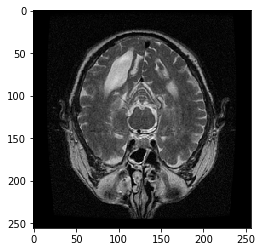

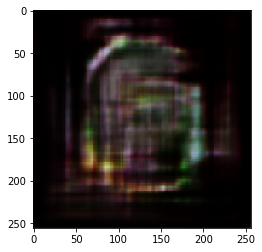

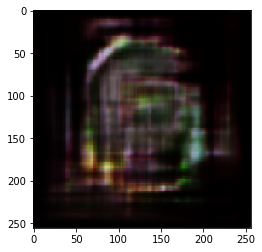

D Real: 0.5960138, D Fake: 0.0621308, G All: 8.786742
D Real: 0.090325676, D Fake: 0.05124253, G All: 7.489452
D Real: 0.04048308, D Fake: 0.033433013, G All: 6.4171224
D Real: 0.04629817, D Fake: 0.031674393, G All: 5.4317923
D Real: 0.039559282, D Fake: 0.060718887, G All: 4.1131725
D Real: 0.055884417, D Fake: 0.065762445, G All: 3.0124016
D Real: 0.05408364, D Fake: 0.08741739, G All: 2.702445
D Real: 0.022396801, D Fake: 0.1243183, G All: 2.6853182
D Real: 0.047101185, D Fake: 0.08722316, G All: 3.722702
D Real: 0.094070345, D Fake: 0.074925885, G All: 3.4145262
D Real: 0.05983212, D Fake: 0.06892183, G All: 3.6198273
D Real: 0.037843682, D Fake: 0.04606156, G All: 4.5664763
D Real: 0.38363886, D Fake: 0.05198224, G All: 3.791236
D Real: 0.06437363, D Fake: 0.07290976, G All: 3.753139
D Real: 0.06207604, D Fake: 0.059327915, G All: 4.054291
D Real: 0.035025563, D Fake: 0.091986835, G All: 3.981629
D Real: 0.03158766, D Fake: 0.04394518, G All: 4.2754464
D Real: 0.041935116, D Fake

D Real: 0.117617175, D Fake: 0.06615961, G All: 4.8110104
D Real: 0.03914239, D Fake: 0.068871304, G All: 3.9269896
D Real: 0.17570472, D Fake: 0.11563532, G All: 3.379488
D Real: 0.06581177, D Fake: 0.07109563, G All: 3.6368885
D Real: 0.036845192, D Fake: 0.10122026, G All: 4.1441445
D Real: 0.082930505, D Fake: 0.056318328, G All: 4.685342
D Real: 0.032068357, D Fake: 0.059233837, G All: 4.9284883
D Real: 0.043235525, D Fake: 0.030526264, G All: 6.145931
D Real: 0.1997312, D Fake: 0.04677836, G All: 4.4316044
D Real: 0.06373523, D Fake: 0.055000953, G All: 3.8464088
D Real: 0.38802212, D Fake: 0.10071276, G All: 2.4460516
D Real: 0.22197402, D Fake: 0.2001513, G All: 2.7355917
D Real: 0.03737071, D Fake: 0.21108447, G All: 3.6995842
D Real: 0.029450798, D Fake: 0.04875862, G All: 5.0443387
D Real: 0.052050434, D Fake: 0.0326535, G All: 7.0290155
D Real: 0.2315537, D Fake: 0.036157258, G All: 6.0044155
D Real: 0.06315757, D Fake: 0.052309647, G All: 5.338952
D Real: 0.10878262, D Fak

D Real: 0.041968938, D Fake: 0.05600225, G All: 8.967028
D Real: 0.43968943, D Fake: 0.032004874, G All: 6.4355617
D Real: 0.059697807, D Fake: 0.039456677, G All: 4.7530637
D Real: 0.046371933, D Fake: 0.26930946, G All: 2.9851785
D Real: 0.043598287, D Fake: 0.04786333, G All: 3.7524042
D Real: 0.06425364, D Fake: 0.042495422, G All: 4.874886
D Real: 0.04399782, D Fake: 0.036639184, G All: 5.7094812
D Real: 0.050828747, D Fake: 0.038942985, G All: 6.054672
D Real: 0.1010985, D Fake: 0.042166293, G All: 5.387867
D Real: 0.8212366, D Fake: 0.18813272, G All: 2.3493514
D Real: 0.044991642, D Fake: 0.57455844, G All: 3.6884263
D Real: 0.042627454, D Fake: 0.019351456, G All: 6.058799
D Real: 0.04081233, D Fake: 0.045378864, G All: 7.3416996
D Real: 0.42619887, D Fake: 0.047352944, G All: 6.386334
D Real: 0.2906158, D Fake: 0.06215573, G All: 2.9017673
D Real: 0.029114854, D Fake: 0.1672644, G All: 2.0346594
D Real: 0.11949959, D Fake: 0.77896845, G All: 3.4422956
D Real: 0.07680315, D Fa

D Real: 0.031800758, D Fake: 0.042527393, G All: 5.887163
D Real: 0.58102554, D Fake: 0.1056484, G All: 4.2017984
D Real: 0.33581313, D Fake: 0.08089759, G All: 2.41738
D Real: 0.055365372, D Fake: 0.80897605, G All: 3.0839832
D Real: 0.032372855, D Fake: 0.061723072, G All: 6.6184654
D Real: 0.5234862, D Fake: 0.03541864, G All: 7.574637
D Real: 0.9214005, D Fake: 0.0346819, G All: 3.9915044
D Real: 0.077428095, D Fake: 0.19086942, G All: 1.6305795
D Real: 0.065730214, D Fake: 0.49164337, G All: 1.6480335
D Real: 0.04637084, D Fake: 0.13540581, G All: 3.187787
D Real: 0.037245587, D Fake: 0.0507506, G All: 4.9162297
D Real: 0.04284027, D Fake: 0.03522387, G All: 5.6926556
D Real: 0.072073124, D Fake: 0.0227633, G All: 5.8345666
D Real: 0.0889882, D Fake: 0.03578993, G All: 5.3995056
D Real: 0.33606598, D Fake: 0.038552828, G All: 4.112127
D Real: 0.2729645, D Fake: 0.07963997, G All: 2.0939808
D Real: 0.04614198, D Fake: 0.1409356, G All: 1.6290495
D Real: 0.041232005, D Fake: 0.40895

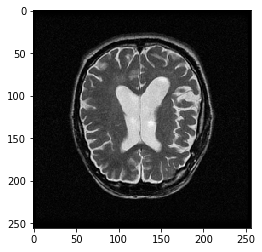

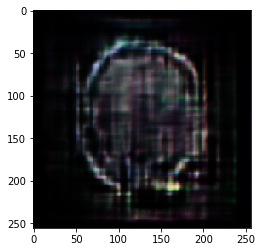

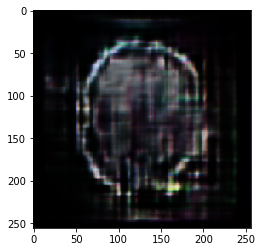

D Real: 0.07065354, D Fake: 0.07520002, G All: 3.4494312
D Real: 0.030177353, D Fake: 0.14984608, G All: 1.7474542
D Real: 0.07755065, D Fake: 0.26469964, G All: 1.9649143
D Real: 0.053565416, D Fake: 0.15616362, G All: 3.6426976
D Real: 0.043973044, D Fake: 0.05362454, G All: 4.300652
D Real: 0.21764112, D Fake: 0.06647153, G All: 4.801108
D Real: 0.8182694, D Fake: 0.05643933, G All: 3.215481
D Real: 0.035965428, D Fake: 0.098685995, G All: 2.2054129
D Real: 0.05386395, D Fake: 0.27870473, G All: 2.0173275
D Real: 0.11330803, D Fake: 0.3125171, G All: 3.7455645
D Real: 0.051676683, D Fake: 0.0826754, G All: 5.5818768
D Real: 0.05740699, D Fake: 0.033760816, G All: 6.534095
D Real: 0.9554821, D Fake: 0.05518493, G All: 5.506445
D Real: 0.04147209, D Fake: 0.052256145, G All: 4.430009
D Real: 0.039425366, D Fake: 0.10100935, G All: 3.6909716
D Real: 0.042782586, D Fake: 0.17878178, G All: 3.6322808
D Real: 0.03812252, D Fake: 0.049025476, G All: 4.0307927
D Real: 0.37088186, D Fake: 0.

D Real: 0.3612012, D Fake: 0.29906765, G All: 2.2477133
D Real: 0.36543688, D Fake: 0.27159384, G All: 2.1750164
D Real: 0.1407106, D Fake: 0.3322651, G All: 3.414422
D Real: 0.38256225, D Fake: 0.20263138, G All: 3.7642696
D Real: 0.34732282, D Fake: 0.061145164, G All: 4.0209823
D Real: 0.39047664, D Fake: 0.06072956, G All: 2.4794002
D Real: 0.22559822, D Fake: 0.24400796, G All: 2.492371
D Real: 0.04686681, D Fake: 0.11024223, G All: 2.1831212
D Real: 0.030209076, D Fake: 0.25509128, G All: 3.1204045
D Real: 0.11218202, D Fake: 0.06282212, G All: 4.120179
D Real: 0.12237953, D Fake: 0.09209335, G All: 4.59759
D Real: 0.14203203, D Fake: 0.048933886, G All: 4.506448
D Real: 0.34682137, D Fake: 0.07975378, G All: 3.8645203
D Real: 0.04508087, D Fake: 0.17803761, G All: 3.6720467
D Real: 0.2223884, D Fake: 0.15769544, G All: 3.0384738
D Real: 0.036372557, D Fake: 0.048051603, G All: 3.1912003
D Real: 0.17686561, D Fake: 0.061769634, G All: 3.5168557
D Real: 0.048804495, D Fake: 0.0929

D Real: 0.107292995, D Fake: 0.044067267, G All: 4.419594
D Real: 0.11905592, D Fake: 0.07077253, G All: 3.670373
D Real: 0.5849109, D Fake: 0.07299455, G All: 3.1212602
D Real: 0.07526184, D Fake: 0.3145373, G All: 3.5710523
D Real: 0.14675972, D Fake: 0.09132632, G All: 2.928848
D Real: 0.091151886, D Fake: 0.32612792, G All: 3.1392496
D Real: 0.060059734, D Fake: 0.085546374, G All: 3.3262594
D Real: 0.20179558, D Fake: 0.0627081, G All: 3.6643958
D Real: 0.059245348, D Fake: 0.088928714, G All: 2.9921927
D Real: 0.24499989, D Fake: 0.183229, G All: 3.2370455
D Real: 0.03841087, D Fake: 0.10929202, G All: 3.4620547
D Real: 0.7513743, D Fake: 0.14558764, G All: 3.1413789
D Real: 0.34898716, D Fake: 0.32069135, G All: 2.4271822
D Real: 0.050923046, D Fake: 0.19191252, G All: 2.8394766
D Real: 0.030916497, D Fake: 0.15748946, G All: 3.9204197
D Real: 0.47041368, D Fake: 0.06233099, G All: 3.7683654
D Real: 0.14133771, D Fake: 0.047651544, G All: 4.2712336
D Real: 0.09781191, D Fake: 0.

D Real: 0.12076598, D Fake: 0.14495614, G All: 2.5432553
D Real: 0.0735023, D Fake: 0.19938049, G All: 2.3557744
D Real: 0.045991722, D Fake: 0.1675646, G All: 2.8420076
D Real: 0.12931444, D Fake: 0.060812764, G All: 4.02527
D Real: 0.2842027, D Fake: 0.063429505, G All: 4.081463
D Real: 0.05822128, D Fake: 0.04304388, G All: 4.7203717
D Real: 0.06465274, D Fake: 0.14460067, G All: 4.5943317
D Real: 0.2017344, D Fake: 0.030637778, G All: 3.9121256
D Real: 0.123865485, D Fake: 0.03906294, G All: 4.2121334
D Real: 0.09706484, D Fake: 0.069557175, G All: 3.638979
D Real: 0.09915591, D Fake: 0.09081444, G All: 3.1678114
D Real: 0.4120649, D Fake: 0.6047559, G All: 1.9555719
D Real: 0.0639047, D Fake: 0.4622718, G All: 3.1421893
D Real: 0.08259688, D Fake: 0.037117578, G All: 5.9108067
D Real: 0.40354893, D Fake: 0.04319469, G All: 5.4712014
D Real: 0.54046434, D Fake: 0.036444597, G All: 3.9102619
D Real: 0.067269266, D Fake: 0.14367348, G All: 2.5184312
D Real: 0.06030514, D Fake: 0.1706

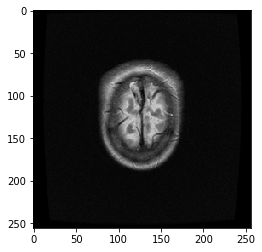

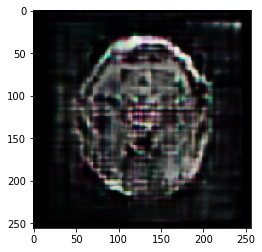

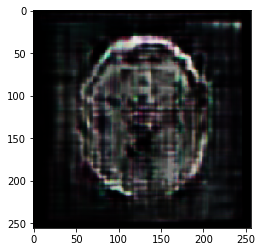

D Real: 0.09541797, D Fake: 0.35104132, G All: 3.3579135
D Real: 0.4471427, D Fake: 0.09460464, G All: 3.8255641
D Real: 0.2574352, D Fake: 0.03611983, G All: 3.6587949
D Real: 0.14922209, D Fake: 0.053442024, G All: 2.8951962
D Real: 0.058187857, D Fake: 0.25284457, G All: 2.8829417
D Real: 0.3327183, D Fake: 0.15425564, G All: 2.802698
D Real: 0.07310848, D Fake: 0.16710263, G All: 3.1400023
D Real: 0.089013904, D Fake: 0.09385838, G All: 3.3796864
D Real: 0.071336895, D Fake: 0.05546576, G All: 3.9177096
D Real: 0.41990688, D Fake: 0.13596147, G All: 3.4392717
D Real: 0.0579512, D Fake: 0.13471773, G All: 3.580746
D Real: 0.10672799, D Fake: 0.11141935, G All: 3.5824714
D Real: 0.16108115, D Fake: 0.06853779, G All: 3.625896
D Real: 0.042847864, D Fake: 0.078236185, G All: 3.289418
D Real: 0.2134053, D Fake: 0.07146727, G All: 3.5260963
D Real: 0.60171586, D Fake: 0.07077654, G All: 3.5384398
D Real: 0.35250336, D Fake: 0.23670651, G All: 2.3548822
D Real: 0.7404547, D Fake: 0.20779

D Real: 0.18822147, D Fake: 0.03411871, G All: 4.353691
D Real: 0.07587876, D Fake: 0.08925326, G All: 4.6703014
D Real: 0.035381496, D Fake: 0.06485564, G All: 5.7905526
D Real: 0.16183703, D Fake: 0.065790966, G All: 4.8117056
D Real: 0.17370547, D Fake: 0.1343161, G All: 3.6962192
D Real: 0.21021187, D Fake: 0.10650836, G All: 2.8372936
D Real: 0.06849398, D Fake: 0.25323176, G All: 2.1632867
D Real: 0.3970773, D Fake: 0.1859014, G All: 2.6321468
D Real: 0.25676605, D Fake: 0.16434528, G All: 2.2261767
D Real: 0.057702973, D Fake: 0.25220132, G All: 3.5731413
D Real: 0.06492244, D Fake: 0.059936136, G All: 5.0486145
D Real: 0.09920341, D Fake: 0.04637363, G All: 4.973242
D Real: 0.45348573, D Fake: 0.060958214, G All: 4.1171985
D Real: 0.061898943, D Fake: 0.035432097, G All: 3.8458297
D Real: 0.030852359, D Fake: 0.04934758, G All: 3.2119355
D Real: 0.2550108, D Fake: 0.10257995, G All: 2.3292418
D Real: 0.27726674, D Fake: 0.5019137, G All: 1.579812
D Real: 0.050287798, D Fake: 0.

D Real: 0.053189464, D Fake: 0.10459141, G All: 1.5801287
D Real: 0.048143663, D Fake: 0.4381775, G All: 2.1695955
D Real: 0.054360837, D Fake: 0.21394598, G All: 3.165134
D Real: 0.038487762, D Fake: 0.050106812, G All: 4.8940506
D Real: 0.06925486, D Fake: 0.061931793, G All: 5.2991123
D Real: 0.051449522, D Fake: 0.02670236, G All: 6.315748
D Real: 0.3016641, D Fake: 0.031699628, G All: 6.427765
D Real: 1.2945831, D Fake: 0.04016359, G All: 4.6523695
D Real: 0.05911047, D Fake: 0.14048508, G All: 2.9514654
D Real: 0.055311847, D Fake: 0.11766973, G All: 2.281254
D Real: 0.055307835, D Fake: 0.25627303, G All: 2.3760304
D Real: 0.04711504, D Fake: 0.23089185, G All: 3.2037416
D Real: 0.04319028, D Fake: 0.08581063, G All: 5.198634
D Real: 0.5370604, D Fake: 0.038288854, G All: 5.0796633
D Real: 0.13547821, D Fake: 0.045327052, G All: 4.378231
D Real: 0.29845873, D Fake: 0.1987873, G All: 4.0519676
D Real: 0.107257776, D Fake: 0.08093184, G All: 3.836446
D Real: 0.07695003, D Fake: 0.

D Real: 0.16858737, D Fake: 0.042440273, G All: 3.805286
D Real: 0.2847087, D Fake: 0.06500991, G All: 4.2109013
D Real: 0.09450843, D Fake: 0.17840044, G All: 3.1456938
D Real: 0.35590214, D Fake: 0.22552612, G All: 2.781808
D Real: 0.19111471, D Fake: 0.49001172, G All: 2.6173007
D Real: 0.43553558, D Fake: 0.11684826, G All: 3.5569782
D Real: 0.16920881, D Fake: 0.60783505, G All: 4.023843
D Real: 0.5306088, D Fake: 0.059085302, G All: 4.4073
D Real: 0.07171711, D Fake: 0.05344768, G All: 4.6023307
D Real: 0.15448281, D Fake: 0.02706313, G All: 4.4241138
D Real: 0.48286986, D Fake: 0.35996777, G All: 4.5840793
D Real: 0.24815716, D Fake: 0.1382029, G All: 2.8505628
D Real: 0.077683344, D Fake: 0.13708544, G All: 2.8267567
D Real: 0.43674088, D Fake: 0.14057103, G All: 2.6343102
D Real: 0.23193389, D Fake: 0.25994506, G All: 2.1924345
D Real: 0.052616168, D Fake: 0.11585648, G All: 2.4555683
D Real: 0.040160976, D Fake: 0.50686234, G All: 3.819261
D Real: 0.8376334, D Fake: 0.1217405

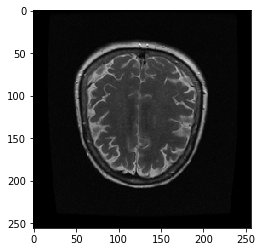

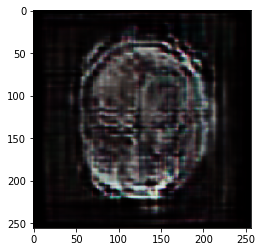

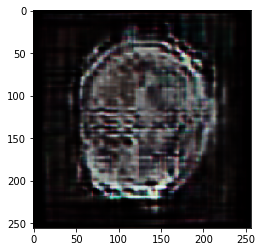

D Real: 0.13835603, D Fake: 0.17863305, G All: 3.813283
D Real: 0.050818864, D Fake: 0.07352461, G All: 3.6807733
D Real: 0.057483025, D Fake: 0.08011146, G All: 3.4972606
D Real: 0.032331645, D Fake: 0.060966574, G All: 3.6568027
D Real: 0.07401414, D Fake: 0.047676653, G All: 3.5022173
D Real: 0.2833378, D Fake: 0.07944713, G All: 3.767918
D Real: 0.08167198, D Fake: 0.07057357, G All: 3.0468075
D Real: 0.13537243, D Fake: 0.11373269, G All: 2.8296826
D Real: 0.05945948, D Fake: 0.18842036, G All: 2.7785335
D Real: 0.09271614, D Fake: 0.21001214, G All: 2.0537362
D Real: 0.10736244, D Fake: 0.11070081, G All: 3.2108016
D Real: 0.079933345, D Fake: 0.178644, G All: 2.8967562
D Real: 0.22766058, D Fake: 0.078358494, G All: 3.8003964
D Real: 0.4869, D Fake: 0.045850232, G All: 3.6208289
D Real: 0.034891315, D Fake: 0.0806515, G All: 2.6304278
D Real: 0.4847497, D Fake: 0.11059062, G All: 2.1622894
D Real: 0.030961506, D Fake: 0.47767088, G All: 2.2523036
D Real: 0.029636644, D Fake: 0.1

D Real: 0.077397905, D Fake: 0.043308727, G All: 5.5814285
D Real: 0.13333078, D Fake: 0.03638246, G All: 5.424323
D Real: 0.2941221, D Fake: 0.03731389, G All: 4.36547
D Real: 0.20163038, D Fake: 0.040250327, G All: 3.1449413
D Real: 0.06029146, D Fake: 0.09090856, G All: 2.2784576
D Real: 0.043113552, D Fake: 0.5270929, G All: 2.4048145
D Real: 0.034863655, D Fake: 0.25999898, G All: 3.3078759
D Real: 0.07596004, D Fake: 0.049755067, G All: 4.7851443
D Real: 0.032258496, D Fake: 0.03487965, G All: 5.7691364
D Real: 0.09940208, D Fake: 0.045379896, G All: 6.300746
D Real: 0.9167233, D Fake: 0.039576937, G All: 5.0628085
D Real: 0.04180626, D Fake: 0.05851505, G All: 3.5662022
D Real: 0.43268028, D Fake: 0.12120109, G All: 2.1513617
D Real: 0.045852643, D Fake: 0.5088027, G All: 1.3123999
D Real: 0.0636584, D Fake: 0.2986518, G All: 1.7281735
D Real: 0.041950118, D Fake: 0.3261609, G All: 2.5917258
D Real: 0.03386636, D Fake: 0.061290644, G All: 4.372593
D Real: 0.06807811, D Fake: 0.0

D Real: 0.29394698, D Fake: 0.3213451, G All: 2.0367436
D Real: 0.043251645, D Fake: 0.114880666, G All: 3.1068149
D Real: 0.053373244, D Fake: 0.1519512, G All: 3.7889247
D Real: 1.4785993, D Fake: 0.17983195, G All: 2.9061542
D Real: 0.19120374, D Fake: 0.70085955, G All: 2.8128333
D Real: 0.048801962, D Fake: 0.115744784, G All: 3.506194
D Real: 0.03376317, D Fake: 0.17285705, G All: 3.697857
D Real: 0.051973913, D Fake: 0.10769455, G All: 4.275195
D Real: 0.055545896, D Fake: 0.07278843, G All: 4.3101277
D Real: 0.12385812, D Fake: 0.13993081, G All: 4.6510773
D Real: 0.45142356, D Fake: 0.043884315, G All: 3.8167377
D Real: 0.445127, D Fake: 0.08403196, G All: 3.6006227
D Real: 0.04039924, D Fake: 0.3976122, G All: 3.01208
D Real: 0.05843664, D Fake: 0.15619339, G All: 3.7551894
D Real: 0.047657534, D Fake: 0.24239045, G All: 4.0388527
D Real: 0.6354154, D Fake: 0.05242586, G All: 4.832927
D Real: 0.5217533, D Fake: 0.0695935, G All: 3.542667
D Real: 0.4046704, D Fake: 0.059350137

D Real: 0.30410314, D Fake: 0.37130493, G All: 3.0062842
D Real: 0.044394135, D Fake: 0.14261039, G All: 2.1496603
D Real: 0.76055324, D Fake: 0.2599672, G All: 2.3480444
D Real: 0.041684873, D Fake: 0.33080938, G All: 2.6360326
D Real: 0.03243556, D Fake: 0.107162714, G All: 3.592073
D Real: 0.052398965, D Fake: 0.20395342, G All: 3.805147
D Real: 0.051785693, D Fake: 0.103357285, G All: 3.9410071
D Real: 0.088205025, D Fake: 0.076105654, G All: 4.987341
D Real: 0.04643759, D Fake: 0.073084, G All: 5.6496058
D Real: 0.079750665, D Fake: 0.04074207, G All: 6.428054
D Real: 0.2661907, D Fake: 0.060906023, G All: 5.362586
D Real: 0.26092082, D Fake: 0.04414018, G All: 5.3032813
D Real: 0.65079737, D Fake: 0.08456199, G All: 3.0454903
D Real: 0.16052935, D Fake: 0.22394913, G All: 1.5081751
D Real: 0.050652884, D Fake: 0.33892518, G All: 1.5796704
D Real: 0.058120426, D Fake: 0.8565336, G All: 2.7292554
D Real: 0.044932164, D Fake: 0.10351814, G All: 4.8849115
D Real: 0.052542903, D Fake:

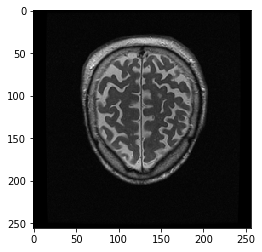

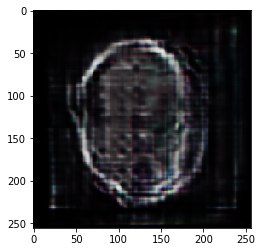

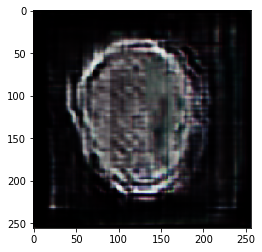

D Real: 0.65874934, D Fake: 0.15466414, G All: 3.4644938
D Real: 1.7808212, D Fake: 0.15495631, G All: 1.4364141
D Real: 0.064433254, D Fake: 0.4479294, G All: 1.2405648
D Real: 0.05198157, D Fake: 0.47731966, G All: 1.8944747
D Real: 0.031369977, D Fake: 0.15062973, G All: 2.6548266
D Real: 0.09867074, D Fake: 0.09064088, G All: 3.2794464
D Real: 0.19804832, D Fake: 0.043477893, G All: 4.2216606
D Real: 0.33848143, D Fake: 0.053392652, G All: 3.499292
D Real: 0.17904365, D Fake: 0.034552947, G All: 2.8746817
D Real: 0.121743605, D Fake: 0.24599302, G All: 3.2099304
D Real: 0.04037504, D Fake: 0.44653824, G All: 2.4737864
D Real: 0.090947196, D Fake: 0.20332898, G All: 2.6151228
D Real: 0.06277466, D Fake: 0.0931364, G All: 4.4890943
D Real: 0.15993519, D Fake: 0.09246642, G All: 4.480708
D Real: 0.47530985, D Fake: 0.041591294, G All: 4.771544
D Real: 0.40415218, D Fake: 0.04852093, G All: 2.0889378
D Real: 0.64060116, D Fake: 0.38863495, G All: 1.0249372
D Real: 0.08543047, D Fake: 1

D Real: 0.10071814, D Fake: 0.2740486, G All: 3.680388
D Real: 0.075381935, D Fake: 0.23237775, G All: 3.9193144
D Real: 0.14543301, D Fake: 0.09968373, G All: 4.3007083
D Real: 0.8159702, D Fake: 0.08766236, G All: 3.6785896
D Real: 0.19923829, D Fake: 0.10585642, G All: 3.199051
D Real: 0.04109136, D Fake: 0.072935686, G All: 2.8897572
D Real: 0.3025321, D Fake: 0.1390895, G All: 2.0426085
D Real: 0.03840576, D Fake: 0.4619868, G All: 2.3709478
D Real: 0.09507853, D Fake: 0.18563719, G All: 2.7943459
D Real: 0.22416626, D Fake: 0.045285173, G All: 2.771824
D Real: 0.16777566, D Fake: 0.17418244, G All: 3.5271373
D Real: 0.111689195, D Fake: 0.054451317, G All: 2.9964218
D Real: 0.36431724, D Fake: 0.11833252, G All: 3.3049629
D Real: 0.070813745, D Fake: 0.037195005, G All: 3.7832026
D Real: 0.053765602, D Fake: 0.19510055, G All: 2.905335
D Real: 0.041920617, D Fake: 0.20292562, G All: 4.434631
D Real: 0.04347165, D Fake: 0.07769976, G All: 4.5101213
D Real: 0.15908533, D Fake: 0.07

D Real: 0.13440719, D Fake: 0.28050882, G All: 3.2368011
D Real: 0.1740267, D Fake: 0.21400215, G All: 3.984967
D Real: 0.06535745, D Fake: 0.19922903, G All: 4.4836087
D Real: 0.05390429, D Fake: 0.041356336, G All: 4.840062
D Real: 0.12828386, D Fake: 0.04426094, G All: 5.7693005
D Real: 0.60221076, D Fake: 0.03457375, G All: 4.428419
D Real: 0.04590769, D Fake: 0.048172906, G All: 2.923933
D Real: 0.08851364, D Fake: 0.0817549, G All: 3.302257
D Real: 0.72876036, D Fake: 0.1234373, G All: 1.557251
D Real: 0.1911671, D Fake: 1.2871902, G All: 1.3419032
D Real: 0.022632122, D Fake: 0.45331162, G All: 2.5195453
D Real: 0.18097484, D Fake: 0.17445393, G All: 4.3932414
D Real: 0.39731705, D Fake: 0.09343756, G All: 4.5670958
D Real: 0.20184708, D Fake: 0.060273107, G All: 4.8716526
D Real: 0.58767617, D Fake: 0.040884797, G All: 4.1669574
D Real: 0.19243428, D Fake: 0.041867606, G All: 2.2152617
D Real: 0.06770483, D Fake: 0.39730948, G All: 2.1184058
D Real: 0.3109803, D Fake: 0.3753776

D Real: 0.9585749, D Fake: 0.10288387, G All: 3.3758392
D Real: 0.034676768, D Fake: 0.08280185, G All: 1.780683
D Real: 0.0567523, D Fake: 0.20391035, G All: 2.4648497
D Real: 0.03620861, D Fake: 0.2875039, G All: 2.3000464
D Real: 0.046416674, D Fake: 0.08733049, G All: 3.6104927
D Real: 0.04723274, D Fake: 0.041434333, G All: 4.754121
D Real: 0.44815698, D Fake: 0.07827476, G All: 3.8447223
D Real: 0.77016217, D Fake: 0.053708434, G All: 3.667294
D Real: 0.046303164, D Fake: 0.095194355, G All: 3.2189236
D Real: 0.24426164, D Fake: 0.15139416, G All: 2.6621842
D Real: 0.059840582, D Fake: 0.15021881, G All: 3.4389975
D Real: 0.04766649, D Fake: 0.28536674, G All: 3.316132
D Real: 0.05752342, D Fake: 0.2629668, G All: 4.411035
D Real: 0.40421537, D Fake: 0.13684909, G All: 5.5045977
D Real: 0.6213406, D Fake: 0.063155964, G All: 4.552188
D Real: 0.42571646, D Fake: 0.19982421, G All: 3.7562513
D Real: 0.108613454, D Fake: 0.078018576, G All: 3.8192103
D Real: 0.06391798, D Fake: 0.25

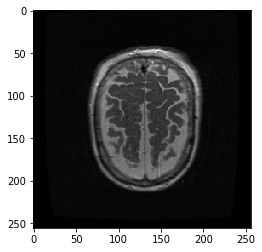

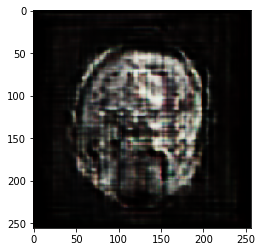

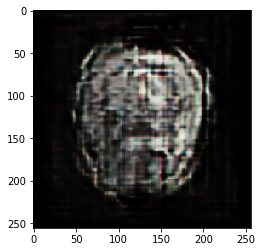

D Real: 0.028264211, D Fake: 0.16172682, G All: 2.8198805
D Real: 0.046415098, D Fake: 0.065812565, G All: 4.7450604
D Real: 0.07685514, D Fake: 0.030870914, G All: 3.927445
D Real: 0.41653857, D Fake: 0.06932176, G All: 5.104948
D Real: 0.057441745, D Fake: 0.052377064, G All: 4.296403
D Real: 0.1062203, D Fake: 0.05924967, G All: 4.2595
D Real: 0.043416403, D Fake: 0.067176804, G All: 4.933845
D Real: 0.10217985, D Fake: 0.03041174, G All: 4.6739326
D Real: 0.11214468, D Fake: 0.09966491, G All: 3.8914728
D Real: 0.054542184, D Fake: 0.1294615, G All: 3.6142373
D Real: 0.06698073, D Fake: 0.059770156, G All: 3.5769253
D Real: 0.112590976, D Fake: 0.12356861, G All: 4.2207165
D Real: 0.05586264, D Fake: 0.034699075, G All: 3.9256551
D Real: 0.070934325, D Fake: 0.1414277, G All: 5.1108418
D Real: 0.8133105, D Fake: 0.03486051, G All: 3.5976489
D Real: 0.13322052, D Fake: 0.15471226, G All: 2.2232397
D Real: 0.10806224, D Fake: 0.098537095, G All: 2.0853455
D Real: 0.055805422, D Fake:

D Real: 0.041052934, D Fake: 0.07227716, G All: 3.9142385
D Real: 0.05088952, D Fake: 0.059223324, G All: 4.4064207
D Real: 0.039354946, D Fake: 0.11659635, G All: 5.909547
D Real: 0.2597415, D Fake: 0.06305083, G All: 5.188094
D Real: 0.81418526, D Fake: 0.19308561, G All: 3.2535586
D Real: 0.053703915, D Fake: 0.13914704, G All: 2.44971
D Real: 0.04905279, D Fake: 0.31499803, G All: 3.2056305
D Real: 0.022629369, D Fake: 0.28143248, G All: 3.2950108
D Real: 0.13836707, D Fake: 0.10720229, G All: 3.3530383
D Real: 0.356713, D Fake: 0.17557713, G All: 3.4006968
D Real: 0.090647906, D Fake: 0.101764336, G All: 3.4772909
D Real: 0.46583417, D Fake: 0.21955523, G All: 2.9665637
D Real: 0.06445655, D Fake: 0.082459845, G All: 3.0467744
D Real: 0.036253173, D Fake: 0.23649818, G All: 2.8803008
D Real: 0.2005235, D Fake: 0.049244132, G All: 3.7708561
D Real: 0.044412814, D Fake: 0.104914695, G All: 4.8160405
D Real: 0.09906337, D Fake: 0.22199391, G All: 4.6337852
D Real: 0.05634743, D Fake:

D Real: 0.04794031, D Fake: 0.3008746, G All: 2.290668
D Real: 0.049869455, D Fake: 0.32549053, G All: 3.7507238
D Real: 0.041884106, D Fake: 0.049163565, G All: 5.7910256
D Real: 0.6881585, D Fake: 0.044779904, G All: 6.4083285
D Real: 0.4080596, D Fake: 0.042003177, G All: 6.396546
D Real: 1.9816552, D Fake: 0.041681543, G All: 5.388679
D Real: 0.29095665, D Fake: 0.066879794, G All: 2.8278365
D Real: 0.10866486, D Fake: 0.33193544, G All: 2.4090729
D Real: 0.12342936, D Fake: 0.35683417, G All: 1.6324087
D Real: 0.061783135, D Fake: 0.5554095, G All: 2.1119125
D Real: 0.057753406, D Fake: 0.17644086, G All: 3.937364
D Real: 0.0415631, D Fake: 0.07403977, G All: 4.1041174
D Real: 0.060575686, D Fake: 0.03406274, G All: 6.305255
D Real: 0.07221115, D Fake: 0.07564137, G All: 6.349207
D Real: 0.15974452, D Fake: 0.036822706, G All: 5.5849156
D Real: 0.05643805, D Fake: 0.039345145, G All: 6.151807
D Real: 0.07084653, D Fake: 0.06422469, G All: 7.1310306
D Real: 1.5468609, D Fake: 0.037

D Real: 0.038090535, D Fake: 0.24505466, G All: 3.7059858
D Real: 0.08565869, D Fake: 0.12635446, G All: 3.597789
D Real: 0.2866882, D Fake: 0.30474615, G All: 4.1542406
D Real: 0.033254497, D Fake: 0.040072206, G All: 4.8884764
D Real: 0.18015653, D Fake: 0.032525174, G All: 4.941239
D Real: 0.16456045, D Fake: 0.05491101, G All: 4.0172186
D Real: 0.17711362, D Fake: 0.036641806, G All: 3.813972
D Real: 0.31888855, D Fake: 0.106727585, G All: 2.6598015
D Real: 0.13375653, D Fake: 0.19083537, G All: 2.589005
D Real: 0.043738447, D Fake: 0.64078593, G All: 2.8502088
D Real: 0.024047675, D Fake: 0.08549382, G All: 3.747438
D Real: 0.042608216, D Fake: 0.25874507, G All: 4.439588
D Real: 0.11547923, D Fake: 0.044389393, G All: 4.7184563
D Real: 0.033988323, D Fake: 0.05612439, G All: 5.6246843
D Real: 0.20887059, D Fake: 0.023587082, G All: 6.1710453
D Real: 0.14381588, D Fake: 0.046644807, G All: 5.3163586
D Real: 0.108619004, D Fake: 0.06276427, G All: 4.862473
D Real: 0.069168314, D Fa

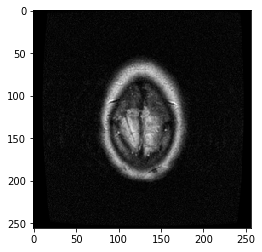

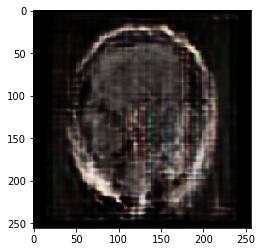

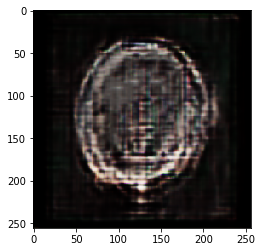

D Real: 0.11107664, D Fake: 0.14167204, G All: 2.9225755
D Real: 0.052848123, D Fake: 0.18455929, G All: 1.817567
D Real: 0.106959194, D Fake: 0.39824945, G All: 2.8774748
D Real: 0.16769126, D Fake: 0.2644356, G All: 3.9439695
D Real: 0.061264873, D Fake: 0.09482032, G All: 3.9180279
D Real: 0.18323073, D Fake: 0.056625757, G All: 5.8688025
D Real: 1.1048732, D Fake: 0.048361927, G All: 4.424693
D Real: 0.06114402, D Fake: 0.050763596, G All: 3.0209534
D Real: 0.12429169, D Fake: 0.083336286, G All: 1.551942
D Real: 0.04181384, D Fake: 0.85314626, G All: 1.9121323
D Real: 0.22720277, D Fake: 0.5682503, G All: 2.2329555
D Real: 0.05973336, D Fake: 0.19041708, G All: 3.6193373
D Real: 0.5087344, D Fake: 0.043181624, G All: 5.443085
D Real: 0.031123176, D Fake: 0.05128783, G All: 5.6052394
D Real: 0.07514931, D Fake: 0.07097185, G All: 6.0358315
D Real: 1.0152211, D Fake: 0.04866767, G All: 4.7478094
D Real: 0.19082944, D Fake: 0.04304665, G All: 4.5732822
D Real: 0.06096412, D Fake: 0.2

D Real: 0.25514054, D Fake: 0.4070407, G All: 4.7816863
D Real: 0.21117836, D Fake: 0.058271643, G All: 3.6504376
D Real: 0.41204563, D Fake: 0.05665446, G All: 5.258849
D Real: 0.5860406, D Fake: 0.04359128, G All: 3.9967716
D Real: 0.10058376, D Fake: 0.38722444, G All: 3.3629038
D Real: 0.35584566, D Fake: 0.37912548, G All: 3.2200627
D Real: 0.14858854, D Fake: 0.060075063, G All: 3.1628356
D Real: 0.19098261, D Fake: 0.2361665, G All: 3.1786768
D Real: 0.042311184, D Fake: 0.20982975, G All: 4.1886415
D Real: 0.14372526, D Fake: 0.0734476, G All: 4.707669
D Real: 0.5196234, D Fake: 0.056095395, G All: 3.6736627
D Real: 0.15322858, D Fake: 0.35561046, G All: 3.4754422
D Real: 0.59433436, D Fake: 0.16655472, G All: 3.1422148
D Real: 0.06843483, D Fake: 0.48537952, G All: 3.6424675
D Real: 0.047454886, D Fake: 0.053217385, G All: 4.120202
D Real: 0.074746676, D Fake: 0.034126688, G All: 3.8263829
D Real: 0.3116219, D Fake: 0.06753202, G All: 3.803099
D Real: 0.0369558, D Fake: 0.0912

D Real: 0.052948933, D Fake: 0.07122813, G All: 4.118674
D Real: 0.05373247, D Fake: 0.109077945, G All: 3.8543706
D Real: 0.03350047, D Fake: 0.12145214, G All: 4.005602
D Real: 0.03539157, D Fake: 0.08903685, G All: 3.9899664
D Real: 0.12261818, D Fake: 0.054985087, G All: 4.790209
D Real: 0.07153098, D Fake: 0.061577782, G All: 4.1511173
D Real: 0.116337, D Fake: 0.09834138, G All: 3.3393497
D Real: 0.57514495, D Fake: 0.31975552, G All: 2.8625827
D Real: 0.06150655, D Fake: 0.14504603, G All: 3.1932669
D Real: 0.10017769, D Fake: 0.11706632, G All: 4.344718
D Real: 0.034949563, D Fake: 0.20739481, G All: 3.9096196
D Real: 0.8327173, D Fake: 0.1754862, G All: 3.9772632
D Real: 0.061441816, D Fake: 0.050265126, G All: 3.2455144
D Real: 0.6641197, D Fake: 0.11385812, G All: 2.0899777
D Real: 0.059961498, D Fake: 0.38997713, G All: 1.4039947
D Real: 0.028629612, D Fake: 0.21712235, G All: 3.149868
D Real: 0.06818607, D Fake: 0.14581238, G All: 3.438599
D Real: 0.06391241, D Fake: 0.118

D Real: 0.04865372, D Fake: 0.1513207, G All: 3.069598
D Real: 0.046042614, D Fake: 0.15708129, G All: 3.0136385
D Real: 0.044536337, D Fake: 0.06266392, G All: 3.7900326
D Real: 0.27352408, D Fake: 0.036213964, G All: 3.3101137
D Real: 0.0494688, D Fake: 0.08009521, G All: 3.419966
D Real: 0.1863983, D Fake: 0.24985194, G All: 3.2700765
D Real: 0.056763295, D Fake: 0.07751557, G All: 3.3841596
D Real: 0.2127814, D Fake: 0.12103421, G All: 3.4072208
D Real: 0.04597795, D Fake: 0.31618226, G All: 3.930442
D Real: 0.06494984, D Fake: 0.06748226, G All: 4.5242605
D Real: 0.059207894, D Fake: 0.21317783, G All: 4.895291
D Real: 0.63503325, D Fake: 0.08301883, G All: 4.8473315
D Real: 0.40454885, D Fake: 0.04314497, G All: 3.3903174
D Real: 0.51714635, D Fake: 0.1574831, G All: 2.2833917
D Real: 0.10420171, D Fake: 0.3461775, G All: 2.3324368
D Real: 0.2851688, D Fake: 0.14409016, G All: 2.4091923
D Real: 0.13748513, D Fake: 0.55045736, G All: 2.5088267
D Real: 0.117502935, D Fake: 0.198556

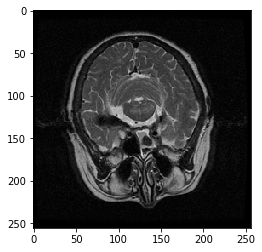

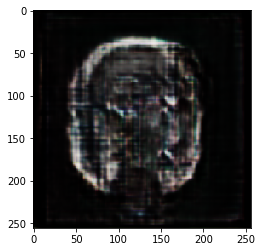

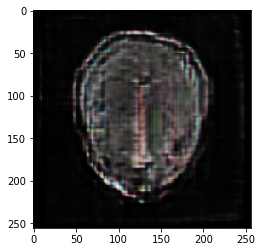

D Real: 0.06890107, D Fake: 0.15738657, G All: 4.0370965
D Real: 0.029316148, D Fake: 0.08401309, G All: 4.0821705
D Real: 0.89655215, D Fake: 0.2912206, G All: 2.9319534
D Real: 0.4943816, D Fake: 0.21135028, G All: 2.0521488
D Real: 0.13631223, D Fake: 0.87496626, G All: 2.8061984
D Real: 0.035201453, D Fake: 0.24379456, G All: 3.763751
D Real: 0.62119126, D Fake: 0.45952734, G All: 4.7543745
D Real: 0.03701985, D Fake: 0.038881883, G All: 5.050721
D Real: 0.16469213, D Fake: 0.03748498, G All: 4.9098964
D Real: 0.08258774, D Fake: 0.039528366, G All: 5.260852
D Real: 0.13489199, D Fake: 0.05688959, G All: 5.714657
D Real: 0.107929565, D Fake: 0.04192982, G All: 4.5323796
D Real: 0.0693609, D Fake: 0.35225862, G All: 3.9913862
D Real: 0.34440637, D Fake: 0.044206202, G All: 3.9209208
D Real: 0.10635771, D Fake: 0.048275806, G All: 2.3035629
D Real: 0.04880839, D Fake: 0.34161216, G All: 3.2910554
D Real: 0.045923367, D Fake: 0.21840936, G All: 3.0295873
D Real: 0.036633797, D Fake: 0

D Real: 0.04021977, D Fake: 0.12320852, G All: 5.4869976
D Real: 0.4173496, D Fake: 0.04164403, G All: 4.630307
D Real: 0.03402777, D Fake: 0.06722813, G All: 5.2907996
D Real: 0.09363827, D Fake: 0.07281238, G All: 4.232586
D Real: 0.2931043, D Fake: 0.25622794, G All: 3.5807977
D Real: 0.039121605, D Fake: 0.2250861, G All: 3.0305443
D Real: 0.07447444, D Fake: 0.095735714, G All: 3.9530008
D Real: 0.1653755, D Fake: 0.07850125, G All: 4.1887436
D Real: 0.06052942, D Fake: 0.04605744, G All: 3.688089
D Real: 0.6092811, D Fake: 0.35720992, G All: 2.7328434
D Real: 0.07494283, D Fake: 1.2327455, G All: 3.3013482
D Real: 0.7183272, D Fake: 0.14398307, G All: 4.3964105
D Real: 0.7907262, D Fake: 0.14802961, G All: 3.9451878
D Real: 0.118856594, D Fake: 0.045511115, G All: 5.0268135
D Real: 0.078386694, D Fake: 0.09831031, G All: 4.825927
D Real: 0.2807506, D Fake: 0.05602158, G All: 4.0623903
D Real: 1.0462668, D Fake: 0.45031926, G All: 2.9236975
D Real: 0.14715326, D Fake: 0.31882444, 

D Real: 0.068499476, D Fake: 0.07980153, G All: 3.1456594
D Real: 0.1510998, D Fake: 0.41590387, G All: 4.059269
D Real: 0.07219466, D Fake: 0.1550391, G All: 3.9448586
D Real: 0.12187317, D Fake: 0.031539813, G All: 4.77499
D Real: 0.060977757, D Fake: 0.04344017, G All: 5.159699
D Real: 0.716664, D Fake: 0.2030926, G All: 3.556683
D Real: 0.03577854, D Fake: 0.0597763, G All: 3.0814288
D Real: 0.1267964, D Fake: 0.30822423, G All: 2.7629583
D Real: 0.13912499, D Fake: 0.3281556, G All: 3.5524578
D Real: 0.42086852, D Fake: 0.10685781, G All: 2.3788452
D Real: 0.29062873, D Fake: 0.3690593, G All: 2.331464
D Real: 0.17113367, D Fake: 0.5073119, G All: 2.5935698
D Real: 0.09041069, D Fake: 0.12775831, G All: 4.395646
D Real: 0.13739881, D Fake: 0.04518371, G All: 4.2305446
D Real: 0.03766429, D Fake: 0.047339506, G All: 4.9713893
D Real: 0.27183315, D Fake: 0.03541426, G All: 5.6346717
D Real: 0.9547496, D Fake: 0.2093928, G All: 2.9893258
D Real: 0.07577474, D Fake: 0.8064151, G All: 

D Real: 0.057921935, D Fake: 0.15477757, G All: 4.490553
D Real: 0.32886952, D Fake: 0.026377173, G All: 5.208795
D Real: 0.6183234, D Fake: 0.043956853, G All: 3.7956123
D Real: 0.3541436, D Fake: 0.11637556, G All: 2.210847
D Real: 0.23992504, D Fake: 0.3518557, G All: 2.2293983
D Real: 0.072518155, D Fake: 0.44901204, G All: 2.5968628
D Real: 0.38095993, D Fake: 0.2397598, G All: 2.8788986
D Real: 0.26027587, D Fake: 0.24317256, G All: 2.3267858
D Real: 0.070654735, D Fake: 0.24313931, G All: 2.9266
D Real: 0.30863523, D Fake: 0.51081467, G All: 2.8490381
D Real: 0.27768743, D Fake: 0.14708744, G All: 3.0340145
D Real: 0.18934, D Fake: 0.2267884, G All: 4.060616
D Real: 0.7252876, D Fake: 0.04574019, G All: 3.0574975
D Real: 0.08510358, D Fake: 0.4267811, G All: 2.8222108
D Real: 0.17096794, D Fake: 0.30289078, G All: 3.0910323
D Real: 0.18622816, D Fake: 0.042892225, G All: 3.777676
D Real: 0.6931484, D Fake: 0.090101294, G All: 2.302608
D Real: 0.17449254, D Fake: 0.45806837, G Al

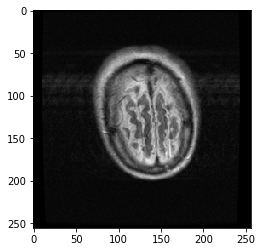

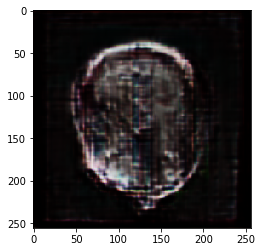

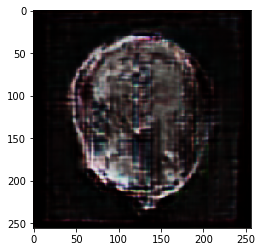

D Real: 0.3272159, D Fake: 0.42480916, G All: 1.9258614
D Real: 0.20816311, D Fake: 1.3501642, G All: 3.066694
D Real: 0.063253835, D Fake: 0.06478747, G All: 3.3788888
D Real: 0.09030351, D Fake: 0.053988606, G All: 3.9220934
D Real: 0.3903198, D Fake: 0.0390368, G All: 5.0704947
D Real: 0.36780694, D Fake: 0.4350157, G All: 3.880697
D Real: 0.24364436, D Fake: 0.049077168, G All: 4.250348
D Real: 0.123760745, D Fake: 0.09772602, G All: 2.4269152
D Real: 0.044794977, D Fake: 0.7619343, G All: 2.4128385
D Real: 0.08103131, D Fake: 0.1189183, G All: 2.781205
D Real: 0.059680857, D Fake: 0.19798641, G All: 3.9979353
D Real: 0.14236729, D Fake: 0.08767855, G All: 4.151993
D Real: 0.19619605, D Fake: 0.11703394, G All: 3.635582
D Real: 0.12997302, D Fake: 0.05711454, G All: 3.432759
D Real: 0.55794483, D Fake: 0.058467332, G All: 3.385907
D Real: 0.4071687, D Fake: 0.11575965, G All: 2.876317
D Real: 0.3221337, D Fake: 0.54263365, G All: 1.7068346
D Real: 0.25514597, D Fake: 0.5536206, G A

D Real: 0.9627095, D Fake: 0.3136713, G All: 2.175969
D Real: 0.30111575, D Fake: 0.3362739, G All: 1.7183993
D Real: 0.038942277, D Fake: 1.0539593, G All: 1.8373646
D Real: 0.058336914, D Fake: 0.5915611, G All: 3.5693035
D Real: 0.03365489, D Fake: 0.14471246, G All: 3.8914957
D Real: 0.37610877, D Fake: 0.043614347, G All: 4.998539
D Real: 1.1287644, D Fake: 0.032856457, G All: 5.510822
D Real: 0.566289, D Fake: 0.027965112, G All: 4.6108756
D Real: 0.086378425, D Fake: 0.17860395, G All: 3.6433055
D Real: 0.07535677, D Fake: 0.04412211, G All: 2.6709523
D Real: 0.03105668, D Fake: 0.28915694, G All: 2.19594
D Real: 0.06301086, D Fake: 0.16311398, G All: 3.4997993
D Real: 0.038362876, D Fake: 0.74088734, G All: 4.0686007
D Real: 0.10223212, D Fake: 0.5011502, G All: 3.7589655
D Real: 0.25549173, D Fake: 0.04358022, G All: 4.4810295
D Real: 1.5890713, D Fake: 0.11926812, G All: 3.758944
D Real: 0.04470094, D Fake: 0.04252874, G All: 3.1629279
D Real: 0.07981509, D Fake: 0.33514187, 

D Real: 0.2677455, D Fake: 0.09402856, G All: 2.6396062
D Real: 0.12643072, D Fake: 0.07148806, G All: 3.585689
D Real: 0.31602967, D Fake: 0.5523676, G All: 3.3044271
D Real: 0.0552506, D Fake: 0.10641603, G All: 2.3207197
D Real: 0.18585813, D Fake: 0.10828136, G All: 3.1159186
D Real: 0.2928444, D Fake: 0.14366862, G All: 2.288155
D Real: 0.061715424, D Fake: 0.25775996, G All: 3.0133708
D Real: 0.37096435, D Fake: 0.302761, G All: 3.58811
D Real: 0.078920186, D Fake: 0.069175564, G All: 4.309863
D Real: 0.15451422, D Fake: 0.09126383, G All: 2.948432
D Real: 0.048933893, D Fake: 0.06443298, G All: 3.969035
D Real: 0.4136623, D Fake: 0.23668051, G All: 3.969711
D Real: 0.14695549, D Fake: 0.07308598, G All: 3.7610192
D Real: 0.37910488, D Fake: 0.069121435, G All: 2.904602
D Real: 0.40311995, D Fake: 0.1317705, G All: 1.6290269
D Real: 0.08541651, D Fake: 0.46141082, G All: 2.0756001
D Real: 0.040778242, D Fake: 0.34443808, G All: 1.9579101
D Real: 0.027823286, D Fake: 0.23398547, G

D Real: 0.15821102, D Fake: 0.046262003, G All: 4.225662
D Real: 0.2798459, D Fake: 0.043973677, G All: 3.4896853
D Real: 1.063502, D Fake: 0.42888266, G All: 2.02846
D Real: 0.1787815, D Fake: 0.37384522, G All: 2.1554158
D Real: 0.04153432, D Fake: 0.3627922, G All: 2.3374286
D Real: 0.039482176, D Fake: 0.2605316, G All: 2.890297
D Real: 0.040297776, D Fake: 0.08805789, G All: 3.479662
D Real: 0.10411739, D Fake: 0.064571664, G All: 4.932256
D Real: 0.58937395, D Fake: 0.037977014, G All: 4.278957
D Real: 0.41672415, D Fake: 0.03233698, G All: 3.850299
D Real: 0.14187194, D Fake: 0.17256296, G All: 2.5379305
D Real: 0.36381724, D Fake: 0.4564004, G All: 2.5551624
D Real: 0.40450436, D Fake: 0.22572652, G All: 1.7758014
D Real: 0.09525503, D Fake: 0.61753607, G All: 1.1353059
D Real: 0.037035115, D Fake: 0.6494105, G All: 2.8616123
D Real: 0.22434546, D Fake: 0.07060114, G All: 3.108856
D Real: 0.046073534, D Fake: 0.073240906, G All: 4.0362334
D Real: 0.34677157, D Fake: 0.1663607, 

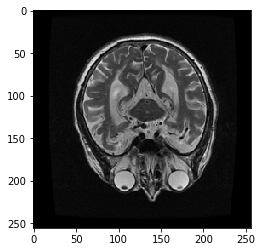

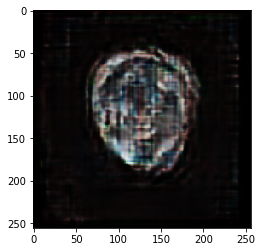

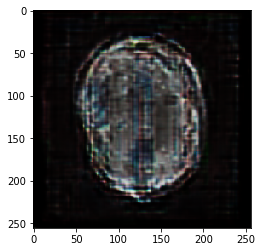

D Real: 0.061992407, D Fake: 0.28832698, G All: 3.137231
D Real: 1.8272028, D Fake: 0.33045924, G All: 3.5286918
D Real: 0.11593319, D Fake: 0.25238654, G All: 3.7955782
D Real: 0.10498627, D Fake: 0.11959616, G All: 2.9802494
D Real: 0.17181812, D Fake: 0.16841924, G All: 3.8877199
D Real: 0.71675885, D Fake: 0.25460297, G All: 2.5982978
D Real: 0.25844774, D Fake: 0.12426302, G All: 2.7953267
D Real: 0.29380566, D Fake: 0.44007498, G All: 2.178224
D Real: 0.80241203, D Fake: 0.11125122, G All: 1.1113371
D Real: 0.04987482, D Fake: 0.83101976, G All: 1.4833503
D Real: 0.09726966, D Fake: 0.29373622, G All: 2.9856215
D Real: 0.18149728, D Fake: 0.16981745, G All: 3.821941
D Real: 0.18308298, D Fake: 0.120526366, G All: 4.8141975
D Real: 0.7103307, D Fake: 0.06546322, G All: 4.3275433
D Real: 1.0919043, D Fake: 0.13129747, G All: 3.3433278
D Real: 0.31294113, D Fake: 0.16676691, G All: 1.510397
D Real: 0.044853054, D Fake: 0.45809785, G All: 1.5626261
D Real: 0.13585684, D Fake: 0.61067

D Real: 0.05458262, D Fake: 0.37765074, G All: 1.8304915
D Real: 0.12322653, D Fake: 0.48871845, G All: 1.5483333
D Real: 0.12851116, D Fake: 0.61643505, G All: 2.43289
D Real: 0.049585342, D Fake: 0.11007932, G All: 3.6120958
D Real: 0.04178122, D Fake: 0.056948457, G All: 5.8646493
D Real: 0.52653134, D Fake: 0.106898084, G All: 5.746401
D Real: 1.5699397, D Fake: 0.06401989, G All: 3.882596
D Real: 0.10767829, D Fake: 0.45837024, G All: 3.2881017
D Real: 0.048438333, D Fake: 0.47372845, G All: 2.4140642
D Real: 0.33317834, D Fake: 0.2841813, G All: 2.3137722
D Real: 0.31149268, D Fake: 0.14612931, G All: 2.39383
D Real: 0.045631267, D Fake: 0.17594093, G All: 3.019605
D Real: 0.04205053, D Fake: 0.28979167, G All: 3.6396751
D Real: 0.15391704, D Fake: 0.09561279, G All: 4.1024323
D Real: 0.43876722, D Fake: 0.061146133, G All: 3.4332333
D Real: 0.8226073, D Fake: 0.25945458, G All: 2.6804266
D Real: 0.14645138, D Fake: 0.294312, G All: 2.0096018
D Real: 0.08731747, D Fake: 0.1624637

D Real: 0.17558765, D Fake: 0.051661562, G All: 6.839571
D Real: 0.2749268, D Fake: 0.092728466, G All: 3.7520247
D Real: 0.035640635, D Fake: 0.11251202, G All: 4.836366
D Real: 0.03605602, D Fake: 0.090347074, G All: 3.0384388
D Real: 0.03410542, D Fake: 0.37903762, G All: 4.1239753
D Real: 0.055361122, D Fake: 0.4694606, G All: 4.5880675
D Real: 0.060458146, D Fake: 0.072891325, G All: 5.315545
D Real: 0.09850416, D Fake: 0.036511727, G All: 4.917081
D Real: 0.14131337, D Fake: 0.035324298, G All: 6.7072625
D Real: 0.6210788, D Fake: 0.025293075, G All: 5.1644506
D Real: 0.28863373, D Fake: 0.049304165, G All: 3.6097336
D Real: 0.7155814, D Fake: 0.32881343, G All: 2.175766
D Real: 0.25206304, D Fake: 0.68789315, G All: 1.374769
D Real: 0.053261757, D Fake: 0.3531443, G All: 2.4284453
D Real: 0.059293408, D Fake: 0.25463134, G All: 2.15028
D Real: 0.19285886, D Fake: 0.14745763, G All: 2.8638096
D Real: 0.04838162, D Fake: 0.123958476, G All: 2.5190184
D Real: 0.03741665, D Fake: 0.

D Real: 0.06915717, D Fake: 0.0989887, G All: 4.492251
D Real: 0.041017447, D Fake: 0.16625279, G All: 4.72727
D Real: 0.041859288, D Fake: 0.09025943, G All: 4.032435
D Real: 0.11433669, D Fake: 0.04373774, G All: 4.8737235
D Real: 0.22312239, D Fake: 0.052062124, G All: 4.800197
D Real: 0.18987575, D Fake: 0.044033006, G All: 2.9395065
D Real: 0.11315631, D Fake: 0.09891909, G All: 2.5675507
D Real: 0.13827227, D Fake: 0.72969484, G All: 2.452826
D Real: 0.029676646, D Fake: 0.1499959, G All: 3.8573704
D Real: 0.042565107, D Fake: 0.077167705, G All: 4.969129
D Real: 0.053638745, D Fake: 0.15510866, G All: 5.114582
D Real: 0.32756472, D Fake: 0.053208936, G All: 5.5437174
D Real: 0.25935724, D Fake: 0.047815807, G All: 4.15119
D Real: 1.1298643, D Fake: 0.14037666, G All: 2.4694443
D Real: 0.09053689, D Fake: 0.38741168, G All: 1.1987602
D Real: 0.04586211, D Fake: 0.71251893, G All: 2.1201406
D Real: 0.058030922, D Fake: 0.55935013, G All: 4.448167
D Real: 0.07462359, D Fake: 0.0457

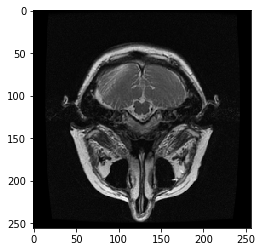

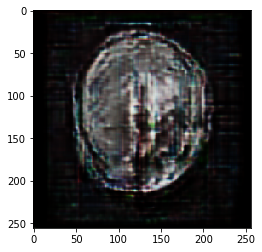

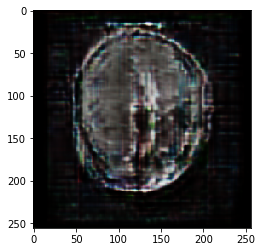

D Real: 0.09634752, D Fake: 0.18797125, G All: 4.5359807
D Real: 0.8605963, D Fake: 0.040712893, G All: 4.532332
D Real: 0.08342135, D Fake: 0.09785797, G All: 4.5963955
D Real: 0.17205122, D Fake: 0.12256967, G All: 4.3927593
D Real: 0.09211883, D Fake: 0.04186404, G All: 4.1029615
D Real: 0.07057504, D Fake: 0.0465046, G All: 3.4214115
D Real: 0.2888826, D Fake: 0.07286234, G All: 3.316056
D Real: 0.06766452, D Fake: 0.06949568, G All: 3.334103
D Real: 0.08104955, D Fake: 0.23024136, G All: 2.7258515
D Real: 0.18255426, D Fake: 0.22938232, G All: 2.3043149
D Real: 0.2489196, D Fake: 0.5533291, G All: 2.9587398
D Real: 0.09835715, D Fake: 0.32102156, G All: 2.2281651
D Real: 0.036523428, D Fake: 0.14119184, G All: 3.0218105
D Real: 0.11480791, D Fake: 0.11469737, G All: 3.1088657
D Real: 0.03931342, D Fake: 0.18527985, G All: 3.456461
D Real: 0.26340342, D Fake: 0.16272877, G All: 4.680025
D Real: 0.070083484, D Fake: 0.2334881, G All: 4.7102413
D Real: 0.8821658, D Fake: 0.20594479, 

D Real: 0.05058805, D Fake: 0.18849209, G All: 4.589689
D Real: 0.3997935, D Fake: 0.1491876, G All: 4.627716
D Real: 0.049498633, D Fake: 0.039315082, G All: 4.646449
D Real: 0.20583795, D Fake: 0.046695992, G All: 5.418248
D Real: 0.10712996, D Fake: 0.058589675, G All: 4.526977
D Real: 0.7883886, D Fake: 0.09912891, G All: 4.864906
D Real: 0.33859968, D Fake: 0.26244766, G All: 1.6543986
D Real: 0.17762834, D Fake: 0.7327073, G All: 1.8593078
D Real: 0.09526933, D Fake: 0.5518869, G All: 3.8754106
D Real: 0.11481847, D Fake: 0.1092228, G All: 3.7310548
D Real: 0.51054657, D Fake: 0.044303343, G All: 4.4571867
D Real: 0.93084764, D Fake: 0.05176279, G All: 3.4092176
D Real: 0.36815202, D Fake: 0.22285785, G All: 2.9597325
D Real: 0.16334169, D Fake: 0.6570149, G All: 2.1021688
D Real: 0.13113488, D Fake: 0.73336726, G All: 2.1838617
D Real: 0.026647713, D Fake: 0.41425878, G All: 2.7435012
D Real: 0.049356557, D Fake: 0.03856034, G All: 4.7681437
D Real: 0.5160649, D Fake: 0.05745368

D Real: 0.08055326, D Fake: 0.22393301, G All: 3.139843
D Real: 0.09493093, D Fake: 0.13403353, G All: 3.594236
D Real: 0.096123405, D Fake: 0.26236534, G All: 4.209671
D Real: 0.050240874, D Fake: 0.19004971, G All: 4.2289877
D Real: 0.9661934, D Fake: 0.07507521, G All: 3.7516418
D Real: 0.15898722, D Fake: 0.33551416, G All: 4.274848
D Real: 0.21034107, D Fake: 0.08472769, G All: 4.034644
D Real: 0.09769782, D Fake: 0.0512843, G All: 2.5274172
D Real: 0.033581328, D Fake: 0.13149135, G All: 3.2144537
D Real: 0.2580272, D Fake: 0.14364316, G All: 2.6419032
D Real: 0.10041053, D Fake: 0.16866592, G All: 1.7119541
D Real: 0.03367217, D Fake: 0.3319858, G All: 3.0971398
D Real: 0.59440124, D Fake: 0.11001061, G All: 3.0752745
D Real: 0.11116476, D Fake: 0.23111196, G All: 2.4403865
D Real: 0.036443904, D Fake: 0.35241264, G All: 2.402495
D Real: 0.11133584, D Fake: 0.31216475, G All: 3.8365967
D Real: 0.039611258, D Fake: 0.08154878, G All: 4.903761
D Real: 0.62512434, D Fake: 0.0387039

D Real: 0.08013069, D Fake: 0.21336374, G All: 1.9798708
D Real: 0.09929831, D Fake: 0.24152422, G All: 2.9584787
D Real: 0.21461403, D Fake: 0.23699716, G All: 3.7852507
D Real: 0.3454212, D Fake: 0.10728735, G All: 3.2383265
D Real: 0.08078801, D Fake: 0.22878835, G All: 4.026699
D Real: 0.15015966, D Fake: 0.08720195, G All: 3.4275982
D Real: 0.31105387, D Fake: 0.034781918, G All: 3.4379735
D Real: 0.62401146, D Fake: 1.3939087, G All: 2.5740654
D Real: 0.05063691, D Fake: 0.16673505, G All: 3.000852
D Real: 0.13116157, D Fake: 0.19129342, G All: 4.4232845
D Real: 0.096689, D Fake: 0.05613835, G All: 4.463243
D Real: 2.3572102, D Fake: 0.2209558, G All: 2.56544
D Real: 0.081533745, D Fake: 0.11590115, G All: 1.8448114
D Real: 0.26986927, D Fake: 0.8028624, G All: 1.9148439
D Real: 0.066486195, D Fake: 0.7237997, G All: 2.0723555
D Real: 0.042424753, D Fake: 0.5619269, G All: 3.5278013
D Real: 0.10061155, D Fake: 0.05040493, G All: 4.963376
D Real: 1.3503466, D Fake: 0.050046973, G 

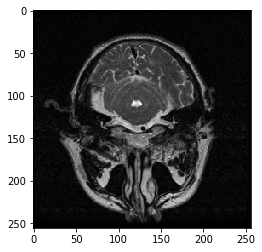

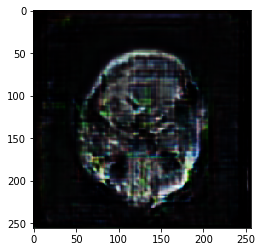

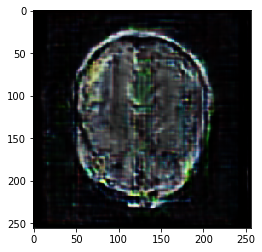

D Real: 0.094175026, D Fake: 0.24331227, G All: 2.826581
D Real: 0.21874556, D Fake: 0.20071417, G All: 2.8281155
D Real: 0.39870378, D Fake: 0.3639827, G All: 3.8045578
D Real: 0.10794609, D Fake: 0.27005118, G All: 3.2728148
D Real: 0.25396293, D Fake: 0.07637243, G All: 4.3527126
D Real: 0.15124516, D Fake: 0.16863278, G All: 3.9393
D Real: 0.62456304, D Fake: 0.12485284, G All: 3.1504428
D Real: 0.102678165, D Fake: 0.16195796, G All: 2.48882
D Real: 0.04459001, D Fake: 0.13909236, G All: 3.0783508
D Real: 0.085475475, D Fake: 0.25231224, G All: 2.1210093
D Real: 0.04749839, D Fake: 0.32259417, G All: 3.8732386
D Real: 0.2813623, D Fake: 0.088846765, G All: 3.7144454
D Real: 0.7554872, D Fake: 0.047982156, G All: 3.3822284
D Real: 0.07203321, D Fake: 0.26914182, G All: 3.2828393
D Real: 0.13865247, D Fake: 0.112642184, G All: 1.9877863
D Real: 0.060432892, D Fake: 0.41317624, G All: 3.21659
D Real: 0.05327188, D Fake: 0.060961775, G All: 4.0348525
D Real: 0.22842498, D Fake: 0.2668

D Real: 0.2573865, D Fake: 0.044013713, G All: 4.039242
D Real: 0.06803997, D Fake: 0.4148041, G All: 1.6022135
D Real: 0.06489916, D Fake: 0.8257927, G All: 1.5244102
D Real: 0.3099877, D Fake: 0.1425389, G All: 2.1583838
D Real: 0.077465326, D Fake: 0.17114311, G All: 2.9850092
D Real: 0.061991587, D Fake: 0.07994948, G All: 3.5337453
D Real: 0.25338897, D Fake: 0.043132775, G All: 3.3550816
D Real: 0.99666965, D Fake: 0.06829886, G All: 2.3389277
D Real: 0.14692497, D Fake: 0.13416179, G All: 1.0357461
D Real: 0.079948425, D Fake: 0.2477822, G All: 3.164753
D Real: 0.16218673, D Fake: 0.43513757, G All: 2.087465
D Real: 0.08609911, D Fake: 0.077940255, G All: 3.653448
D Real: 0.30079627, D Fake: 0.20176268, G All: 4.8542027
D Real: 0.75784326, D Fake: 0.12175592, G All: 3.950912
D Real: 0.15899777, D Fake: 0.07558659, G All: 4.196785
D Real: 0.09307708, D Fake: 0.49549225, G All: 3.2672982
D Real: 0.5103421, D Fake: 0.18393615, G All: 3.1121163
D Real: 0.03841237, D Fake: 0.12506314

D Real: 0.118709765, D Fake: 0.067363955, G All: 3.6020317
D Real: 0.096381545, D Fake: 0.092768945, G All: 3.4300392
D Real: 0.057370793, D Fake: 0.16437244, G All: 2.3843298
D Real: 0.058943175, D Fake: 0.18280351, G All: 2.913477
D Real: 0.11317031, D Fake: 0.13899751, G All: 2.257788
D Real: 0.049047913, D Fake: 0.22943339, G All: 2.6819396
D Real: 0.20001334, D Fake: 0.42739886, G All: 2.32523
D Real: 0.20630135, D Fake: 0.096134454, G All: 3.380427
D Real: 0.029574977, D Fake: 0.04317963, G All: 3.4464629
D Real: 0.12677512, D Fake: 0.31491375, G All: 4.148102
D Real: 0.14782792, D Fake: 0.041955665, G All: 3.5701804
D Real: 1.3885043, D Fake: 0.1252567, G All: 2.6686857
D Real: 0.1830572, D Fake: 0.1814563, G All: 0.8874259
D Real: 0.21379635, D Fake: 0.36129776, G All: 0.97728217
D Real: 0.040215656, D Fake: 1.3914168, G All: 1.4697454
D Real: 0.20146143, D Fake: 0.31889844, G All: 2.7855449
D Real: 0.049876772, D Fake: 0.04833195, G All: 4.859996
D Real: 1.0380123, D Fake: 0.0

D Real: 0.28281128, D Fake: 0.04270988, G All: 5.3108845
D Real: 0.40482813, D Fake: 0.032037254, G All: 3.2270598
D Real: 0.08491202, D Fake: 0.27904847, G All: 2.6813524
D Real: 0.2122496, D Fake: 0.41205692, G All: 3.340054
D Real: 0.34682888, D Fake: 0.106871925, G All: 3.577577
D Real: 0.31060416, D Fake: 0.14157961, G All: 3.7979505
D Real: 0.03595058, D Fake: 0.036909267, G All: 3.3633773
D Real: 0.13656507, D Fake: 0.06215644, G All: 3.506612
D Real: 0.12325435, D Fake: 0.10567024, G All: 3.2745602
D Real: 0.041146472, D Fake: 0.5527046, G All: 2.913293
D Real: 0.1495253, D Fake: 0.2565262, G All: 2.9414468
D Real: 2.0484986, D Fake: 0.40305, G All: 2.3054976
D Real: 0.2641641, D Fake: 0.116672195, G All: 1.2503251
D Real: 0.051783003, D Fake: 0.9667989, G All: 2.2840366
D Real: 0.04928761, D Fake: 0.26715457, G All: 2.5460818
D Real: 0.09408672, D Fake: 0.15428704, G All: 4.8619
D Real: 0.58573407, D Fake: 0.03805671, G All: 4.5426254
D Real: 0.7921869, D Fake: 0.07831788, G A

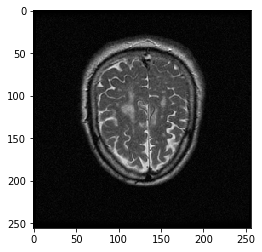

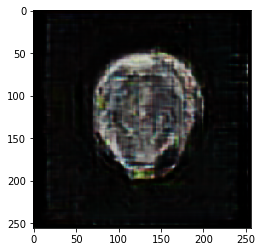

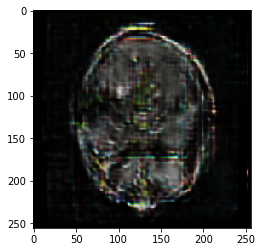

D Real: 0.08878771, D Fake: 0.05223879, G All: 3.753522
D Real: 0.27866414, D Fake: 0.082184166, G All: 3.661597
D Real: 0.7796469, D Fake: 0.06574752, G All: 2.9799044
D Real: 0.054169618, D Fake: 0.24519244, G All: 1.8376948
D Real: 0.0436932, D Fake: 0.7276938, G All: 2.2442553
D Real: 0.16836686, D Fake: 0.11764139, G All: 2.6057053
D Real: 0.062212884, D Fake: 0.0730007, G All: 3.6810088
D Real: 0.057415463, D Fake: 0.050902683, G All: 3.8247414
D Real: 0.31288671, D Fake: 0.15353806, G All: 3.6825304
D Real: 0.42301187, D Fake: 0.127267, G All: 3.2256832
D Real: 0.29360166, D Fake: 0.55549264, G All: 2.2553864
D Real: 0.0881747, D Fake: 0.101463325, G All: 2.8159754
D Real: 0.024216909, D Fake: 0.16884658, G All: 1.8790576
D Real: 0.04970529, D Fake: 1.0572916, G All: 2.717465
D Real: 0.07852147, D Fake: 0.07692635, G All: 3.5265028
D Real: 0.19088529, D Fake: 0.030139457, G All: 4.162068
D Real: 0.34085315, D Fake: 0.055637732, G All: 3.7566485
D Real: 0.09964915, D Fake: 0.1112

D Real: 0.6915703, D Fake: 0.067017645, G All: 3.6995478
D Real: 0.39043266, D Fake: 0.1005445, G All: 2.696054
D Real: 0.35943076, D Fake: 0.14981428, G All: 2.314252
D Real: 0.08018793, D Fake: 0.9705399, G All: 2.0157871
D Real: 0.03836143, D Fake: 0.16470161, G All: 2.167989
D Real: 0.05206248, D Fake: 0.12412319, G All: 3.121515
D Real: 0.48248726, D Fake: 0.09802592, G All: 3.9147344
D Real: 0.57769084, D Fake: 0.06542951, G All: 3.3717551
D Real: 0.14294435, D Fake: 0.1313605, G All: 2.8353662
D Real: 0.057137646, D Fake: 0.17896928, G All: 2.8833075
D Real: 0.04606308, D Fake: 0.21316198, G All: 3.183638
D Real: 0.30208945, D Fake: 0.3275875, G All: 3.1222303
D Real: 0.08188024, D Fake: 0.07177379, G All: 3.4720197
D Real: 0.31873918, D Fake: 0.106082514, G All: 3.6181488
D Real: 0.06388877, D Fake: 0.13650046, G All: 3.6244493
D Real: 0.04106933, D Fake: 0.097759984, G All: 3.5786023
D Real: 0.05825073, D Fake: 0.10838951, G All: 3.5070686
D Real: 0.29629356, D Fake: 0.0348150

D Real: 0.62504894, D Fake: 0.080236375, G All: 3.131885
D Real: 0.07857079, D Fake: 0.3087639, G All: 2.1868997
D Real: 0.06832829, D Fake: 0.23481125, G All: 1.8363538
D Real: 0.043873016, D Fake: 0.10698352, G All: 2.8020394
D Real: 0.12473714, D Fake: 0.15336385, G All: 3.2936118
D Real: 0.048558038, D Fake: 0.10580603, G All: 2.7666254
D Real: 0.036374602, D Fake: 0.06199763, G All: 3.6897056
D Real: 0.034695186, D Fake: 0.046959355, G All: 4.1166215
D Real: 0.11348402, D Fake: 0.04303003, G All: 3.9777913
D Real: 0.24773577, D Fake: 0.069978826, G All: 4.2930923
D Real: 0.08129948, D Fake: 0.062060192, G All: 3.2949457
D Real: 0.0939222, D Fake: 0.27373886, G All: 3.6904647
D Real: 0.2391021, D Fake: 0.0785119, G All: 3.9223104
D Real: 0.052882873, D Fake: 0.05380584, G All: 3.7567878
D Real: 0.63398683, D Fake: 0.155559, G All: 2.959865
D Real: 0.2316329, D Fake: 0.19765499, G All: 1.9971817
D Real: 0.06475595, D Fake: 0.12857279, G All: 2.31888
D Real: 0.05518321, D Fake: 0.328

D Real: 0.06828697, D Fake: 0.15503876, G All: 2.9367394
D Real: 0.054337088, D Fake: 0.047429703, G All: 3.9690104
D Real: 0.052456625, D Fake: 0.36338162, G All: 5.13229
D Real: 1.7309843, D Fake: 0.06971726, G All: 2.9345179
D Real: 0.031949885, D Fake: 0.11179064, G All: 2.4382205
D Real: 0.07683986, D Fake: 0.27032167, G All: 1.036313
D Real: 0.11247344, D Fake: 0.5971222, G All: 2.4135396
D Real: 0.07557259, D Fake: 0.4297704, G All: 3.9523773
D Real: 0.6233107, D Fake: 0.03256621, G All: 3.5944433
D Real: 0.6436195, D Fake: 0.07856046, G All: 3.2418766
D Real: 0.054319806, D Fake: 0.110795416, G All: 1.8436686
D Real: 0.040073648, D Fake: 0.55397004, G All: 2.7473042
D Real: 0.8104364, D Fake: 1.5362241, G All: 2.4893687
D Real: 1.34706, D Fake: 0.46021193, G All: 2.7418165
D Real: 0.20339416, D Fake: 0.26849425, G All: 3.937019
D Real: 0.12893665, D Fake: 0.04887853, G All: 3.5154543
D Real: 0.15428393, D Fake: 0.074856505, G All: 4.6319036
D Real: 0.16514328, D Fake: 0.0523141

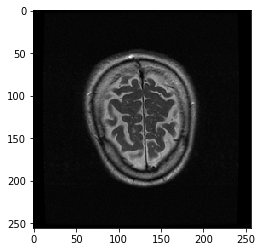

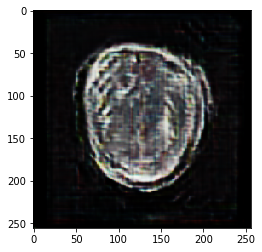

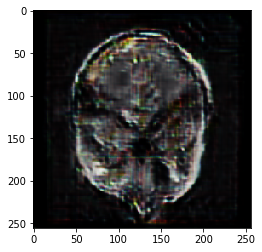

D Real: 0.8684112, D Fake: 0.040936105, G All: 4.9195366
D Real: 0.91358846, D Fake: 0.054106742, G All: 3.1476033
D Real: 0.18054248, D Fake: 0.08174971, G All: 1.8935711
D Real: 0.10153936, D Fake: 0.40529734, G All: 1.6839856
D Real: 0.048538357, D Fake: 0.55502135, G All: 1.4881136
D Real: 0.115159005, D Fake: 0.2559309, G All: 2.1600842
D Real: 0.19187269, D Fake: 0.21295518, G All: 3.5376363
D Real: 0.6453614, D Fake: 0.17691764, G All: 3.5399106
D Real: 0.15491101, D Fake: 0.02941473, G All: 2.8434286
D Real: 0.39416796, D Fake: 0.27960896, G All: 3.7376773
D Real: 0.0604617, D Fake: 0.12931447, G All: 2.7231417
D Real: 0.113522306, D Fake: 0.06552364, G All: 2.67358
D Real: 0.522608, D Fake: 0.39822567, G All: 3.0055475
D Real: 0.14421695, D Fake: 0.075931616, G All: 2.3387465
D Real: 0.053249538, D Fake: 0.35901767, G All: 2.9422197
D Real: 0.041832235, D Fake: 0.10368061, G All: 2.859322
D Real: 0.13053003, D Fake: 0.09000279, G All: 4.7477927
D Real: 0.6868453, D Fake: 0.041

D Real: 0.25392923, D Fake: 0.19566473, G All: 2.794611
D Real: 0.052783653, D Fake: 0.3018496, G All: 1.4478488
D Real: 0.12968946, D Fake: 0.37396103, G All: 1.9774268
D Real: 0.2112311, D Fake: 0.13241589, G All: 2.7685452
D Real: 0.03764607, D Fake: 0.14440833, G All: 3.0404232
D Real: 0.19054654, D Fake: 0.17272472, G All: 3.4173374
D Real: 0.88134205, D Fake: 0.24065381, G All: 3.0384922
D Real: 0.16634622, D Fake: 0.28144202, G All: 2.601088
D Real: 0.38057134, D Fake: 0.19530618, G All: 2.3960857
D Real: 0.032869887, D Fake: 0.3319526, G All: 2.646315
D Real: 0.09490749, D Fake: 0.20840959, G All: 3.3048782
D Real: 0.14657296, D Fake: 0.15893467, G All: 3.5801313
D Real: 0.051880274, D Fake: 0.06324607, G All: 4.5977707
D Real: 0.15869555, D Fake: 0.06504074, G All: 5.139989
D Real: 0.08725231, D Fake: 0.029905714, G All: 4.8113375
D Real: 0.19493942, D Fake: 0.042824224, G All: 4.0112767
D Real: 0.2586547, D Fake: 0.18660915, G All: 2.4735608
D Real: 0.39567724, D Fake: 0.2829

D Real: 1.8147966, D Fake: 0.06353447, G All: 2.0431726
D Real: 0.050030604, D Fake: 1.4391768, G All: 1.1591587
D Real: 0.059430476, D Fake: 0.76950246, G All: 0.9365337
D Real: 0.0541735, D Fake: 1.0817078, G All: 1.5603124
D Real: 0.08397278, D Fake: 0.116391994, G All: 3.8338528
D Real: 0.055712834, D Fake: 0.032013208, G All: 5.384446
D Real: 0.4657718, D Fake: 0.038866136, G All: 6.2065444
D Real: 1.0324004, D Fake: 0.17247835, G All: 5.6319866
D Real: 0.7838633, D Fake: 0.06824162, G All: 4.266569
D Real: 0.43109483, D Fake: 0.34008607, G All: 2.2424345
D Real: 0.10267498, D Fake: 0.13199377, G All: 2.2787814
D Real: 0.12192137, D Fake: 1.2676666, G All: 2.082178
D Real: 0.23611455, D Fake: 0.31742054, G All: 2.9465685
D Real: 0.1061841, D Fake: 0.13796896, G All: 3.4756563
D Real: 0.07302361, D Fake: 0.067351356, G All: 3.841784
D Real: 0.093181685, D Fake: 0.045523584, G All: 5.5736837
D Real: 0.07862, D Fake: 0.03557221, G All: 4.480763
D Real: 0.38420004, D Fake: 0.0492574, 

D Real: 0.07634946, D Fake: 0.09785569, G All: 4.8480864
D Real: 0.0509578, D Fake: 0.067951664, G All: 4.4118967
D Real: 0.25218666, D Fake: 0.082778305, G All: 4.1361427
D Real: 0.08525313, D Fake: 0.04967004, G All: 4.0723467
D Real: 0.07848211, D Fake: 0.049805373, G All: 2.6427817
D Real: 0.18080723, D Fake: 0.45065302, G All: 3.1737006
D Real: 0.35624993, D Fake: 0.15126698, G All: 2.6547074
D Real: 0.88540053, D Fake: 0.184674, G All: 1.6684005
D Real: 0.25827438, D Fake: 0.8069197, G All: 1.1359861
D Real: 0.11167802, D Fake: 0.2252676, G All: 1.7981235
D Real: 0.051725104, D Fake: 0.38178027, G All: 2.5682154
D Real: 0.022422763, D Fake: 0.08990807, G All: 3.7328193
D Real: 0.3391197, D Fake: 0.10243654, G All: 4.101474
D Real: 1.1143847, D Fake: 0.044760726, G All: 3.6048117
D Real: 0.12254581, D Fake: 0.23975718, G All: 3.1988416
D Real: 0.25304785, D Fake: 0.11846984, G All: 3.2070928
D Real: 0.05042231, D Fake: 0.41287616, G All: 2.6406655
D Real: 0.05256769, D Fake: 1.020

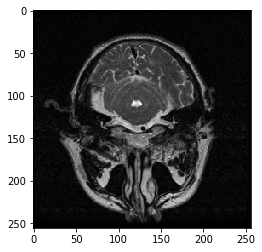

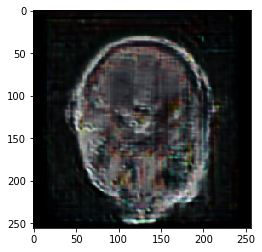

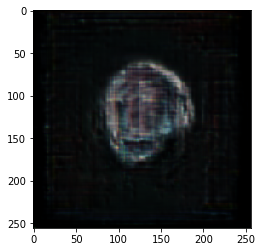

D Real: 0.3129615, D Fake: 0.06268464, G All: 5.5673304
D Real: 0.7329697, D Fake: 0.034232713, G All: 5.6693344
D Real: 0.6069723, D Fake: 0.121940136, G All: 2.3415313
D Real: 0.3736083, D Fake: 0.59583855, G All: 2.058958
D Real: 0.043941423, D Fake: 0.7309714, G All: 2.4709275
D Real: 0.040825374, D Fake: 0.0879592, G All: 3.8960173
D Real: 0.19893914, D Fake: 0.12101734, G All: 4.106228
D Real: 0.03570197, D Fake: 0.0699402, G All: 5.0775285
D Real: 0.11267274, D Fake: 0.031022128, G All: 5.332714
D Real: 0.56868714, D Fake: 0.051542737, G All: 3.7475576
D Real: 0.61354315, D Fake: 0.066102445, G All: 3.6865277
D Real: 0.064547345, D Fake: 0.54844576, G All: 2.2880583
D Real: 0.038470067, D Fake: 0.4428848, G All: 2.3007948
D Real: 0.03442071, D Fake: 0.14577866, G All: 3.5189028
D Real: 0.09733944, D Fake: 0.054345522, G All: 4.132657
D Real: 0.037653744, D Fake: 0.14463753, G All: 4.364484
D Real: 0.25448546, D Fake: 0.0718198, G All: 5.0502605
D Real: 0.42583403, D Fake: 0.1022

D Real: 0.24695712, D Fake: 0.22125313, G All: 4.2396145
D Real: 0.030119646, D Fake: 0.43709564, G All: 4.3438582
D Real: 0.059512656, D Fake: 0.06908926, G All: 4.5320587
D Real: 0.55162644, D Fake: 0.043563083, G All: 5.021988
D Real: 0.3622654, D Fake: 0.054802403, G All: 3.8715277
D Real: 0.64003056, D Fake: 0.47848874, G All: 3.8964927
D Real: 0.1449319, D Fake: 0.36638916, G All: 2.6966236
D Real: 0.32681918, D Fake: 0.1350216, G All: 2.9459524
D Real: 0.10744732, D Fake: 0.058087185, G All: 3.3848252
D Real: 0.8654491, D Fake: 0.21255174, G All: 2.604561
D Real: 0.050539803, D Fake: 0.20158255, G All: 2.2750833
D Real: 0.05158902, D Fake: 0.3363968, G All: 2.9865024
D Real: 0.10571298, D Fake: 0.5842178, G All: 3.1766615
D Real: 0.2889668, D Fake: 0.082587644, G All: 3.1299734
D Real: 0.04065682, D Fake: 0.054434426, G All: 4.053321
D Real: 0.047889493, D Fake: 0.094322324, G All: 3.3416128
D Real: 0.41257322, D Fake: 0.07433075, G All: 3.09824
D Real: 0.113027066, D Fake: 0.10

D Real: 0.19635215, D Fake: 0.3149184, G All: 3.7183545
D Real: 0.054612048, D Fake: 0.16542959, G All: 4.2864985
D Real: 0.12210892, D Fake: 0.066719174, G All: 4.3462777
D Real: 0.09961456, D Fake: 0.05411287, G All: 3.9887245
D Real: 0.0604481, D Fake: 0.063642, G All: 4.249447
D Real: 0.19067301, D Fake: 0.04369431, G All: 4.4452677
D Real: 0.220826, D Fake: 0.06617451, G All: 3.6584125
D Real: 0.9399105, D Fake: 0.52620083, G All: 2.7245564
D Real: 0.15277228, D Fake: 0.64075994, G All: 3.0820875
D Real: 0.048821233, D Fake: 0.16149397, G All: 3.196404
D Real: 0.088606544, D Fake: 0.07695373, G All: 3.65862
D Real: 0.2929428, D Fake: 0.27569184, G All: 3.4583778
D Real: 0.15325136, D Fake: 0.58005977, G All: 4.2186046
D Real: 0.538936, D Fake: 0.13547646, G All: 4.1261263
D Real: 0.14803237, D Fake: 0.039673377, G All: 3.5984573
D Real: 0.07031912, D Fake: 0.16121125, G All: 4.2629633
D Real: 0.79882646, D Fake: 0.2706244, G All: 3.0194483
D Real: 0.08602476, D Fake: 0.57070744, G

D Real: 0.13839035, D Fake: 0.07200101, G All: 3.7152696
D Real: 0.1047816, D Fake: 0.2683922, G All: 3.4095757
D Real: 0.4567741, D Fake: 0.14106262, G All: 3.718875
D Real: 0.055665996, D Fake: 0.14377469, G All: 3.9133654
D Real: 0.115180135, D Fake: 0.0723902, G All: 3.1937428
D Real: 0.119258255, D Fake: 0.053784788, G All: 3.506896
D Real: 0.091463014, D Fake: 0.28406572, G All: 2.3892748
D Real: 0.0663884, D Fake: 0.06623803, G All: 3.2974648
D Real: 0.45550704, D Fake: 0.21686184, G All: 4.7161684
D Real: 0.2889507, D Fake: 0.31860495, G All: 3.612152
D Real: 0.05296851, D Fake: 0.10251247, G All: 3.5169835
D Real: 0.098026946, D Fake: 0.054175884, G All: 3.6543036
D Real: 0.5971145, D Fake: 0.15962534, G All: 3.2260692
D Real: 0.08316079, D Fake: 0.30126286, G All: 2.2179208
D Real: 0.3129751, D Fake: 0.13815677, G All: 2.5417304
D Real: 0.174324, D Fake: 0.2671164, G All: 3.550435
D Real: 0.26323938, D Fake: 0.19299549, G All: 2.482139
D Real: 0.41785383, D Fake: 0.22755137, 

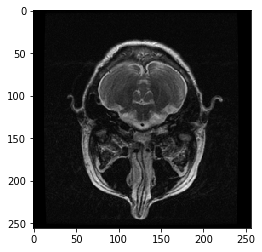

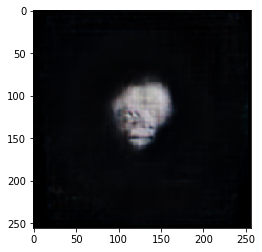

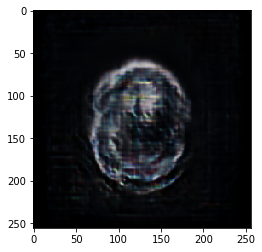

D Real: 0.047076285, D Fake: 0.25935996, G All: 3.8548613
D Real: 0.8541827, D Fake: 0.07611143, G All: 5.4019685
D Real: 0.54223466, D Fake: 0.230837, G All: 4.2144346
D Real: 0.12061542, D Fake: 0.04227364, G All: 3.1824746
D Real: 0.27486864, D Fake: 0.5856099, G All: 3.0026777
D Real: 0.16929284, D Fake: 0.08139019, G All: 2.6451552
D Real: 0.046509042, D Fake: 0.29574174, G All: 2.5503743
D Real: 0.14794494, D Fake: 0.03193753, G All: 3.8344257
D Real: 0.268013, D Fake: 0.14525169, G All: 2.3156838
D Real: 0.08845073, D Fake: 0.1799171, G All: 3.241031
D Real: 0.19600168, D Fake: 0.15591213, G All: 3.1515174
D Real: 0.1208171, D Fake: 0.0353136, G All: 3.592681
D Real: 0.2664957, D Fake: 0.21597485, G All: 4.092493
D Real: 0.052838586, D Fake: 0.1624863, G All: 2.821029
D Real: 1.5455742, D Fake: 0.118488014, G All: 1.5706292
D Real: 0.03086308, D Fake: 0.51461494, G All: 2.6119525
D Real: 0.0800543, D Fake: 0.355515, G All: 2.6260557
D Real: 0.041290313, D Fake: 0.31373256, G All

D Real: 0.09765794, D Fake: 0.31878823, G All: 2.3655264
D Real: 0.08028248, D Fake: 0.1279117, G All: 2.2510324
D Real: 0.04691843, D Fake: 0.5368992, G All: 5.4859505
D Real: 1.1669014, D Fake: 0.12012997, G All: 4.4543643
D Real: 1.0230916, D Fake: 0.06811718, G All: 3.3936634
D Real: 1.1363666, D Fake: 0.44544876, G All: 2.183834
D Real: 0.060001776, D Fake: 0.56927896, G All: 1.6552936
D Real: 0.034496617, D Fake: 0.15332311, G All: 3.5108924
D Real: 0.034509376, D Fake: 0.18599927, G All: 4.840773
D Real: 0.046557315, D Fake: 0.053824566, G All: 4.20094
D Real: 0.06607059, D Fake: 0.084819674, G All: 6.2495604
D Real: 0.28854978, D Fake: 0.08379173, G All: 6.4509845
D Real: 0.10149056, D Fake: 0.14136669, G All: 6.533398
D Real: 0.21175769, D Fake: 0.057149533, G All: 4.898773
D Real: 0.052730918, D Fake: 0.048255324, G All: 4.854389
D Real: 0.7760467, D Fake: 0.102124885, G All: 3.5717669
D Real: 0.20291793, D Fake: 0.17148834, G All: 2.6556563
D Real: 0.14047739, D Fake: 0.3840

D Real: 0.10256701, D Fake: 0.84492934, G All: 2.6388426
D Real: 0.18567659, D Fake: 0.1472924, G All: 4.6377573
D Real: 0.6014182, D Fake: 0.03269585, G All: 4.2189984
D Real: 0.28166455, D Fake: 0.06322833, G All: 4.963933
D Real: 1.0982933, D Fake: 0.12129024, G All: 4.159287
D Real: 0.06292755, D Fake: 0.2741384, G All: 2.6479232
D Real: 0.029020932, D Fake: 0.18154588, G All: 2.04592
D Real: 0.16994599, D Fake: 0.8430359, G All: 2.9925065
D Real: 0.08334133, D Fake: 0.20766467, G All: 3.9873238
D Real: 0.56723225, D Fake: 0.0557138, G All: 4.184124
D Real: 0.1695675, D Fake: 0.04774668, G All: 3.8611538
D Real: 0.1090691, D Fake: 0.06171561, G All: 3.866661
D Real: 0.1916253, D Fake: 0.0403464, G All: 3.0561342
D Real: 0.24671648, D Fake: 0.24431461, G All: 4.1485543
D Real: 0.16199577, D Fake: 0.14956677, G All: 2.9994292
D Real: 0.05985736, D Fake: 0.4181802, G All: 2.8239288
D Real: 0.28705797, D Fake: 0.39202738, G All: 3.409082
D Real: 0.16243948, D Fake: 0.057481483, G All: 

D Real: 0.20283467, D Fake: 0.35402134, G All: 2.674115
D Real: 0.09184292, D Fake: 0.592982, G All: 1.9983256
D Real: 0.16955249, D Fake: 0.3652557, G All: 2.9203436
D Real: 0.057453893, D Fake: 0.4384228, G All: 3.897745
D Real: 0.039594106, D Fake: 0.085914955, G All: 4.384075
D Real: 0.22053505, D Fake: 0.05056981, G All: 5.763301
D Real: 0.7091506, D Fake: 0.15043814, G All: 5.2950172
D Real: 0.9826194, D Fake: 0.056421958, G All: 4.7034926
D Real: 0.40564516, D Fake: 1.0794218, G All: 2.7704277
D Real: 0.07725787, D Fake: 0.27704594, G All: 2.823025
D Real: 0.29431415, D Fake: 0.1046265, G All: 2.1150684
D Real: 0.077057794, D Fake: 0.34184793, G All: 2.2608647
D Real: 0.14308536, D Fake: 0.19832714, G All: 3.0416303
D Real: 0.05325645, D Fake: 0.082801655, G All: 4.2989492
D Real: 1.3580053, D Fake: 0.3973999, G All: 2.864325
D Real: 0.082058966, D Fake: 0.14774662, G All: 2.068455
D Real: 0.0539653, D Fake: 0.17063275, G All: 4.1342382
D Real: 0.033215605, D Fake: 0.042477876, 

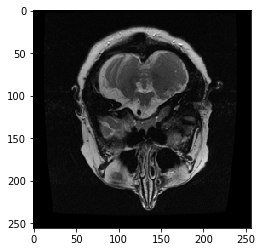

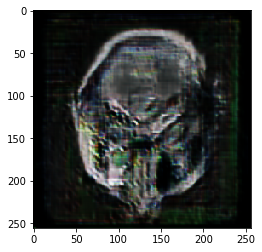

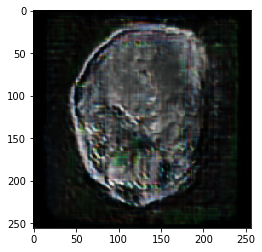

D Real: 0.030614028, D Fake: 0.04046761, G All: 3.870784
D Real: 0.076508544, D Fake: 0.034487233, G All: 3.4558449
D Real: 0.26095098, D Fake: 0.051747486, G All: 4.7956653
D Real: 0.07143067, D Fake: 0.10374452, G All: 3.567919
D Real: 0.18263632, D Fake: 0.0951726, G All: 2.9369998
D Real: 0.21203974, D Fake: 0.24791309, G All: 3.240793
D Real: 0.068670005, D Fake: 0.5594412, G All: 4.1154714
D Real: 0.19429626, D Fake: 0.074088685, G All: 3.4990115
D Real: 0.14669603, D Fake: 0.09995552, G All: 4.0684085
D Real: 0.092695884, D Fake: 0.052500427, G All: 4.1552734
D Real: 0.7655436, D Fake: 0.05077269, G All: 3.4400265
D Real: 0.6366022, D Fake: 0.10318426, G All: 2.9617715
D Real: 0.07854873, D Fake: 0.91628647, G All: 1.6046679
D Real: 0.056403644, D Fake: 0.15095185, G All: 2.0381937
D Real: 0.05769693, D Fake: 0.5894218, G All: 2.8443277
D Real: 0.058669396, D Fake: 0.046548016, G All: 4.0375457
D Real: 0.05285126, D Fake: 0.11861481, G All: 3.0687525
D Real: 0.5458995, D Fake: 0

D Real: 0.40919113, D Fake: 0.03927548, G All: 3.0447674
D Real: 0.40676686, D Fake: 0.40111578, G All: 1.617355
D Real: 0.2898698, D Fake: 0.3989427, G All: 1.9335566
D Real: 0.32374328, D Fake: 0.17961988, G All: 1.3747063
D Real: 0.034688264, D Fake: 0.42631668, G All: 2.2927468
D Real: 0.05156447, D Fake: 0.30565527, G All: 3.3795948
D Real: 0.68689245, D Fake: 0.040747415, G All: 3.992828
D Real: 0.17277189, D Fake: 0.34877765, G All: 3.9426346
D Real: 0.11604665, D Fake: 0.035144895, G All: 3.5561225
D Real: 0.037394844, D Fake: 0.04255747, G All: 4.7123947
D Real: 0.23171508, D Fake: 0.0827758, G All: 4.3855515
D Real: 0.13788557, D Fake: 0.053903382, G All: 3.7129617
D Real: 0.17854649, D Fake: 0.13816135, G All: 3.40467
D Real: 0.05589227, D Fake: 0.105337165, G All: 2.7719154
D Real: 0.0984125, D Fake: 0.20668131, G All: 3.1899757
D Real: 0.069873974, D Fake: 0.2927485, G All: 3.1912663
D Real: 0.09672548, D Fake: 0.22070408, G All: 3.2296553
D Real: 0.050809123, D Fake: 0.04

D Real: 1.8738056, D Fake: 0.09466975, G All: 2.992281
D Real: 0.15179309, D Fake: 0.38986483, G All: 1.4221772
D Real: 0.07939121, D Fake: 1.6494377, G All: 1.1402102
D Real: 0.12806568, D Fake: 0.26575628, G All: 2.358453
D Real: 0.23561019, D Fake: 0.24851274, G All: 3.7585917
D Real: 1.1212585, D Fake: 0.059642434, G All: 5.021078
D Real: 0.6805341, D Fake: 0.06836919, G All: 3.2973106
D Real: 1.5610411, D Fake: 0.32143468, G All: 1.8337628
D Real: 0.08367158, D Fake: 0.71903324, G All: 1.1981136
D Real: 0.039693557, D Fake: 0.3850617, G All: 1.3093426
D Real: 0.068880156, D Fake: 0.70497775, G All: 2.1196418
D Real: 0.04670062, D Fake: 0.115066394, G All: 3.1499195
D Real: 0.11345197, D Fake: 0.13334453, G All: 4.730773
D Real: 0.06991974, D Fake: 0.03135687, G All: 5.795655
D Real: 1.4281435, D Fake: 0.06044809, G All: 4.422737
D Real: 0.6496223, D Fake: 0.106821045, G All: 3.9105008
D Real: 0.4174139, D Fake: 0.06834191, G All: 2.677329
D Real: 0.11136685, D Fake: 0.41418785, G 

D Real: 0.03867841, D Fake: 0.32723528, G All: 1.7597264
D Real: 0.1343088, D Fake: 0.3963381, G All: 3.5102236
D Real: 0.4586248, D Fake: 0.163668, G All: 3.9517472
D Real: 0.38658, D Fake: 0.09118746, G All: 4.102182
D Real: 0.12879351, D Fake: 0.20712975, G All: 3.431109
D Real: 0.14157017, D Fake: 0.28836602, G All: 2.9525795
D Real: 0.68414223, D Fake: 0.77003086, G All: 3.285905
D Real: 0.4482913, D Fake: 0.32544857, G All: 1.6513348
D Real: 0.108745284, D Fake: 0.5707295, G All: 3.3714223
D Real: 0.043174565, D Fake: 0.17129643, G All: 2.7569818
D Real: 0.63139546, D Fake: 0.06452873, G All: 3.4506068
D Real: 0.09004636, D Fake: 0.44855028, G All: 3.7170208
D Real: 0.092994764, D Fake: 0.074352354, G All: 4.4745035
D Real: 0.51109505, D Fake: 0.063751034, G All: 4.044785
D Real: 0.37696922, D Fake: 0.09176682, G All: 3.805781
D Real: 0.5083174, D Fake: 0.06243431, G All: 2.9672596
D Real: 0.19124103, D Fake: 0.067001134, G All: 1.2356783
D Real: 0.043172143, D Fake: 0.62289315, 

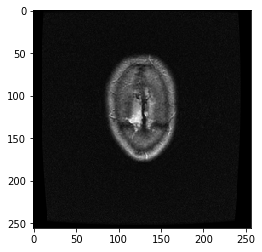

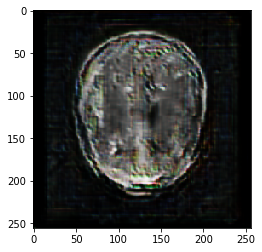

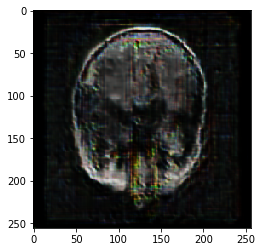

D Real: 0.22153807, D Fake: 0.34444714, G All: 3.1159668
D Real: 0.098545626, D Fake: 0.062216762, G All: 2.519402
D Real: 0.09758002, D Fake: 0.17331852, G All: 2.9420512
D Real: 0.07690729, D Fake: 0.24141803, G All: 2.295538
D Real: 0.04355604, D Fake: 0.12550414, G All: 2.9849741
D Real: 0.29032978, D Fake: 0.12737645, G All: 2.6983507
D Real: 0.7782861, D Fake: 0.030283066, G All: 2.4234252
D Real: 0.05492773, D Fake: 0.5414299, G All: 2.178637
D Real: 0.11890097, D Fake: 0.22098978, G All: 2.8117445
D Real: 0.03776462, D Fake: 0.48540527, G All: 2.628326
D Real: 0.11360398, D Fake: 0.18980356, G All: 3.354616
D Real: 0.08642343, D Fake: 0.042928077, G All: 3.8468637
D Real: 2.4875906, D Fake: 0.05564622, G All: 3.7239974
D Real: 0.65780073, D Fake: 0.29673833, G All: 2.2142847
D Real: 0.12637958, D Fake: 0.56786764, G All: 1.6966639
D Real: 0.07922973, D Fake: 0.49199688, G All: 2.4129047
D Real: 0.06622006, D Fake: 0.39014593, G All: 2.9461648
D Real: 0.15580572, D Fake: 0.38444

D Real: 0.09607776, D Fake: 1.0494387, G All: 1.7373886
D Real: 0.04408278, D Fake: 0.5245071, G All: 2.921749
D Real: 0.3759634, D Fake: 0.076784395, G All: 2.7804546
D Real: 0.6356194, D Fake: 0.16992238, G All: 2.8720064
D Real: 0.36359698, D Fake: 0.48792225, G All: 3.084555
D Real: 0.06709929, D Fake: 0.17260446, G All: 3.0988517
D Real: 0.20590961, D Fake: 0.15449259, G All: 3.4127111
D Real: 0.18119922, D Fake: 0.11651787, G All: 3.7814093
D Real: 0.09317008, D Fake: 0.0685966, G All: 2.9414535
D Real: 0.0728698, D Fake: 0.08396134, G All: 3.7685168
D Real: 0.06879364, D Fake: 0.08064248, G All: 2.3968525
D Real: 0.048625156, D Fake: 0.19444747, G All: 2.7374544
D Real: 0.1238177, D Fake: 0.10722587, G All: 2.5209756
D Real: 0.10317223, D Fake: 0.10144332, G All: 3.2147498
D Real: 0.30144104, D Fake: 0.10220894, G All: 3.582515
D Real: 0.20599177, D Fake: 0.55970615, G All: 2.8250022
D Real: 0.20070362, D Fake: 0.046467733, G All: 3.5563154
D Real: 0.24714118, D Fake: 0.07237774

D Real: 0.4459346, D Fake: 0.3654266, G All: 1.8252984
D Real: 0.26854998, D Fake: 0.50644845, G All: 1.0520096
D Real: 0.04875759, D Fake: 0.31748113, G All: 1.8861762
D Real: 0.038018353, D Fake: 0.21590571, G All: 2.7550588
D Real: 0.19443212, D Fake: 0.232146, G All: 3.5345192
D Real: 0.056571804, D Fake: 0.053850755, G All: 3.869079
D Real: 0.49636355, D Fake: 0.04547795, G All: 4.007909
D Real: 0.07545775, D Fake: 0.06272479, G All: 3.5896988
D Real: 0.254353, D Fake: 0.16578999, G All: 2.8817396
D Real: 0.06855636, D Fake: 0.12079511, G All: 3.3432302
D Real: 0.24652496, D Fake: 0.26315168, G All: 3.0324173
D Real: 0.16771391, D Fake: 0.16753796, G All: 2.6036437
D Real: 0.07245867, D Fake: 0.07607688, G All: 3.3759851
D Real: 0.31230357, D Fake: 0.102998644, G All: 2.732298
D Real: 0.3728193, D Fake: 0.0636614, G All: 2.8931296
D Real: 0.14233123, D Fake: 0.3406796, G All: 2.8300033
D Real: 0.5938839, D Fake: 0.6416151, G All: 1.8248184
D Real: 0.26558113, D Fake: 1.0381441, G 

D Real: 0.55417746, D Fake: 0.041806713, G All: 4.0935163
D Real: 1.0232071, D Fake: 0.05000536, G All: 4.408767
D Real: 0.66330457, D Fake: 0.068862125, G All: 2.9091873
D Real: 0.106224366, D Fake: 0.109664276, G All: 2.3650749
D Real: 0.062275864, D Fake: 0.2943204, G All: 2.5192053
D Real: 0.13608462, D Fake: 0.36456656, G All: 2.0802093
D Real: 0.041832246, D Fake: 0.24848567, G All: 2.2160504
D Real: 0.122515365, D Fake: 0.5015563, G All: 2.5506196
D Real: 0.26693696, D Fake: 0.24090797, G All: 3.7809744
D Real: 0.78176904, D Fake: 0.03418864, G All: 4.247526
D Real: 0.18191081, D Fake: 0.04982909, G All: 2.8443081
D Real: 0.19538853, D Fake: 0.080234684, G All: 3.4414454
D Real: 0.047974255, D Fake: 0.19743133, G All: 2.2256927
D Real: 0.20408083, D Fake: 0.17444733, G All: 2.535121
D Real: 0.22287786, D Fake: 0.68651897, G All: 2.309825
D Real: 0.041422762, D Fake: 0.24418052, G All: 3.2397056
D Real: 0.31053773, D Fake: 0.056342736, G All: 3.1484156
D Real: 0.12879416, D Fake:

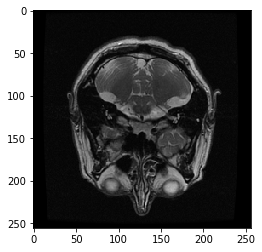

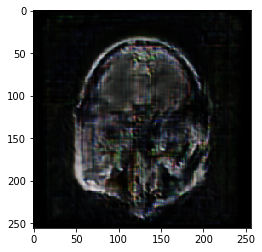

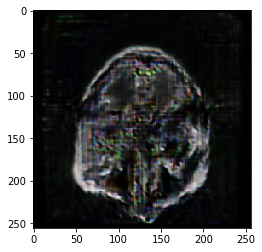

D Real: 0.06324668, D Fake: 0.67100346, G All: 3.051
D Real: 0.25511715, D Fake: 0.46599755, G All: 4.8196077
D Real: 0.13570882, D Fake: 0.12221021, G All: 4.4824133
D Real: 0.7443829, D Fake: 0.05660247, G All: 4.3221045
D Real: 0.1873239, D Fake: 0.079553746, G All: 3.9742663
D Real: 0.6554452, D Fake: 0.07786736, G All: 2.3123026
D Real: 0.15784316, D Fake: 0.5304851, G All: 1.9845031
D Real: 0.11475423, D Fake: 0.65236354, G All: 2.174613
D Real: 0.06096143, D Fake: 0.3072632, G All: 1.6811131
D Real: 0.08909039, D Fake: 0.059539534, G All: 3.0013003
D Real: 0.6953737, D Fake: 0.3230382, G All: 2.713583
D Real: 0.05345826, D Fake: 0.12590946, G All: 2.4642894
D Real: 1.3927824, D Fake: 0.3372958, G All: 2.8785267
D Real: 0.41780174, D Fake: 0.3444841, G All: 1.4646175
D Real: 0.11084339, D Fake: 1.0003383, G All: 1.9071312
D Real: 0.05746611, D Fake: 0.43026066, G All: 3.0886576
D Real: 0.07032375, D Fake: 0.106253855, G All: 3.6989827
D Real: 1.3084836, D Fake: 0.09244141, G All:

D Real: 0.16009454, D Fake: 0.2918371, G All: 2.0618107
D Real: 0.05231295, D Fake: 0.17008622, G All: 2.5423813
D Real: 0.14346677, D Fake: 0.3385254, G All: 1.6645722
D Real: 0.43302345, D Fake: 0.545927, G All: 2.4517272
D Real: 0.050681856, D Fake: 0.14262769, G All: 2.8151255
D Real: 0.34354058, D Fake: 0.123068936, G All: 3.0819082
D Real: 0.1879746, D Fake: 0.14637211, G All: 3.2259333
D Real: 0.089245886, D Fake: 0.16882752, G All: 3.4511774
D Real: 0.5896734, D Fake: 0.14980638, G All: 2.2292223
D Real: 0.07006894, D Fake: 0.0712941, G All: 3.4643216
D Real: 0.05993686, D Fake: 0.2407424, G All: 3.8578968
D Real: 0.31455636, D Fake: 0.2880028, G All: 1.8546115
D Real: 0.19363225, D Fake: 0.11294137, G All: 2.6712697
D Real: 0.48903972, D Fake: 0.2029113, G All: 2.2498372
D Real: 0.59096485, D Fake: 0.55722463, G All: 1.6767027
D Real: 0.031436495, D Fake: 0.32190883, G All: 2.839332
D Real: 0.27584594, D Fake: 0.5079166, G All: 2.4397988
D Real: 0.058802295, D Fake: 0.43383667

D Real: 0.40713125, D Fake: 0.091488816, G All: 4.3490286
D Real: 0.16687909, D Fake: 0.2546859, G All: 3.0339189
D Real: 0.3183795, D Fake: 0.05323432, G All: 3.9229774
D Real: 0.9074008, D Fake: 0.09037669, G All: 2.5330045
D Real: 0.095011584, D Fake: 0.56269956, G All: 1.3178242
D Real: 0.07197155, D Fake: 0.56731665, G All: 2.2536612
D Real: 0.08198246, D Fake: 0.120765984, G All: 2.5282156
D Real: 0.32548094, D Fake: 0.10468957, G All: 3.8261113
D Real: 0.6593443, D Fake: 0.22537851, G All: 3.082881
D Real: 0.67003524, D Fake: 0.06947462, G All: 2.4377313
D Real: 0.04566395, D Fake: 0.30733734, G All: 1.8105085
D Real: 0.25402185, D Fake: 0.4001282, G All: 1.8490788
D Real: 0.17661214, D Fake: 0.28618532, G All: 1.9264786
D Real: 0.06074389, D Fake: 0.26095214, G All: 2.2840366
D Real: 0.27691168, D Fake: 0.41442364, G All: 2.7429175
D Real: 0.049218863, D Fake: 0.14829257, G All: 3.7425308
D Real: 0.17534131, D Fake: 0.040474985, G All: 4.2750654
D Real: 0.29379466, D Fake: 0.11

D Real: 0.16105264, D Fake: 0.9106094, G All: 1.2487241
D Real: 0.15698771, D Fake: 0.32706374, G All: 1.8405898
D Real: 0.28905025, D Fake: 0.5296946, G All: 2.0998042
D Real: 0.03913032, D Fake: 0.21633035, G All: 3.1256843
D Real: 0.337799, D Fake: 0.10786627, G All: 3.2090948
D Real: 0.115446076, D Fake: 0.1080237, G All: 4.1262693
D Real: 0.6951896, D Fake: 0.16850773, G All: 3.5362506
D Real: 1.3579925, D Fake: 0.17922965, G All: 1.6629335
D Real: 0.29706898, D Fake: 0.5465518, G All: 0.61553645
D Real: 0.0864658, D Fake: 0.8227476, G All: 1.0284371
D Real: 0.1433837, D Fake: 0.53798115, G All: 0.7113414
D Real: 0.07806577, D Fake: 0.39152926, G All: 1.9017806
D Real: 0.28189814, D Fake: 0.16551521, G All: 2.7474408
D Real: 0.5965379, D Fake: 0.13336927, G All: 3.3541074
D Real: 0.33454192, D Fake: 0.29249513, G All: 3.483096
D Real: 0.70455664, D Fake: 0.143706, G All: 2.8230305
D Real: 0.6006075, D Fake: 0.20875378, G All: 1.6639416
D Real: 0.060050707, D Fake: 0.46234852, G Al

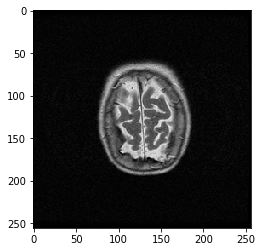

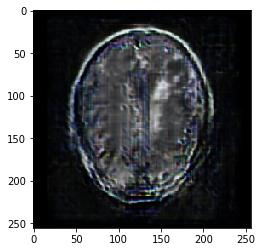

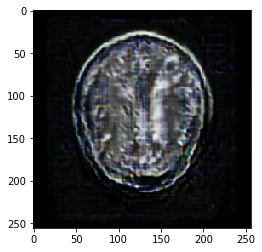

D Real: 0.19415504, D Fake: 0.6963934, G All: 3.145951
D Real: 0.5515952, D Fake: 0.084843434, G All: 3.4471579
D Real: 0.053000607, D Fake: 0.23085237, G All: 3.18854
D Real: 0.7262045, D Fake: 0.86055994, G All: 3.6403677
D Real: 0.22056332, D Fake: 0.127267, G All: 3.180368
D Real: 0.4440453, D Fake: 0.077065155, G All: 3.023617
D Real: 0.11756427, D Fake: 0.23727837, G All: 2.5178385
D Real: 0.20920081, D Fake: 0.19091035, G All: 3.1589274
D Real: 0.082102776, D Fake: 0.12556088, G All: 2.0958018
D Real: 0.3230357, D Fake: 0.108010225, G All: 2.7327876
D Real: 0.33725166, D Fake: 0.6031401, G All: 2.1328552
D Real: 0.4070359, D Fake: 0.36673933, G All: 2.71706
D Real: 1.0575386, D Fake: 0.10192482, G All: 2.676137
D Real: 0.11027004, D Fake: 0.8569903, G All: 2.3982782
D Real: 0.40053076, D Fake: 0.3877947, G All: 2.5169854
D Real: 0.4129286, D Fake: 0.12171295, G All: 2.9264956
D Real: 1.1454008, D Fake: 0.4380344, G All: 2.4143047
D Real: 0.1162646, D Fake: 0.22192252, G All: 2.1

D Real: 0.087845095, D Fake: 0.48248273, G All: 3.2415676
D Real: 0.1623447, D Fake: 0.058599003, G All: 4.185048
D Real: 0.15097815, D Fake: 0.057397753, G All: 4.4682636
D Real: 0.07590611, D Fake: 0.040564165, G All: 5.8846374
D Real: 1.6734769, D Fake: 0.03514063, G All: 3.59569
D Real: 0.7548928, D Fake: 0.12262782, G All: 2.1509576
D Real: 0.05110702, D Fake: 0.19353013, G All: 1.6039178
D Real: 0.31339622, D Fake: 0.8381639, G All: 1.0166805
D Real: 0.036186893, D Fake: 1.9836072, G All: 2.0696304
D Real: 0.11830421, D Fake: 0.46361032, G All: 2.3677278
D Real: 0.48196572, D Fake: 0.06220462, G All: 4.183342
D Real: 0.90787196, D Fake: 0.035810262, G All: 4.464266
D Real: 0.32677883, D Fake: 0.0345873, G All: 3.4340072
D Real: 1.1973461, D Fake: 0.05232673, G All: 1.9213123
D Real: 0.29191548, D Fake: 0.8518013, G All: 1.0756474
D Real: 0.11520356, D Fake: 0.6318865, G All: 1.139608
D Real: 0.52061784, D Fake: 0.43259972, G All: 1.9417855
D Real: 0.040318362, D Fake: 0.52989936,

D Real: 0.39226538, D Fake: 0.099187315, G All: 3.4420848
D Real: 0.68999434, D Fake: 0.20509526, G All: 2.8564475
D Real: 1.4184366, D Fake: 0.18460101, G All: 2.7749975
D Real: 0.2595893, D Fake: 0.1414683, G All: 1.7489555
D Real: 0.10866868, D Fake: 1.1615882, G All: 2.293714
D Real: 0.1092305, D Fake: 0.35017404, G All: 2.3570423
D Real: 0.017335298, D Fake: 0.4993855, G All: 3.4959788
D Real: 0.66261744, D Fake: 0.093383044, G All: 4.522466
D Real: 1.1946728, D Fake: 0.043085992, G All: 3.5582733
D Real: 0.84937096, D Fake: 0.12325454, G All: 2.4023414
D Real: 0.29717362, D Fake: 0.3602831, G All: 1.4075025
D Real: 0.04864555, D Fake: 1.0289612, G All: 0.9877801
D Real: 0.04777044, D Fake: 0.68314517, G All: 2.514291
D Real: 0.07810733, D Fake: 0.17390215, G All: 2.8856945
D Real: 1.2745464, D Fake: 0.06964375, G All: 2.4078531
D Real: 0.32641613, D Fake: 0.13120013, G All: 2.3137567
D Real: 0.30265534, D Fake: 0.22386035, G All: 2.5121741
D Real: 0.06547689, D Fake: 0.5098194, G

D Real: 1.505285, D Fake: 0.24991731, G All: 1.5901172
D Real: 0.20830208, D Fake: 0.7497486, G All: 1.6564043
D Real: 0.050238557, D Fake: 0.20368388, G All: 1.9901352
D Real: 0.37551698, D Fake: 0.29107198, G All: 1.1326809
D Real: 0.4451009, D Fake: 0.59427977, G All: 1.5050583
D Real: 0.036290273, D Fake: 0.37849298, G All: 1.6891148
D Real: 0.08118177, D Fake: 0.5872499, G All: 2.290391
D Real: 0.3751856, D Fake: 0.28900403, G All: 2.0746017
D Real: 0.07152721, D Fake: 0.10873747, G All: 3.4610314
D Real: 1.5263109, D Fake: 0.12180601, G All: 2.7928
D Real: 0.5860541, D Fake: 0.32407254, G All: 2.7575965
D Real: 0.16153109, D Fake: 0.44323233, G All: 2.0001125
D Real: 0.040932126, D Fake: 0.13021733, G All: 1.8429497
D Real: 0.07801164, D Fake: 0.5303327, G All: 2.022307
D Real: 0.4080072, D Fake: 0.4477774, G All: 1.9992249
D Real: 0.15533276, D Fake: 0.1600994, G All: 2.3950963
D Real: 0.61886024, D Fake: 0.26027924, G All: 2.81951
D Real: 0.104584694, D Fake: 0.14743303, G All:

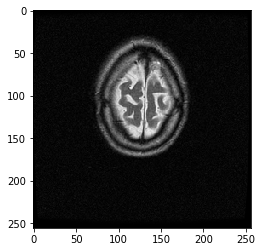

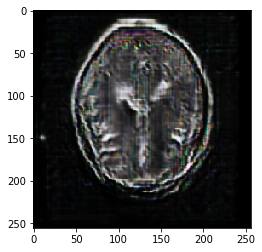

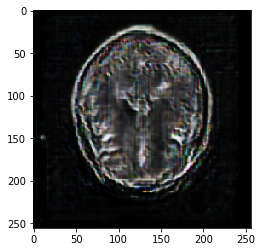

D Real: 0.047946468, D Fake: 0.5518473, G All: 1.2891035
D Real: 0.13959302, D Fake: 0.6157091, G All: 2.401259
D Real: 0.19631201, D Fake: 0.1622442, G All: 3.4031625
D Real: 0.16142812, D Fake: 0.15347797, G All: 3.3605402
D Real: 0.39845175, D Fake: 0.17867257, G All: 4.1489472
D Real: 0.5003669, D Fake: 0.08275005, G All: 3.148924
D Real: 0.24577293, D Fake: 0.22794929, G All: 4.02191
D Real: 1.3243731, D Fake: 0.26931885, G All: 2.415224
D Real: 0.9009134, D Fake: 0.19668674, G All: 2.2418838
D Real: 0.21179956, D Fake: 0.3442465, G All: 2.1498034
D Real: 0.11771442, D Fake: 0.52500683, G All: 1.8522854
D Real: 0.8402531, D Fake: 0.5708366, G All: 2.038835
D Real: 0.554797, D Fake: 0.3083156, G All: 1.9035369
D Real: 0.051606644, D Fake: 0.22981341, G All: 2.7467558
D Real: 0.33156082, D Fake: 0.57360715, G All: 2.7944956
D Real: 0.17120752, D Fake: 0.09212506, G All: 3.0440366
D Real: 0.24347404, D Fake: 0.078182, G All: 3.1822548
D Real: 0.5071001, D Fake: 0.14724287, G All: 2.9

D Real: 0.2944429, D Fake: 0.20625259, G All: 1.8829954
D Real: 0.2867363, D Fake: 0.648996, G All: 2.1111422
D Real: 0.14610185, D Fake: 0.14207797, G All: 2.832549
D Real: 0.11786194, D Fake: 0.15058413, G All: 2.9056785
D Real: 1.1335958, D Fake: 0.077705994, G All: 2.891665
D Real: 0.6240144, D Fake: 0.36793977, G All: 1.9642749
D Real: 0.17466405, D Fake: 0.6004217, G All: 2.1055155
D Real: 0.34888574, D Fake: 0.8947138, G All: 1.3669523
D Real: 0.38216698, D Fake: 0.5558436, G All: 2.2334478
D Real: 0.4434292, D Fake: 0.4846142, G All: 2.601441
D Real: 0.60365343, D Fake: 0.12974223, G All: 2.343011
D Real: 0.14734769, D Fake: 0.31363755, G All: 2.2689326
D Real: 0.4441027, D Fake: 0.53815764, G All: 2.1094923
D Real: 0.2783091, D Fake: 0.20014526, G All: 2.2026153
D Real: 0.45938343, D Fake: 0.39852738, G All: 2.3292027
D Real: 0.035389613, D Fake: 0.4069141, G All: 2.386283
D Real: 0.21231416, D Fake: 0.1417881, G All: 3.1116095
D Real: 0.20920591, D Fake: 0.28677052, G All: 2.

D Real: 0.033936247, D Fake: 0.30467337, G All: 2.939987
D Real: 1.3723366, D Fake: 0.14105228, G All: 3.4803197
D Real: 0.43098482, D Fake: 0.21280017, G All: 2.9859235
D Real: 0.12992123, D Fake: 0.27201217, G All: 2.1367922
D Real: 0.06373376, D Fake: 0.6123986, G All: 2.5654106
D Real: 0.35280287, D Fake: 0.43031135, G All: 2.4379644
D Real: 0.08708194, D Fake: 0.31424856, G All: 2.9160542
D Real: 0.1142229, D Fake: 0.21357083, G All: 3.7960575
D Real: 0.98062336, D Fake: 0.0837535, G All: 3.4504342
D Real: 0.7929691, D Fake: 0.23174775, G All: 2.6822443
D Real: 0.45943934, D Fake: 0.09976726, G All: 2.1404414
D Real: 0.042517837, D Fake: 0.19423142, G All: 1.4215853
D Real: 0.06435074, D Fake: 1.1087937, G All: 2.240132
D Real: 0.46302736, D Fake: 0.2648532, G All: 2.3979588
D Real: 0.9814617, D Fake: 0.25627577, G All: 1.995348
D Real: 0.12210405, D Fake: 0.10039657, G All: 2.678602
D Real: 0.29334325, D Fake: 0.24107267, G All: 2.397695
D Real: 0.040883154, D Fake: 0.28974688, G

D Real: 0.1750552, D Fake: 0.2548395, G All: 2.084151
D Real: 0.074916214, D Fake: 0.17145598, G All: 1.7324431
D Real: 0.19350372, D Fake: 0.39921653, G All: 2.4578238
D Real: 0.2755209, D Fake: 0.3295825, G All: 3.139626
D Real: 0.105021775, D Fake: 0.34222066, G All: 3.3124123
D Real: 0.3631013, D Fake: 0.12849884, G All: 3.8818474
D Real: 0.44809306, D Fake: 0.28134695, G All: 3.70711
D Real: 0.41091654, D Fake: 0.13783334, G All: 2.6881623
D Real: 0.2802647, D Fake: 0.08325032, G All: 2.7129903
D Real: 0.07027775, D Fake: 0.15639345, G All: 2.4980564
D Real: 0.17854515, D Fake: 0.26361114, G All: 2.286056
D Real: 0.13638367, D Fake: 0.18078434, G All: 1.9838486
D Real: 0.059134945, D Fake: 0.26052183, G All: 2.6315293
D Real: 0.1793114, D Fake: 0.12788522, G All: 2.122727
D Real: 0.5378175, D Fake: 0.06264502, G All: 3.242753
D Real: 0.026337797, D Fake: 0.50778025, G All: 2.6232896
D Real: 0.6823373, D Fake: 0.08318805, G All: 2.654387
D Real: 0.08224155, D Fake: 0.18859363, G Al

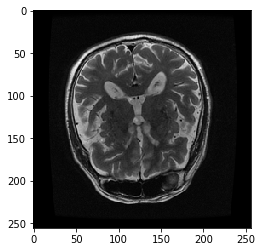

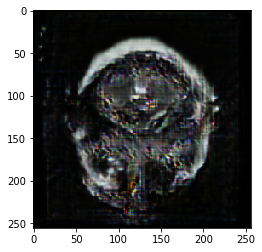

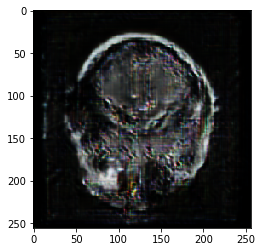

D Real: 0.33558148, D Fake: 0.3390556, G All: 2.3335617
D Real: 0.14475948, D Fake: 0.20937762, G All: 1.8792748
D Real: 0.63166094, D Fake: 0.92675245, G All: 1.8650298
D Real: 0.107123375, D Fake: 0.20978934, G All: 1.6139119
D Real: 0.02834961, D Fake: 0.26731795, G All: 2.913947
D Real: 0.059186406, D Fake: 0.16072667, G All: 3.3254185
D Real: 0.11332686, D Fake: 0.05183862, G All: 3.3047009
D Real: 0.3571449, D Fake: 0.12971616, G All: 3.9336119
D Real: 0.13550603, D Fake: 0.034589246, G All: 3.3411748
D Real: 0.060511522, D Fake: 0.22780108, G All: 3.833918
D Real: 0.1686646, D Fake: 0.09878996, G All: 3.4790545
D Real: 0.34110525, D Fake: 0.06611305, G All: 2.910261
D Real: 1.789031, D Fake: 0.1962753, G All: 2.485086
D Real: 0.04723217, D Fake: 0.559635, G All: 0.9900732
D Real: 0.19113266, D Fake: 0.42015648, G All: 0.8184556
D Real: 0.4532395, D Fake: 0.7723755, G All: 1.524773
D Real: 0.23547997, D Fake: 0.6958726, G All: 2.0430014
D Real: 0.43234605, D Fake: 0.22868505, G A

D Real: 0.081923105, D Fake: 0.59567916, G All: 1.6033458
D Real: 0.27153242, D Fake: 0.5940445, G All: 2.0584073
D Real: 0.13450353, D Fake: 0.09080708, G All: 2.4403915
D Real: 0.16687639, D Fake: 0.15059924, G All: 2.8284388
D Real: 0.076786496, D Fake: 0.26031476, G All: 3.0930583
D Real: 0.102134146, D Fake: 0.11488812, G All: 3.36513
D Real: 0.4397162, D Fake: 0.061008118, G All: 3.5211463
D Real: 0.08354369, D Fake: 0.1498304, G All: 3.7618358
D Real: 0.36291206, D Fake: 0.39160168, G All: 4.0207314
D Real: 0.16826674, D Fake: 0.06391357, G All: 4.0150065
D Real: 0.46682298, D Fake: 0.10603781, G All: 3.6748924
D Real: 0.15924707, D Fake: 0.17054643, G All: 2.8824968
D Real: 0.27995133, D Fake: 0.45801526, G All: 2.5173936
D Real: 0.038461223, D Fake: 0.1309289, G All: 2.770608
D Real: 0.05916415, D Fake: 0.5242362, G All: 2.615119
D Real: 0.052973226, D Fake: 0.124358535, G All: 3.3021235
D Real: 0.053143702, D Fake: 0.0845986, G All: 4.223856
D Real: 0.49017206, D Fake: 0.0526

D Real: 0.2303068, D Fake: 0.083129734, G All: 3.3610568
D Real: 0.046267666, D Fake: 0.061768793, G All: 3.0443301
D Real: 0.62480366, D Fake: 0.2419097, G All: 2.7059188
D Real: 0.06134167, D Fake: 0.113666974, G All: 2.4514823
D Real: 0.106887296, D Fake: 0.48895133, G All: 2.214033
D Real: 0.07377475, D Fake: 0.3365391, G All: 2.71137
D Real: 0.033999007, D Fake: 0.63005817, G All: 2.6553993
D Real: 0.12902349, D Fake: 0.15464176, G All: 4.14454
D Real: 0.8027874, D Fake: 0.05214955, G All: 4.4593096
D Real: 0.6491779, D Fake: 0.0644015, G All: 4.2688828
D Real: 0.16343608, D Fake: 0.08112109, G All: 3.2695804
D Real: 0.70030457, D Fake: 0.103823744, G All: 1.9907122
D Real: 0.15386778, D Fake: 0.23738262, G All: 2.555806
D Real: 0.3103674, D Fake: 0.9346211, G All: 2.4316716
D Real: 0.07698394, D Fake: 0.21684346, G All: 2.317893
D Real: 0.6187158, D Fake: 0.19395596, G All: 3.0538058
D Real: 0.9623817, D Fake: 0.3668366, G All: 1.7875775
D Real: 0.048215497, D Fake: 0.25228474, G

D Real: 0.37440425, D Fake: 0.14520082, G All: 3.1552696
D Real: 0.23708831, D Fake: 0.40356785, G All: 2.186523
D Real: 0.24039286, D Fake: 0.30718017, G All: 2.4182591
D Real: 0.122809075, D Fake: 0.19984296, G All: 2.5897436
D Real: 0.4776461, D Fake: 0.16679254, G All: 2.5482085
D Real: 0.073365405, D Fake: 0.15090202, G All: 2.8120203
D Real: 0.6764389, D Fake: 0.30797887, G All: 2.1160736
D Real: 0.09426814, D Fake: 0.25650203, G All: 1.6779705
D Real: 0.055795494, D Fake: 0.3262246, G All: 2.5948472
D Real: 0.08699574, D Fake: 0.2153213, G All: 2.7310486
D Real: 0.105248034, D Fake: 0.068344995, G All: 3.0458302
D Real: 0.09888024, D Fake: 0.090709165, G All: 4.2076287
D Real: 0.52151406, D Fake: 0.059688568, G All: 3.5825624
D Real: 0.124730684, D Fake: 0.13347623, G All: 2.8914275
D Real: 0.047740858, D Fake: 0.44096708, G All: 2.9683905
D Real: 0.32093534, D Fake: 0.1205513, G All: 3.768805
D Real: 0.19690755, D Fake: 0.09991494, G All: 3.435975
D Real: 0.07848089, D Fake: 0.

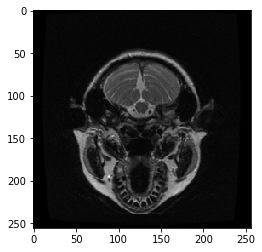

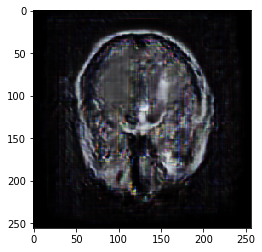

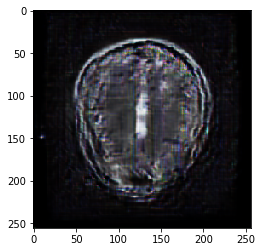

D Real: 0.3096514, D Fake: 0.10600412, G All: 3.4551778
D Real: 0.57136, D Fake: 0.09495589, G All: 3.3369646
D Real: 0.054710884, D Fake: 0.13526222, G All: 2.7864547
D Real: 0.28622562, D Fake: 0.25111797, G All: 3.7831728
D Real: 1.0451454, D Fake: 0.20528118, G All: 1.740288
D Real: 0.04783617, D Fake: 0.4289651, G All: 2.2428477
D Real: 0.060294, D Fake: 0.18669643, G All: 1.9936678
D Real: 0.04949718, D Fake: 0.27243364, G All: 1.9324838
D Real: 0.17180237, D Fake: 0.124740005, G All: 3.1767488
D Real: 0.10725681, D Fake: 0.13247198, G All: 2.4751725
D Real: 0.07756898, D Fake: 0.070522204, G All: 2.7376719
D Real: 0.051269263, D Fake: 0.3576336, G All: 3.21836
D Real: 0.10860263, D Fake: 0.080162175, G All: 4.2010665
D Real: 0.20810235, D Fake: 0.04857695, G All: 4.5105863
D Real: 0.18591332, D Fake: 0.14526114, G All: 3.8904667
D Real: 0.04109656, D Fake: 0.049200743, G All: 4.4585047
D Real: 0.6099255, D Fake: 0.07078244, G All: 3.7054167
D Real: 0.032439522, D Fake: 0.1011231

D Real: 0.103972726, D Fake: 0.878024, G All: 3.374921
D Real: 0.08370748, D Fake: 0.14000675, G All: 4.60349
D Real: 1.4626884, D Fake: 0.39492035, G All: 4.557024
D Real: 1.5051998, D Fake: 0.09562966, G All: 4.3384237
D Real: 1.2392796, D Fake: 0.25372398, G All: 3.8182049
D Real: 0.3895557, D Fake: 0.5408528, G All: 1.552551
D Real: 0.03703315, D Fake: 0.4525801, G All: 2.091362
D Real: 0.03537643, D Fake: 0.53757644, G All: 2.2053692
D Real: 0.038853243, D Fake: 0.22215664, G All: 2.3374557
D Real: 0.03795076, D Fake: 0.7035614, G All: 3.6757035
D Real: 1.2637786, D Fake: 0.043923836, G All: 3.6114593
D Real: 1.0578072, D Fake: 0.039763946, G All: 3.770303
D Real: 0.19446854, D Fake: 0.12293163, G All: 3.4694257
D Real: 0.12316607, D Fake: 0.07554501, G All: 3.3628473
D Real: 0.09700529, D Fake: 0.32348347, G All: 2.7202861
D Real: 0.14095458, D Fake: 0.62444186, G All: 2.2396855
D Real: 0.045644816, D Fake: 0.22876292, G All: 3.1874807
D Real: 0.07792676, D Fake: 0.22005352, G Al

D Real: 0.8963007, D Fake: 0.21472079, G All: 2.4643545
D Real: 0.50679874, D Fake: 0.422464, G All: 2.6106358
D Real: 0.082118884, D Fake: 0.3675456, G All: 2.4359665
D Real: 0.4301772, D Fake: 0.4860999, G All: 2.5864916
D Real: 0.4073544, D Fake: 0.09215134, G All: 3.121838
D Real: 0.10191426, D Fake: 0.19298777, G All: 3.977228
D Real: 0.5624602, D Fake: 0.1332977, G All: 2.9018545
D Real: 0.2140567, D Fake: 0.33939016, G All: 3.4815907
D Real: 0.6936844, D Fake: 0.4933926, G All: 3.3381171
D Real: 0.3586051, D Fake: 0.097484246, G All: 3.876401
D Real: 0.5457828, D Fake: 0.096296296, G All: 2.8808026
D Real: 0.8262546, D Fake: 0.5317997, G All: 1.4282243
D Real: 0.06346151, D Fake: 0.5142119, G All: 1.671767
D Real: 0.035099577, D Fake: 0.91560674, G All: 1.5485682
D Real: 0.19814746, D Fake: 0.21191284, G All: 2.219812
D Real: 0.18703452, D Fake: 0.11900456, G All: 2.5324445
D Real: 1.8493952, D Fake: 0.39390495, G All: 2.2792158
D Real: 0.3318099, D Fake: 0.45283386, G All: 1.89

D Real: 0.087073825, D Fake: 0.09908512, G All: 3.3316221
D Real: 0.18888414, D Fake: 0.15473865, G All: 2.8089483
D Real: 0.37257135, D Fake: 0.28290442, G All: 2.4519272
D Real: 0.13610022, D Fake: 0.1763413, G All: 2.470035
D Real: 0.27659225, D Fake: 0.12484618, G All: 2.494386
D Real: 0.2881747, D Fake: 0.40249792, G All: 1.6552229
D Real: 0.16999152, D Fake: 0.26521444, G All: 1.5556731
D Real: 0.057913825, D Fake: 0.5416176, G All: 1.4290161
D Real: 0.36527765, D Fake: 0.7346269, G All: 1.9437501
D Real: 0.25563335, D Fake: 0.15502371, G All: 3.7645278
D Real: 0.3346579, D Fake: 0.31927115, G All: 4.0029354
D Real: 0.56954986, D Fake: 0.068143494, G All: 2.7820926
D Real: 0.7276522, D Fake: 0.27447876, G All: 2.3428113
D Real: 0.34571183, D Fake: 0.17030065, G All: 2.101378
D Real: 0.042495422, D Fake: 0.29558372, G All: 1.7175533
D Real: 0.06791428, D Fake: 0.5206108, G All: 2.4438667
D Real: 0.6958586, D Fake: 0.3037437, G All: 2.5562701
D Real: 0.10780456, D Fake: 0.32987875,

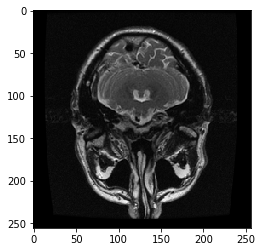

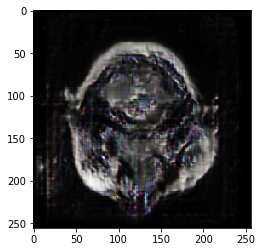

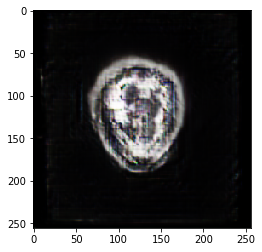

D Real: 0.47465807, D Fake: 0.042023834, G All: 3.8905869
D Real: 0.30042335, D Fake: 0.28828555, G All: 3.8362296
D Real: 0.93983585, D Fake: 0.10766718, G All: 3.6825569
D Real: 0.75149584, D Fake: 0.18699019, G All: 3.1221693
D Real: 0.9095705, D Fake: 0.22395486, G All: 3.0619116
D Real: 0.039899185, D Fake: 0.41880566, G All: 1.8162899
D Real: 0.2592343, D Fake: 0.39677224, G All: 1.4477304
D Real: 0.5634946, D Fake: 0.72716695, G All: 1.9462336
D Real: 0.10742323, D Fake: 0.20423374, G All: 2.329618
D Real: 0.60737103, D Fake: 0.21743158, G All: 1.9717367
D Real: 0.09635453, D Fake: 0.3873952, G All: 2.624775
D Real: 0.10312442, D Fake: 0.17964742, G All: 3.0864742
D Real: 0.21743967, D Fake: 0.084915414, G All: 3.2677772
D Real: 0.20559108, D Fake: 0.11939001, G All: 2.8943002
D Real: 0.31794202, D Fake: 0.10965953, G All: 2.5164065
D Real: 0.28925908, D Fake: 0.13587674, G All: 2.3048272
D Real: 0.044903167, D Fake: 0.20481533, G All: 2.4699154
D Real: 0.11077481, D Fake: 0.123

D Real: 0.04181809, D Fake: 0.5792922, G All: 1.7652112
D Real: 0.07966833, D Fake: 0.33257812, G All: 2.1186242
D Real: 0.06947958, D Fake: 0.3205872, G All: 3.0386245
D Real: 0.15392612, D Fake: 0.041838992, G All: 3.6419282
D Real: 0.27657932, D Fake: 0.086921364, G All: 4.685396
D Real: 1.2100563, D Fake: 0.07865849, G All: 4.4024167
D Real: 1.4809089, D Fake: 0.121738374, G All: 2.6922617
D Real: 0.087340206, D Fake: 0.4925768, G All: 1.0173917
D Real: 0.28684354, D Fake: 1.5461123, G All: 1.3626962
D Real: 0.048044376, D Fake: 0.85800934, G All: 1.5426267
D Real: 0.92509097, D Fake: 0.5691092, G All: 2.166576
D Real: 0.039676275, D Fake: 0.22773027, G All: 2.9701362
D Real: 0.72871107, D Fake: 0.15167859, G All: 3.740614
D Real: 0.0444473, D Fake: 0.14060776, G All: 3.5529406
D Real: 0.18234514, D Fake: 0.07273706, G All: 4.8201847
D Real: 0.45961872, D Fake: 0.07934196, G All: 3.9919462
D Real: 1.1401358, D Fake: 0.15038362, G All: 2.4874232
D Real: 0.27805352, D Fake: 0.5686195

D Real: 0.12040576, D Fake: 1.2209345, G All: 2.2230902
D Real: 0.39759013, D Fake: 0.40932038, G All: 2.867012
D Real: 0.32590133, D Fake: 0.0626362, G All: 2.476694
D Real: 0.33720595, D Fake: 0.23273501, G All: 3.2048752
D Real: 1.4389898, D Fake: 0.118409276, G All: 2.4169583
D Real: 0.5741211, D Fake: 0.4283967, G All: 1.3627756
D Real: 0.35199836, D Fake: 0.77906835, G All: 0.8207239
D Real: 0.057054836, D Fake: 1.3043423, G All: 1.3521713
D Real: 0.3151802, D Fake: 0.49668133, G All: 2.7971427
D Real: 0.35872835, D Fake: 0.20237555, G All: 2.8145878
D Real: 0.048882775, D Fake: 0.40178448, G All: 3.4014015
D Real: 0.12836805, D Fake: 0.16601825, G All: 4.6561728
D Real: 0.45202953, D Fake: 0.054635763, G All: 3.855623
D Real: 0.1624059, D Fake: 0.064936794, G All: 4.407881
D Real: 0.9984746, D Fake: 0.25289366, G All: 3.7633584
D Real: 0.28281015, D Fake: 0.044099037, G All: 2.7590322
D Real: 0.05340322, D Fake: 0.24101667, G All: 2.716908
D Real: 0.11318901, D Fake: 0.19673675,

D Real: 0.2278336, D Fake: 0.32851866, G All: 0.9828701
D Real: 0.16560632, D Fake: 2.0879996, G All: 0.96015
D Real: 0.0530358, D Fake: 0.65695083, G All: 2.3072178
D Real: 0.07628613, D Fake: 0.08779579, G All: 3.716309
D Real: 0.1937453, D Fake: 0.0427219, G All: 4.3668294
D Real: 1.4304465, D Fake: 0.040981248, G All: 4.86687
D Real: 0.06571525, D Fake: 0.04873682, G All: 4.014302
D Real: 0.90630937, D Fake: 0.07931104, G All: 3.360434
D Real: 0.8943924, D Fake: 0.22660697, G All: 2.1667495
D Real: 0.04045753, D Fake: 0.45406085, G All: 1.3361847
D Real: 0.07137984, D Fake: 1.0468857, G All: 0.87317777
D Real: 0.044306926, D Fake: 0.27641758, G All: 1.642012
D Real: 0.068290256, D Fake: 0.18684241, G All: 2.712946
D Real: 0.084715314, D Fake: 0.21274976, G All: 1.823809
D Real: 0.123181134, D Fake: 0.1413053, G All: 3.0525866
D Real: 0.039454777, D Fake: 0.13967568, G All: 3.360578
D Real: 0.07661162, D Fake: 0.06478434, G All: 4.9158936
D Real: 0.24994744, D Fake: 0.033772636, G A

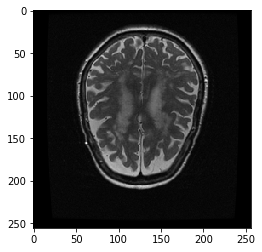

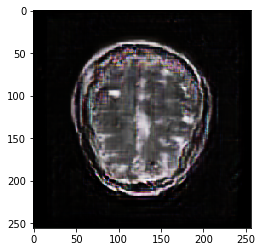

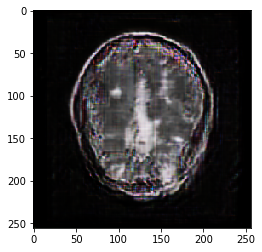

D Real: 0.3045291, D Fake: 0.6689651, G All: 2.844293
D Real: 0.569764, D Fake: 0.1018803, G All: 2.062705
D Real: 0.2198199, D Fake: 0.3840279, G All: 2.3663988
D Real: 0.12849304, D Fake: 0.19141996, G All: 2.293005
D Real: 1.0716037, D Fake: 0.26636186, G All: 1.6249785
D Real: 0.12756443, D Fake: 0.27281365, G All: 1.8602759
D Real: 0.16760427, D Fake: 0.33867753, G All: 2.501246
D Real: 0.17593172, D Fake: 0.26349074, G All: 2.7428575
D Real: 0.779106, D Fake: 0.2185784, G All: 2.6134229
D Real: 0.14332904, D Fake: 0.08822907, G All: 2.6256714
D Real: 0.07772368, D Fake: 0.4426139, G All: 2.5674849
D Real: 0.6802109, D Fake: 0.26823598, G All: 3.1911411
D Real: 1.2093558, D Fake: 0.21613117, G All: 1.762408
D Real: 0.0422015, D Fake: 0.22776356, G All: 1.9533131
D Real: 0.23147917, D Fake: 0.57415074, G All: 2.174487
D Real: 0.057438567, D Fake: 0.2355866, G All: 2.4594684
D Real: 0.9483311, D Fake: 0.07659247, G All: 2.1407409
D Real: 0.10971032, D Fake: 0.32439086, G All: 2.2327

D Real: 0.12701699, D Fake: 0.58496577, G All: 1.3459392
D Real: 0.026991751, D Fake: 0.7786686, G All: 1.4200373
D Real: 0.06803222, D Fake: 0.4990923, G All: 1.8874826
D Real: 0.13166985, D Fake: 0.3091542, G All: 2.6225247
D Real: 0.6700697, D Fake: 0.3034314, G All: 2.8748221
D Real: 0.58885425, D Fake: 0.23399639, G All: 2.6518102
D Real: 0.394884, D Fake: 0.18214515, G All: 2.6365938
D Real: 0.08162667, D Fake: 0.12520914, G All: 1.9286207
D Real: 0.22805236, D Fake: 0.12805551, G All: 1.6862986
D Real: 0.111684054, D Fake: 0.46605384, G All: 2.1286197
D Real: 0.29093942, D Fake: 0.26177207, G All: 2.136972
D Real: 0.058107864, D Fake: 0.42372924, G All: 2.1771913
D Real: 0.20520769, D Fake: 0.23764646, G All: 2.7213593
D Real: 0.8161718, D Fake: 0.05183155, G All: 2.8475285
D Real: 0.084526815, D Fake: 0.052655015, G All: 2.8525305
D Real: 0.35300624, D Fake: 0.23155798, G All: 2.3994195
D Real: 1.3542337, D Fake: 0.10399057, G All: 1.8261633
D Real: 0.039490104, D Fake: 0.41742

D Real: 0.03635881, D Fake: 0.2291364, G All: 2.4305673
D Real: 0.04180352, D Fake: 0.22897992, G All: 3.333663
D Real: 0.053827886, D Fake: 0.10479742, G All: 3.838172
D Real: 0.8671609, D Fake: 0.27041975, G All: 3.7704706
D Real: 0.08150305, D Fake: 0.0618931, G All: 4.068819
D Real: 1.6365018, D Fake: 0.07656585, G All: 2.4510746
D Real: 0.2628351, D Fake: 0.19276474, G All: 2.26047
D Real: 0.7067997, D Fake: 0.1378578, G All: 2.5943704
D Real: 0.45423463, D Fake: 0.75559, G All: 1.9941207
D Real: 0.12999916, D Fake: 0.31350526, G All: 1.7707236
D Real: 0.04204151, D Fake: 0.22222115, G All: 2.3857293
D Real: 0.15418293, D Fake: 0.53269887, G All: 2.0691628
D Real: 0.524163, D Fake: 0.120207384, G All: 2.5234964
D Real: 0.7696661, D Fake: 0.10380186, G All: 2.0244403
D Real: 0.122816294, D Fake: 0.25790834, G All: 2.4549084
D Real: 0.0655283, D Fake: 0.09784979, G All: 2.5826688
D Real: 0.8520048, D Fake: 0.4501461, G All: 2.1850307
D Real: 0.06235076, D Fake: 0.23290652, G All: 2.

D Real: 0.16323322, D Fake: 0.21571892, G All: 2.5781674
D Real: 0.095540546, D Fake: 0.1476467, G All: 1.8703308
D Real: 0.037190996, D Fake: 0.2821926, G All: 2.3941598
D Real: 0.31911123, D Fake: 0.12198618, G All: 2.9445415
D Real: 0.50997543, D Fake: 0.20353189, G All: 2.9310591
D Real: 0.114917375, D Fake: 0.16286458, G All: 2.6723728
D Real: 0.06858534, D Fake: 0.16830006, G All: 3.8580403
D Real: 0.30662003, D Fake: 0.29722738, G All: 2.9877996
D Real: 0.091338575, D Fake: 0.102799706, G All: 2.9334614
D Real: 0.061167274, D Fake: 0.04809685, G All: 3.9526913
D Real: 0.0480083, D Fake: 0.050732892, G All: 4.4688773
D Real: 0.83181894, D Fake: 0.06380896, G All: 2.7078867
D Real: 0.053968858, D Fake: 0.114276975, G All: 2.0420585
D Real: 0.23675072, D Fake: 0.19339477, G All: 1.7675366
D Real: 0.11437684, D Fake: 0.35359597, G All: 1.6185544
D Real: 0.038230836, D Fake: 0.5742823, G All: 1.3386922
D Real: 0.0453483, D Fake: 0.20219147, G All: 2.3020775
D Real: 0.04150228, D Fake

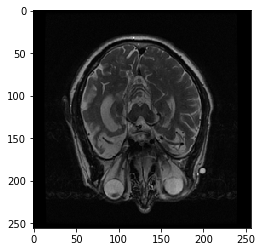

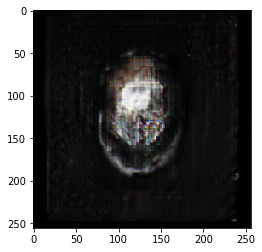

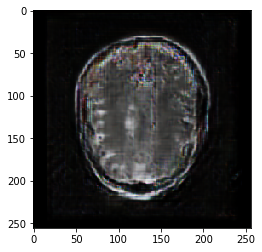

D Real: 0.346369, D Fake: 0.4555754, G All: 2.620277
D Real: 0.68133426, D Fake: 0.33615357, G All: 1.7798901
D Real: 0.451637, D Fake: 0.25184867, G All: 1.9901607
D Real: 0.10702702, D Fake: 0.32551792, G All: 2.5025227
D Real: 0.21528514, D Fake: 0.33859456, G All: 2.2011013
D Real: 0.23193744, D Fake: 0.24837083, G All: 2.2181256
D Real: 0.1759043, D Fake: 0.13996893, G All: 2.2035213
D Real: 0.2842751, D Fake: 0.26727077, G All: 2.4629922
D Real: 0.2732647, D Fake: 0.23979726, G All: 2.249621
D Real: 0.36440784, D Fake: 0.24304402, G All: 2.183945
D Real: 0.35864693, D Fake: 0.25567526, G All: 2.533482
D Real: 0.18031642, D Fake: 0.24790837, G All: 2.8851004
D Real: 0.05326705, D Fake: 0.2152776, G All: 2.707443
D Real: 0.41289154, D Fake: 0.20424816, G All: 2.9260502
D Real: 0.22266838, D Fake: 0.17626725, G All: 2.1252232
D Real: 0.14238948, D Fake: 0.27672264, G All: 2.1776092
D Real: 0.1806244, D Fake: 0.24761224, G All: 1.7885015
D Real: 0.41346908, D Fake: 0.2884752, G All: 

D Real: 0.16686866, D Fake: 0.56674564, G All: 2.2682326
D Real: 1.0184374, D Fake: 0.28512716, G All: 1.7511494
D Real: 0.7642006, D Fake: 0.31242675, G All: 1.6785579
D Real: 0.4960062, D Fake: 0.25235912, G All: 0.74912417
D Real: 0.116855115, D Fake: 1.7219163, G All: 1.2906632
D Real: 0.12867701, D Fake: 0.58190954, G All: 1.9308174
D Real: 0.046236902, D Fake: 0.13188747, G All: 2.9875941
D Real: 0.61974525, D Fake: 0.37082326, G All: 3.3608756
D Real: 1.4014251, D Fake: 0.25401747, G All: 3.8516316
D Real: 0.2243835, D Fake: 0.21427315, G All: 2.6081505
D Real: 0.38335901, D Fake: 0.22065708, G All: 2.3610835
D Real: 0.06306277, D Fake: 0.31242543, G All: 2.3583617
D Real: 0.1835543, D Fake: 0.1494538, G All: 2.396934
D Real: 0.37023538, D Fake: 0.55111766, G All: 1.6191878
D Real: 0.10779801, D Fake: 0.17921114, G All: 1.7031307
D Real: 0.07398117, D Fake: 0.3317234, G All: 2.396296
D Real: 0.15610054, D Fake: 0.21142618, G All: 2.2448337
D Real: 0.21001291, D Fake: 0.10428748,

D Real: 0.24289937, D Fake: 0.2699558, G All: 2.9069543
D Real: 0.09920593, D Fake: 0.13014388, G All: 3.207991
D Real: 0.6797069, D Fake: 0.5163851, G All: 3.122999
D Real: 0.5622215, D Fake: 0.07119208, G All: 3.4898026
D Real: 1.1362693, D Fake: 0.4242441, G All: 1.663573
D Real: 0.25456128, D Fake: 0.26915896, G All: 1.442023
D Real: 0.55540067, D Fake: 0.94082177, G All: 1.0979248
D Real: 0.08175339, D Fake: 0.24662013, G All: 1.9167279
D Real: 0.049065135, D Fake: 0.24614984, G All: 2.0554998
D Real: 0.3004645, D Fake: 0.2736856, G All: 2.5617206
D Real: 0.07283692, D Fake: 0.13805276, G All: 3.6227093
D Real: 0.6082276, D Fake: 0.057446238, G All: 3.3796873
D Real: 0.27912253, D Fake: 0.059988208, G All: 3.762627
D Real: 0.49417603, D Fake: 0.13399963, G All: 2.7667444
D Real: 0.21860212, D Fake: 0.36916497, G All: 2.7277918
D Real: 0.17704538, D Fake: 0.2676434, G All: 1.9124784
D Real: 0.14030436, D Fake: 0.13833466, G All: 2.3064837
D Real: 0.09124325, D Fake: 0.33346665, G A

D Real: 0.9439504, D Fake: 0.691444, G All: 0.8645214
D Real: 0.05967325, D Fake: 0.59112406, G All: 1.6610464
D Real: 0.19591936, D Fake: 0.8050076, G All: 1.5801225
D Real: 0.06510525, D Fake: 0.43796676, G All: 2.6821175
D Real: 0.21189776, D Fake: 0.09021837, G All: 4.3566027
D Real: 0.2797728, D Fake: 0.05716468, G All: 5.296506
D Real: 1.0021143, D Fake: 0.050384317, G All: 3.8576715
D Real: 0.7989384, D Fake: 0.54127574, G All: 3.054705
D Real: 0.21968536, D Fake: 0.3125089, G All: 3.1604939
D Real: 0.17169115, D Fake: 0.15866679, G All: 2.7363818
D Real: 0.07556025, D Fake: 0.2289724, G All: 2.6559196
D Real: 0.10158916, D Fake: 0.36742437, G All: 3.686965
D Real: 0.1443057, D Fake: 0.10141213, G All: 4.2065697
D Real: 0.34052578, D Fake: 0.06692813, G All: 2.976637
D Real: 0.15547144, D Fake: 0.041942433, G All: 2.6664116
D Real: 0.22139391, D Fake: 0.058970444, G All: 3.3606224
D Real: 0.09449906, D Fake: 0.35934547, G All: 2.5749779
D Real: 0.09601474, D Fake: 0.5784594, G A

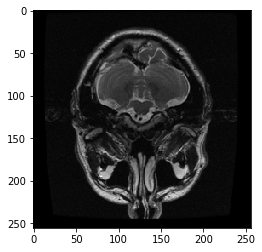

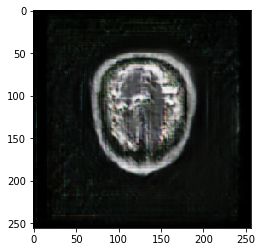

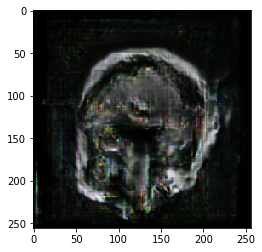

D Real: 0.06959066, D Fake: 0.1338642, G All: 1.8261193
D Real: 0.39935324, D Fake: 0.25806928, G All: 1.6798987
D Real: 0.42755884, D Fake: 0.30811447, G All: 2.1011925
D Real: 0.034934934, D Fake: 0.31104743, G All: 1.5365555
D Real: 0.49084234, D Fake: 0.5825099, G All: 2.0060709
D Real: 0.4585623, D Fake: 0.28546354, G All: 1.8671051
D Real: 0.6473662, D Fake: 1.4562631, G All: 1.3717077
D Real: 0.22778185, D Fake: 0.4012552, G All: 2.8696818
D Real: 0.48910648, D Fake: 0.14811082, G All: 2.4343064
D Real: 0.5841775, D Fake: 0.11907682, G All: 3.053401
D Real: 0.16626321, D Fake: 0.08006986, G All: 2.1365747
D Real: 0.9597896, D Fake: 0.26574618, G All: 1.4810476
D Real: 0.09547101, D Fake: 0.7208996, G All: 1.4124243
D Real: 0.31268165, D Fake: 0.19341668, G All: 1.3997972
D Real: 0.14041121, D Fake: 0.55173063, G All: 1.5193814
D Real: 0.24248172, D Fake: 0.25837398, G All: 1.789082
D Real: 0.5563302, D Fake: 0.34537557, G All: 2.3056118
D Real: 0.17153051, D Fake: 0.9337785, G A

D Real: 0.12971243, D Fake: 0.41308898, G All: 3.5660553
D Real: 0.5625297, D Fake: 0.20832172, G All: 3.560279
D Real: 1.4155165, D Fake: 0.22378246, G All: 2.4718523
D Real: 0.16144912, D Fake: 0.102100395, G All: 3.4656165
D Real: 0.35388067, D Fake: 0.35534507, G All: 2.2229717
D Real: 0.11298333, D Fake: 0.7095526, G All: 1.9442643
D Real: 0.12495914, D Fake: 0.45511937, G All: 2.0617023
D Real: 0.4250142, D Fake: 0.17345414, G All: 2.0939507
D Real: 0.54216003, D Fake: 0.17145263, G All: 1.857437
D Real: 0.04362511, D Fake: 0.14395288, G All: 2.1113694
D Real: 0.45790672, D Fake: 0.30494252, G All: 2.6487236
D Real: 0.41638234, D Fake: 0.26791534, G All: 2.0890567
D Real: 0.22454403, D Fake: 0.25997365, G All: 2.2613149
D Real: 0.4779129, D Fake: 0.1647969, G All: 2.4473174
D Real: 0.53871447, D Fake: 0.28481323, G All: 1.9329655
D Real: 0.37106583, D Fake: 0.38406056, G All: 1.9194763
D Real: 0.09872693, D Fake: 1.1616311, G All: 2.5333905
D Real: 0.10326001, D Fake: 0.24477378,

D Real: 0.040706947, D Fake: 0.03827074, G All: 3.6852987
D Real: 0.8505341, D Fake: 0.050674543, G All: 2.9030855
D Real: 0.060754776, D Fake: 0.24985269, G All: 2.1238723
D Real: 0.29667103, D Fake: 0.2734489, G All: 2.25211
D Real: 0.08975783, D Fake: 0.36986512, G All: 1.8342466
D Real: 0.080318436, D Fake: 0.4225062, G All: 2.5223036
D Real: 0.04198512, D Fake: 0.20211768, G All: 2.379897
D Real: 0.07468136, D Fake: 0.1219136, G All: 3.308806
D Real: 0.233473, D Fake: 0.20949116, G All: 2.9650187
D Real: 0.6847846, D Fake: 0.08757961, G All: 3.4698625
D Real: 0.09563361, D Fake: 0.066087976, G All: 3.760195
D Real: 0.4054104, D Fake: 0.18389292, G All: 3.4529994
D Real: 0.077442095, D Fake: 0.13070118, G All: 1.7836301
D Real: 0.061450407, D Fake: 0.11928262, G All: 2.3281145
D Real: 0.13548917, D Fake: 0.16622943, G All: 2.3941736
D Real: 0.92155915, D Fake: 0.66829264, G All: 1.9563696
D Real: 0.5651319, D Fake: 0.26468027, G All: 2.1565824
D Real: 0.18265459, D Fake: 0.6485168,

D Real: 0.46386778, D Fake: 0.13020083, G All: 3.6744828
D Real: 0.15011732, D Fake: 0.15213525, G All: 3.4823587
D Real: 0.057093564, D Fake: 0.10029657, G All: 2.6611109
D Real: 0.51303434, D Fake: 0.24510266, G All: 2.1537247
D Real: 0.7637577, D Fake: 0.59741277, G All: 2.6989894
D Real: 1.2966614, D Fake: 0.24417381, G All: 2.0627277
D Real: 0.14258556, D Fake: 1.1612083, G All: 1.640374
D Real: 0.09320705, D Fake: 0.37417203, G All: 3.088892
D Real: 0.04650934, D Fake: 0.18502405, G All: 3.1499772
D Real: 0.116061255, D Fake: 0.20846754, G All: 2.8801818
D Real: 0.6505681, D Fake: 0.12882552, G All: 3.3458147
D Real: 1.0063221, D Fake: 0.04603716, G All: 2.9571838
D Real: 0.1620697, D Fake: 0.22723371, G All: 1.7951974
D Real: 0.45340368, D Fake: 0.12793668, G All: 2.3648977
D Real: 0.08641351, D Fake: 0.36262792, G All: 1.086515
D Real: 0.059901163, D Fake: 1.1737092, G All: 1.8630643
D Real: 0.73050666, D Fake: 0.26666117, G All: 2.3801022
D Real: 0.65916324, D Fake: 0.2076239,

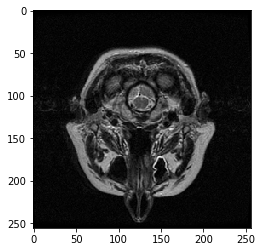

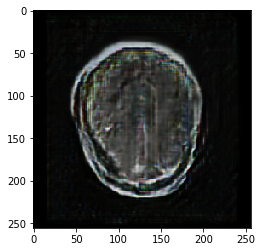

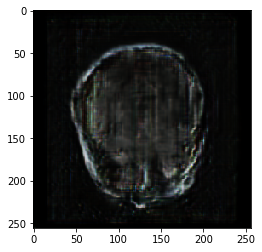

D Real: 1.1369023, D Fake: 0.11921956, G All: 2.5635962
D Real: 0.28040123, D Fake: 0.13049276, G All: 2.2995255
D Real: 0.19854233, D Fake: 0.16344303, G All: 2.203522
D Real: 0.050589323, D Fake: 0.4532277, G All: 2.3515563
D Real: 0.05454359, D Fake: 0.65973365, G All: 2.112337
D Real: 0.12713218, D Fake: 0.5445738, G All: 3.2727282
D Real: 0.04872097, D Fake: 0.06752117, G All: 3.4938602
D Real: 0.33914235, D Fake: 0.07706775, G All: 3.880282
D Real: 0.36065328, D Fake: 0.079756066, G All: 3.5194874
D Real: 0.0880295, D Fake: 0.15185428, G All: 3.5658224
D Real: 0.5050861, D Fake: 0.11491934, G All: 4.2190547
D Real: 1.1209438, D Fake: 0.07273717, G All: 3.178257
D Real: 0.7314292, D Fake: 0.1846127, G All: 2.2583795
D Real: 0.35594538, D Fake: 0.24434201, G All: 1.9801885
D Real: 0.049103647, D Fake: 0.24598137, G All: 1.761308
D Real: 0.030804813, D Fake: 0.35286444, G All: 1.4890268
D Real: 0.049948454, D Fake: 0.13225926, G All: 1.9235095
D Real: 0.05564809, D Fake: 0.13137715,

D Real: 0.51793534, D Fake: 0.08042909, G All: 3.6270695
D Real: 0.6386026, D Fake: 0.123486206, G All: 2.899468
D Real: 0.18384038, D Fake: 0.073222674, G All: 3.2409909
D Real: 0.06857253, D Fake: 0.19090518, G All: 3.3961573
D Real: 0.04550426, D Fake: 0.24868813, G All: 2.2000594
D Real: 0.12456023, D Fake: 0.11291912, G All: 3.2074406
D Real: 0.92881227, D Fake: 0.39547634, G All: 2.0186698
D Real: 0.45632464, D Fake: 0.7981493, G All: 2.5138493
D Real: 0.19429146, D Fake: 0.20399866, G All: 2.3685946
D Real: 0.24221154, D Fake: 0.30714577, G All: 2.1186497
D Real: 0.16162282, D Fake: 0.36987686, G All: 2.4216127
D Real: 0.4913273, D Fake: 0.31904098, G All: 3.0787883
D Real: 0.80917007, D Fake: 0.20708798, G All: 2.3066392
D Real: 0.27965516, D Fake: 0.39002284, G All: 1.6448512
D Real: 0.14039108, D Fake: 0.3790116, G All: 2.9493299
D Real: 0.5623428, D Fake: 0.45235127, G All: 2.2293432
D Real: 0.55889064, D Fake: 0.35174036, G All: 2.5049653
D Real: 0.42612016, D Fake: 0.17778

D Real: 0.18368557, D Fake: 0.15311532, G All: 3.7170272
D Real: 0.95132434, D Fake: 0.12305721, G All: 2.0920808
D Real: 0.08924499, D Fake: 0.25522876, G All: 1.7958255
D Real: 0.79514325, D Fake: 0.6585469, G All: 1.254431
D Real: 0.5688392, D Fake: 0.7882379, G All: 0.9642936
D Real: 0.38949916, D Fake: 0.53115946, G All: 1.2290869
D Real: 0.44005167, D Fake: 0.38196892, G All: 1.4165345
D Real: 0.044505276, D Fake: 0.5619011, G All: 1.9667734
D Real: 0.5876571, D Fake: 0.21198994, G All: 2.8263073
D Real: 0.13623115, D Fake: 0.23264448, G All: 2.5990114
D Real: 1.3139677, D Fake: 0.27926275, G All: 2.2389011
D Real: 0.15477826, D Fake: 0.45692438, G All: 2.0684373
D Real: 0.5196671, D Fake: 0.52618265, G All: 2.0487647
D Real: 0.10948802, D Fake: 0.40140805, G All: 2.0838354
D Real: 0.18187031, D Fake: 0.20244765, G All: 2.0478387
D Real: 0.18694627, D Fake: 0.13796693, G All: 2.2130566
D Real: 0.15963392, D Fake: 0.20867105, G All: 2.6483693
D Real: 0.06976521, D Fake: 0.2561133,

D Real: 0.5820979, D Fake: 0.14327554, G All: 2.3292625
D Real: 0.09142975, D Fake: 0.30597723, G All: 2.5521774
D Real: 0.55203205, D Fake: 0.19171788, G All: 2.6357045
D Real: 0.7560178, D Fake: 0.37956113, G All: 2.9031448
D Real: 0.13154599, D Fake: 0.13117433, G All: 2.1628618
D Real: 0.50974303, D Fake: 0.43040156, G All: 1.9409817
D Real: 0.41733825, D Fake: 0.32597798, G All: 1.6591779
D Real: 0.17797337, D Fake: 0.24800754, G All: 2.5378628
D Real: 0.63824195, D Fake: 0.24855316, G All: 1.2574382
D Real: 0.31806546, D Fake: 0.42488572, G All: 1.7821434
D Real: 0.052465677, D Fake: 0.4014782, G All: 2.0318847
D Real: 0.437521, D Fake: 0.089747295, G All: 2.149977
D Real: 0.5249237, D Fake: 0.20525791, G All: 2.4770322
D Real: 0.62322974, D Fake: 0.3512452, G All: 2.5391445
D Real: 0.19050398, D Fake: 0.24930044, G All: 1.8978195
D Real: 0.1893011, D Fake: 0.57469547, G All: 2.5221257
D Real: 0.06591116, D Fake: 0.11794756, G All: 2.4297805
D Real: 0.12723021, D Fake: 0.07190435

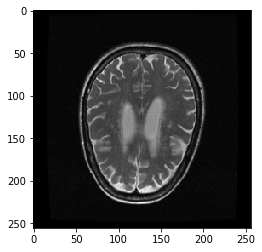

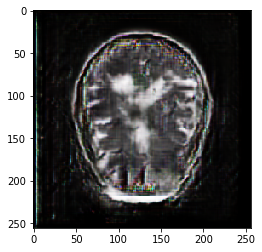

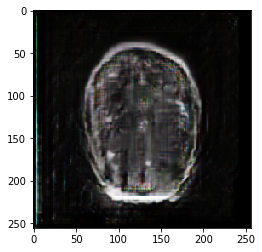

D Real: 0.30188626, D Fake: 0.54491043, G All: 2.251492
D Real: 0.1475488, D Fake: 0.19256501, G All: 2.0598755
D Real: 0.23726854, D Fake: 0.6772934, G All: 2.5816174
D Real: 0.41303408, D Fake: 0.27147168, G All: 4.13005
D Real: 0.038767353, D Fake: 0.078044415, G All: 5.2075944
D Real: 0.28158513, D Fake: 0.07018142, G All: 3.580594
D Real: 0.111693405, D Fake: 0.047366977, G All: 3.5199323
D Real: 1.1799175, D Fake: 0.15073663, G All: 2.5123327
D Real: 0.5275626, D Fake: 0.38293254, G All: 1.7388105
D Real: 0.16330513, D Fake: 0.54705, G All: 1.6047986
D Real: 0.17782718, D Fake: 0.14721763, G All: 2.236978
D Real: 0.054667495, D Fake: 0.508497, G All: 2.9427216
D Real: 0.16267408, D Fake: 0.19482034, G All: 2.1592493
D Real: 0.07536315, D Fake: 0.28535086, G All: 2.9621298
D Real: 0.3978562, D Fake: 0.10259798, G All: 2.94304
D Real: 0.46811265, D Fake: 0.061085105, G All: 2.6658735
D Real: 0.09691027, D Fake: 0.20790532, G All: 3.0650368
D Real: 0.15393524, D Fake: 0.09536375, G 

D Real: 0.7925913, D Fake: 0.33122972, G All: 2.2273612
D Real: 0.20533213, D Fake: 0.28445458, G All: 1.6378039
D Real: 0.07086913, D Fake: 0.15398811, G All: 0.9284446
D Real: 0.04905694, D Fake: 1.2768546, G All: 1.270704
D Real: 0.030203277, D Fake: 0.7722028, G All: 2.5619779
D Real: 0.32494506, D Fake: 0.11143196, G All: 4.1871157
D Real: 0.39960966, D Fake: 0.09216911, G All: 5.242755
D Real: 0.44736302, D Fake: 0.03133508, G All: 5.2239976
D Real: 0.9996152, D Fake: 0.054023225, G All: 4.944622
D Real: 0.058993928, D Fake: 0.055388995, G All: 4.4008265
D Real: 0.26578236, D Fake: 0.08185156, G All: 4.370714
D Real: 0.14509237, D Fake: 0.4841795, G All: 3.5999355
D Real: 0.10525095, D Fake: 0.5160136, G All: 3.4885864
D Real: 0.18112418, D Fake: 0.2932524, G All: 3.47569
D Real: 0.11732833, D Fake: 0.20182633, G All: 2.539835
D Real: 0.029672086, D Fake: 0.25342882, G All: 2.8294015
D Real: 0.030972606, D Fake: 0.43612453, G All: 4.1993856
D Real: 0.29728138, D Fake: 0.031324908

D Real: 0.12574686, D Fake: 0.16960262, G All: 3.043289
D Real: 0.9775096, D Fake: 0.1349966, G All: 2.875414
D Real: 0.097995654, D Fake: 0.41835096, G All: 2.1164038
D Real: 0.18595079, D Fake: 0.17308667, G All: 2.7858722
D Real: 0.05569239, D Fake: 0.13176966, G All: 1.7371699
D Real: 0.042854656, D Fake: 0.6028324, G All: 2.964271
D Real: 0.0363508, D Fake: 0.214549, G All: 2.9909747
D Real: 0.059823, D Fake: 0.09339096, G All: 3.4051566
D Real: 0.5404023, D Fake: 0.088405915, G All: 3.3361824
D Real: 0.44033167, D Fake: 0.07901331, G All: 2.9076831
D Real: 0.069796756, D Fake: 0.12582757, G All: 2.1187303
D Real: 0.43365043, D Fake: 0.24679443, G All: 2.1626577
D Real: 0.20517302, D Fake: 0.4799496, G All: 1.6183405
D Real: 0.4658923, D Fake: 0.26415667, G All: 1.7580496
D Real: 0.08020114, D Fake: 0.2970827, G All: 1.9231577
D Real: 0.07888752, D Fake: 0.12041026, G All: 1.5502322
D Real: 0.038829, D Fake: 0.19289795, G All: 2.254518
D Real: 0.7033698, D Fake: 0.17411932, G All:

D Real: 0.03162367, D Fake: 0.119623855, G All: 3.2625651
D Real: 0.037286863, D Fake: 0.39970565, G All: 3.7692819
D Real: 0.13086942, D Fake: 0.046960145, G All: 4.161838
D Real: 0.66404784, D Fake: 0.06964668, G All: 4.7141848
D Real: 0.6720869, D Fake: 0.04182034, G All: 4.3592877
D Real: 0.14607906, D Fake: 0.047582984, G All: 4.0946217
D Real: 0.24570172, D Fake: 0.053085312, G All: 3.2365382
D Real: 0.43285477, D Fake: 0.18082628, G All: 2.2331934
D Real: 0.2384226, D Fake: 0.1516669, G All: 2.0683625
D Real: 0.03740117, D Fake: 0.25740445, G All: 1.4055429
D Real: 0.11278075, D Fake: 1.2149572, G All: 1.1346881
D Real: 0.07157545, D Fake: 0.4525536, G All: 2.440267
D Real: 0.16979817, D Fake: 0.2557551, G All: 4.1320896
D Real: 0.32006177, D Fake: 0.052145816, G All: 4.904464
D Real: 0.87109494, D Fake: 0.34164074, G All: 4.341169
D Real: 1.004195, D Fake: 0.07156616, G All: 3.5093474
D Real: 0.8603494, D Fake: 0.36065856, G All: 2.8503048
D Real: 0.25779974, D Fake: 0.12452447

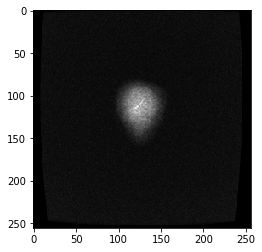

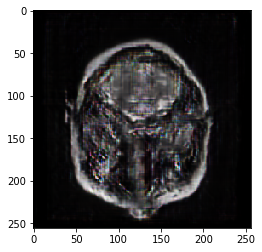

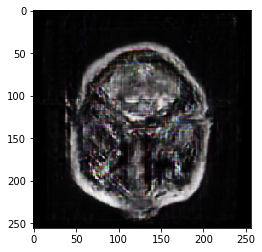

D Real: 0.73027945, D Fake: 0.27544296, G All: 1.8854644
D Real: 0.19978148, D Fake: 0.6814057, G All: 2.382435
D Real: 0.11461824, D Fake: 0.33400002, G All: 2.041819
D Real: 0.05277669, D Fake: 0.4105875, G All: 1.9509722
D Real: 0.36342025, D Fake: 0.122604616, G All: 2.878769
D Real: 0.8441858, D Fake: 0.4772069, G All: 3.3247862
D Real: 0.4735324, D Fake: 0.13365579, G All: 2.4810271
D Real: 0.84572935, D Fake: 0.17702761, G All: 2.2024705
D Real: 0.1116857, D Fake: 0.12015429, G All: 1.5158263
D Real: 0.46090484, D Fake: 0.6625678, G All: 1.4816238
D Real: 0.45371357, D Fake: 0.48692626, G All: 2.0946252
D Real: 0.09770657, D Fake: 0.43038273, G All: 2.2489073
D Real: 0.10335579, D Fake: 0.102549955, G All: 3.2825966
D Real: 0.34203178, D Fake: 0.478204, G All: 2.8775063
D Real: 0.696198, D Fake: 0.1641143, G All: 3.2376976
D Real: 1.0217104, D Fake: 0.19167382, G All: 2.4979358
D Real: 0.054474752, D Fake: 0.2498179, G All: 2.1299906
D Real: 0.32613796, D Fake: 0.37251642, G All

D Real: 0.24561729, D Fake: 0.15148684, G All: 2.2778368
D Real: 0.4324599, D Fake: 0.17468865, G All: 2.501968
D Real: 0.30149192, D Fake: 0.35129523, G All: 2.217234
D Real: 0.18561122, D Fake: 0.28348964, G All: 1.9669199
D Real: 0.060029082, D Fake: 0.12176351, G All: 2.298669
D Real: 0.20980796, D Fake: 0.22247288, G All: 2.6989136
D Real: 0.037562117, D Fake: 0.46112317, G All: 3.7251866
D Real: 0.064154804, D Fake: 0.049156614, G All: 2.1989498
D Real: 0.83298504, D Fake: 0.22751945, G All: 2.2246192
D Real: 0.11915232, D Fake: 0.25310016, G All: 2.2846832
D Real: 0.4974988, D Fake: 0.33046803, G All: 2.063961
D Real: 0.50468236, D Fake: 0.4715023, G All: 2.1433926
D Real: 0.42031395, D Fake: 0.14210422, G All: 2.2262027
D Real: 0.9858669, D Fake: 0.50070786, G All: 2.0610924
D Real: 0.068983175, D Fake: 0.39502877, G All: 1.5165447
D Real: 0.057871647, D Fake: 0.4872777, G All: 2.3330107
D Real: 0.27032143, D Fake: 0.06631062, G All: 3.0648513
D Real: 0.27214673, D Fake: 0.0607

D Real: 0.050629728, D Fake: 0.59363365, G All: 2.1153457
D Real: 0.17758848, D Fake: 0.4245381, G All: 3.1678069
D Real: 0.466249, D Fake: 0.13247445, G All: 3.1366665
D Real: 0.9801699, D Fake: 0.2604672, G All: 2.663843
D Real: 0.31660098, D Fake: 0.12680879, G All: 2.176103
D Real: 0.08609579, D Fake: 0.47644046, G All: 1.4875525
D Real: 0.263884, D Fake: 0.34296638, G All: 2.368226
D Real: 0.37962657, D Fake: 0.25060052, G All: 2.2203393
D Real: 0.21784995, D Fake: 0.22185184, G All: 2.3416166
D Real: 0.40888876, D Fake: 0.21136945, G All: 2.4139428
D Real: 0.07770313, D Fake: 0.31447113, G All: 3.081031
D Real: 0.47477657, D Fake: 0.15814003, G All: 3.426956
D Real: 0.87638044, D Fake: 0.15112135, G All: 2.8107207
D Real: 0.34764448, D Fake: 0.73922396, G All: 2.9431384
D Real: 0.35460672, D Fake: 0.12935759, G All: 2.4209766
D Real: 0.13476978, D Fake: 0.42310345, G All: 2.566017
D Real: 0.46596065, D Fake: 0.08637671, G All: 2.9533448
D Real: 0.5465883, D Fake: 0.08157945, G Al

D Real: 0.46460053, D Fake: 0.3593064, G All: 3.0482054
D Real: 0.09418732, D Fake: 0.43951482, G All: 2.765786
D Real: 0.35223526, D Fake: 0.33647346, G All: 3.2741566
D Real: 0.16688484, D Fake: 0.20239532, G All: 3.5679264
D Real: 0.70587736, D Fake: 0.08994126, G All: 3.4162002
D Real: 1.2535193, D Fake: 0.27986586, G All: 2.800168
D Real: 0.10226576, D Fake: 0.12557921, G All: 1.7235894
D Real: 0.05183299, D Fake: 0.32830483, G All: 1.8037522
D Real: 0.21318626, D Fake: 0.55732536, G All: 2.6049032
D Real: 0.12147938, D Fake: 0.74100465, G All: 2.1895409
D Real: 0.58506674, D Fake: 0.18679976, G All: 2.7602901
D Real: 0.7507786, D Fake: 0.3286476, G All: 2.2936308
D Real: 0.1638506, D Fake: 0.053905465, G All: 2.933044
D Real: 0.39630508, D Fake: 0.078674145, G All: 2.9966683
D Real: 0.7267102, D Fake: 0.16873287, G All: 2.4038901
D Real: 0.21217355, D Fake: 0.34698746, G All: 1.8844745
D Real: 0.34627438, D Fake: 0.28734255, G All: 2.269686
D Real: 0.07078767, D Fake: 0.5721965, 

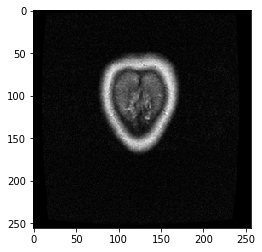

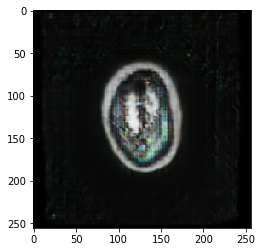

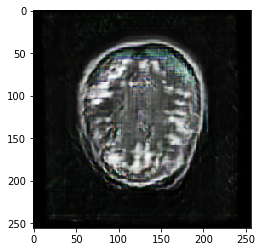

D Real: 0.085875735, D Fake: 0.06765402, G All: 2.7224877
D Real: 0.056128573, D Fake: 0.2709527, G All: 2.886673
D Real: 0.28930932, D Fake: 0.1752348, G All: 1.8338453
D Real: 0.098265275, D Fake: 0.2286748, G All: 1.6831994
D Real: 0.20944418, D Fake: 0.16837317, G All: 1.9223275
D Real: 0.085249625, D Fake: 0.21075691, G All: 2.041643
D Real: 0.08910523, D Fake: 0.4458567, G All: 2.3247917
D Real: 0.07291908, D Fake: 0.2990052, G All: 3.0158978
D Real: 0.42360127, D Fake: 0.22009219, G All: 3.5554323
D Real: 0.6308476, D Fake: 0.123542994, G All: 2.984681
D Real: 0.19027096, D Fake: 0.04447551, G All: 3.5911436
D Real: 0.40252328, D Fake: 0.24381448, G All: 2.3602228
D Real: 0.15283924, D Fake: 0.55192363, G All: 1.9806486
D Real: 0.11994028, D Fake: 0.38443422, G All: 1.7061902
D Real: 0.05280306, D Fake: 0.072965786, G All: 2.8697305
D Real: 0.11379631, D Fake: 0.060093433, G All: 3.370685
D Real: 0.049577124, D Fake: 0.08197467, G All: 2.9454975
D Real: 0.0523333, D Fake: 0.0385

D Real: 0.30561477, D Fake: 0.23817351, G All: 2.390097
D Real: 0.56621957, D Fake: 0.16111565, G All: 2.918213
D Real: 0.08141081, D Fake: 0.30634576, G All: 3.6242614
D Real: 0.18427056, D Fake: 0.075522274, G All: 2.8819442
D Real: 0.06751831, D Fake: 0.1836094, G All: 3.004786
D Real: 0.2116631, D Fake: 0.2700067, G All: 3.7104077
D Real: 0.43363196, D Fake: 0.14410454, G All: 3.409731
D Real: 0.5017942, D Fake: 0.21321037, G All: 3.4220352
D Real: 0.13706654, D Fake: 0.31322035, G All: 2.3574543
D Real: 0.6445729, D Fake: 0.06943761, G All: 2.8230453
D Real: 0.55184114, D Fake: 0.36204994, G All: 2.0242014
D Real: 0.05755136, D Fake: 1.0563955, G All: 1.6808664
D Real: 0.11540501, D Fake: 0.30944738, G All: 2.9464064
D Real: 0.49774164, D Fake: 0.07038342, G All: 4.4144144
D Real: 0.63969934, D Fake: 0.11493398, G All: 3.7295537
D Real: 0.2605106, D Fake: 0.09471554, G All: 3.2419338
D Real: 0.047564924, D Fake: 0.34193546, G All: 3.7183273
D Real: 0.095358394, D Fake: 0.1306833, 

D Real: 0.15696588, D Fake: 0.25637335, G All: 2.7384202
D Real: 0.27235568, D Fake: 0.2846151, G All: 3.343054
D Real: 0.25677264, D Fake: 0.13521625, G All: 2.3495464
D Real: 0.22814602, D Fake: 0.7279908, G All: 3.2891836
D Real: 0.218999, D Fake: 0.67675024, G All: 2.9955115
D Real: 0.8316835, D Fake: 0.109691754, G All: 2.2140803
D Real: 0.12433399, D Fake: 0.18234792, G All: 3.0884542
D Real: 0.1947447, D Fake: 0.1822663, G All: 3.0548606
D Real: 0.11512513, D Fake: 0.29475963, G All: 3.4632547
D Real: 0.5891339, D Fake: 0.17707175, G All: 2.8007243
D Real: 0.12754603, D Fake: 0.22276276, G All: 3.4667072
D Real: 0.26349908, D Fake: 0.1975366, G All: 2.6979032
D Real: 0.24850571, D Fake: 0.23117906, G All: 2.029233
D Real: 0.07744162, D Fake: 0.32874972, G All: 1.6969442
D Real: 0.4472216, D Fake: 0.40555775, G All: 2.2937412
D Real: 0.12368707, D Fake: 0.3645035, G All: 2.725761
D Real: 0.10397175, D Fake: 0.16394731, G All: 3.3287096
D Real: 0.49339306, D Fake: 0.23225646, G Al

D Real: 0.046031073, D Fake: 0.059140168, G All: 4.238846
D Real: 1.2271855, D Fake: 0.33595628, G All: 3.605482
D Real: 0.7750402, D Fake: 0.46878487, G All: 3.017445
D Real: 0.46917254, D Fake: 0.22726253, G All: 2.4273567
D Real: 0.087616384, D Fake: 0.14850815, G All: 2.506559
D Real: 0.049316835, D Fake: 0.2399692, G All: 1.5520303
D Real: 0.049326304, D Fake: 0.46877283, G All: 2.6523714
D Real: 0.16863701, D Fake: 0.34835398, G All: 2.7505283
D Real: 0.22164614, D Fake: 0.16874589, G All: 3.9781072
D Real: 1.3753471, D Fake: 0.06237506, G All: 2.8783817
D Real: 0.16884017, D Fake: 0.34041125, G All: 3.2146382
D Real: 0.33318818, D Fake: 0.2915376, G All: 2.6794868
D Real: 1.2479203, D Fake: 0.87548673, G All: 2.138121
D Real: 0.2060256, D Fake: 0.61765003, G All: 1.617481
D Real: 0.0825336, D Fake: 1.0215429, G All: 2.2085042
D Real: 0.26040846, D Fake: 0.19504416, G All: 2.1286955
D Real: 0.04702962, D Fake: 0.307709, G All: 3.214596
D Real: 0.5808859, D Fake: 0.070787415, G Al

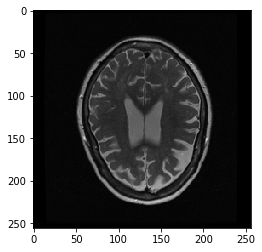

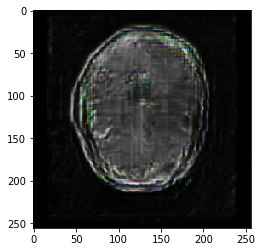

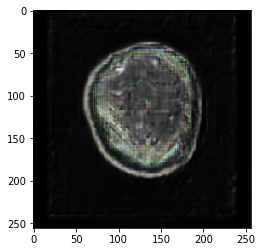

D Real: 0.07924503, D Fake: 0.07586855, G All: 2.6641188
D Real: 0.14774916, D Fake: 0.29489386, G All: 2.4650142
D Real: 0.0604505, D Fake: 0.20424348, G All: 4.0951443
D Real: 0.078986004, D Fake: 0.39865205, G All: 3.1450272
D Real: 0.06472762, D Fake: 0.055102907, G All: 4.08117
D Real: 0.95425373, D Fake: 0.035164833, G All: 3.9968553
D Real: 0.5200433, D Fake: 0.1652211, G All: 2.7607312
D Real: 0.18820678, D Fake: 0.13627598, G All: 1.5877216
D Real: 0.17837253, D Fake: 0.10181559, G All: 1.7186097
D Real: 0.063375354, D Fake: 0.49796665, G All: 1.5736802
D Real: 0.25515395, D Fake: 0.93284035, G All: 3.211563
D Real: 0.040513903, D Fake: 0.0686841, G All: 3.0227606
D Real: 0.2551856, D Fake: 0.06386051, G All: 3.4965425
D Real: 0.11135813, D Fake: 0.223055, G All: 3.2340593
D Real: 0.13795166, D Fake: 0.15286733, G All: 3.669773
D Real: 0.9006605, D Fake: 0.08840832, G All: 4.619582
D Real: 0.9289856, D Fake: 0.11516392, G All: 2.3833456
D Real: 0.34879822, D Fake: 0.26540777, 

D Real: 0.30576938, D Fake: 0.20822524, G All: 3.7878456
D Real: 0.592359, D Fake: 0.23605052, G All: 3.5740824
D Real: 1.0046192, D Fake: 0.07508054, G All: 3.196279
D Real: 0.12235544, D Fake: 0.14436704, G All: 3.063353
D Real: 0.61909276, D Fake: 0.33929196, G All: 2.5620427
D Real: 0.16711465, D Fake: 0.6820296, G All: 2.5911744
D Real: 0.3898, D Fake: 0.12002826, G All: 2.474165
D Real: 0.77116203, D Fake: 0.7994788, G All: 2.5318897
D Real: 0.38022158, D Fake: 0.47552162, G All: 1.8860267
D Real: 0.3828395, D Fake: 0.21203771, G All: 1.5344791
D Real: 0.15120643, D Fake: 0.64396214, G All: 2.303965
D Real: 0.15791029, D Fake: 0.36885172, G All: 2.8899672
D Real: 0.5631319, D Fake: 0.5818012, G All: 2.2066717
D Real: 1.2282618, D Fake: 0.1367466, G All: 2.7489934
D Real: 0.45528832, D Fake: 0.36269936, G All: 2.5110874
D Real: 0.24261668, D Fake: 0.21114227, G All: 2.1647482
D Real: 0.0420719, D Fake: 0.8129538, G All: 1.2159047
D Real: 0.20625235, D Fake: 0.18935478, G All: 2.09

D Real: 0.23911458, D Fake: 0.30765486, G All: 2.2313488
D Real: 0.20648852, D Fake: 0.68046093, G All: 1.6213382
D Real: 0.060572088, D Fake: 0.5793266, G All: 1.9190991
D Real: 0.32474846, D Fake: 0.14023477, G All: 3.2012267
D Real: 1.3824062, D Fake: 0.06322119, G All: 3.029652
D Real: 0.49309123, D Fake: 0.18568672, G All: 2.4885385
D Real: 1.0947042, D Fake: 0.21192671, G All: 3.093224
D Real: 0.24393569, D Fake: 0.23008989, G All: 1.9653202
D Real: 0.049231075, D Fake: 1.1048497, G All: 1.8889819
D Real: 0.17199598, D Fake: 0.38705233, G All: 2.4332438
D Real: 0.2898323, D Fake: 0.31179762, G All: 3.4700105
D Real: 0.08336234, D Fake: 0.06645641, G All: 3.7017267
D Real: 0.07062496, D Fake: 0.054164656, G All: 4.4247427
D Real: 0.30957088, D Fake: 0.035129733, G All: 3.9623055
D Real: 0.729077, D Fake: 0.07172659, G All: 3.0696907
D Real: 0.42990866, D Fake: 0.16422385, G All: 3.2186046
D Real: 0.17052163, D Fake: 0.2454315, G All: 2.2698226
D Real: 0.10903223, D Fake: 0.4185673

D Real: 0.027315198, D Fake: 0.6541249, G All: 1.805188
D Real: 0.12501633, D Fake: 0.15454444, G All: 2.4601638
D Real: 0.17488149, D Fake: 0.2548156, G All: 2.0176969
D Real: 0.21723153, D Fake: 0.10069336, G All: 3.3379745
D Real: 0.5471655, D Fake: 0.4455071, G All: 1.9104962
D Real: 0.539441, D Fake: 0.6588355, G All: 2.0671601
D Real: 0.5107192, D Fake: 0.68045664, G All: 2.2759745
D Real: 0.09964952, D Fake: 0.125167, G All: 2.0572615
D Real: 0.04794786, D Fake: 0.37638646, G All: 1.9199231
D Real: 0.15562557, D Fake: 0.3472184, G All: 2.7028239
D Real: 0.09295088, D Fake: 0.13216856, G All: 2.9048717
D Real: 0.15664116, D Fake: 0.08360563, G All: 3.542052
D Real: 0.9651804, D Fake: 0.18352523, G All: 3.9715426
D Real: 0.53708494, D Fake: 0.23999679, G All: 3.2191887
D Real: 0.67001563, D Fake: 0.22973502, G All: 2.3543406
D Real: 0.36970946, D Fake: 0.31865448, G All: 2.1008759
D Real: 0.123494364, D Fake: 0.48325253, G All: 1.2664769
D Real: 0.044322062, D Fake: 0.31970745, G 

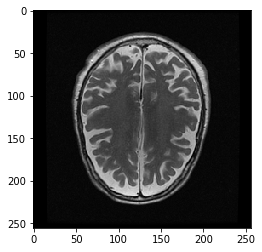

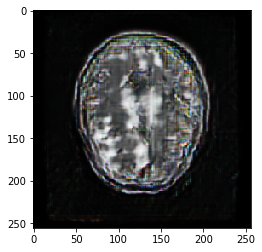

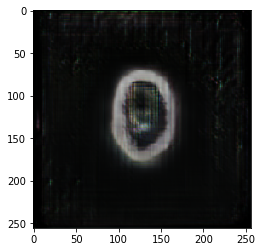

D Real: 0.13966182, D Fake: 0.67578274, G All: 2.905599
D Real: 1.1415753, D Fake: 0.090615965, G All: 2.9942985
D Real: 0.3187511, D Fake: 0.32883665, G All: 2.2150712
D Real: 0.20318222, D Fake: 0.52085376, G All: 3.3641424
D Real: 0.38239372, D Fake: 0.18871555, G All: 2.633412
D Real: 0.10923644, D Fake: 0.6098335, G All: 2.1724675
D Real: 0.46456775, D Fake: 0.108212486, G All: 1.9933975
D Real: 0.17419326, D Fake: 0.16333097, G All: 2.212132
D Real: 0.9171535, D Fake: 0.802244, G All: 2.1781282
D Real: 0.51247245, D Fake: 0.3669517, G All: 1.8288096
D Real: 0.2425533, D Fake: 0.22742805, G All: 2.1140447
D Real: 0.26010662, D Fake: 0.82085, G All: 1.7967353
D Real: 0.04692586, D Fake: 0.56287575, G All: 2.7253547
D Real: 0.18082345, D Fake: 0.15762445, G All: 2.937355
D Real: 0.49494463, D Fake: 0.11451393, G All: 3.3393633
D Real: 0.8591938, D Fake: 0.08649445, G All: 3.1013885
D Real: 0.28877372, D Fake: 0.2701877, G All: 2.701342
D Real: 0.25569546, D Fake: 0.21322367, G All: 

D Real: 0.2362089, D Fake: 0.26238322, G All: 3.0548348
D Real: 0.05255451, D Fake: 0.09966689, G All: 2.5017123
D Real: 0.091999575, D Fake: 0.09585037, G All: 2.6953628
D Real: 0.40257335, D Fake: 0.11625037, G All: 3.0990257
D Real: 0.4215529, D Fake: 0.12815048, G All: 1.7380006
D Real: 0.8278029, D Fake: 0.13773993, G All: 2.4624643
D Real: 0.21391393, D Fake: 0.40988737, G All: 1.1281902
D Real: 0.14049932, D Fake: 1.3867472, G All: 1.3082211
D Real: 0.14559582, D Fake: 0.15629512, G All: 2.1971028
D Real: 0.04448112, D Fake: 0.343492, G All: 2.5778997
D Real: 0.659486, D Fake: 0.42879274, G All: 3.0260942
D Real: 0.3364058, D Fake: 0.33339804, G All: 3.110786
D Real: 0.6446537, D Fake: 0.19227016, G All: 3.3859074
D Real: 0.53890234, D Fake: 0.32629222, G All: 2.8605883
D Real: 0.15575755, D Fake: 0.1482171, G All: 2.052403
D Real: 0.16076034, D Fake: 0.3907172, G All: 1.9607718
D Real: 0.39494103, D Fake: 0.67403287, G All: 2.039158
D Real: 0.23751104, D Fake: 0.48873734, G All

D Real: 0.4974755, D Fake: 0.09701893, G All: 2.299954
D Real: 0.47884148, D Fake: 0.7122843, G All: 2.1982458
D Real: 0.872308, D Fake: 0.40313923, G All: 1.8091245
D Real: 0.37791952, D Fake: 0.23484775, G All: 1.5198293
D Real: 0.056764156, D Fake: 0.20000687, G All: 2.2377396
D Real: 0.047519553, D Fake: 0.30934274, G All: 2.5750537
D Real: 0.3253573, D Fake: 0.3525548, G All: 2.5734286
D Real: 0.124110445, D Fake: 0.08144805, G All: 3.5124345
D Real: 0.52012557, D Fake: 0.13057084, G All: 3.0849404
D Real: 0.31712246, D Fake: 0.27987844, G All: 1.849016
D Real: 0.5232404, D Fake: 0.21625827, G All: 2.060142
D Real: 0.27954617, D Fake: 0.3504845, G All: 1.945628
D Real: 0.2485635, D Fake: 0.4697461, G All: 2.0027456
D Real: 0.41351128, D Fake: 0.2237503, G All: 2.4592972
D Real: 0.117438644, D Fake: 0.23352292, G All: 2.671396
D Real: 0.09374123, D Fake: 0.29245025, G All: 2.3683136
D Real: 0.21305066, D Fake: 0.28821024, G All: 3.286569
D Real: 0.18402244, D Fake: 0.25240108, G Al

D Real: 0.49152148, D Fake: 0.056063164, G All: 3.2856317
D Real: 0.11295539, D Fake: 0.07555196, G All: 3.26205
D Real: 0.64714193, D Fake: 0.13915735, G All: 2.8652477
D Real: 0.9594823, D Fake: 0.098398715, G All: 1.9101763
D Real: 0.24063143, D Fake: 0.3607775, G All: 1.6364243
D Real: 0.1221803, D Fake: 0.27805373, G All: 1.3085128
D Real: 0.047103547, D Fake: 0.570467, G All: 1.558083
D Real: 0.09638312, D Fake: 0.2925533, G All: 1.5918393
D Real: 0.037121195, D Fake: 0.28665155, G All: 2.4701192
D Real: 0.15546955, D Fake: 0.3559707, G All: 2.84126
D Real: 0.09041251, D Fake: 0.08784273, G All: 3.4509852
D Real: 0.15935381, D Fake: 0.13190828, G All: 4.3892765
D Real: 0.042339966, D Fake: 0.03934627, G All: 5.700837
D Real: 0.26850173, D Fake: 0.040189467, G All: 4.722435
D Real: 0.30051246, D Fake: 0.06650642, G All: 4.8777475
D Real: 0.666568, D Fake: 0.06733474, G All: 4.0949883
D Real: 0.14951633, D Fake: 0.08628313, G All: 3.209556
D Real: 0.30929375, D Fake: 0.16370562, G 

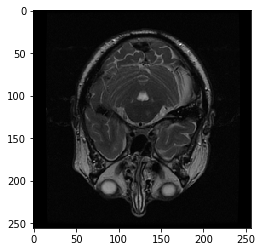

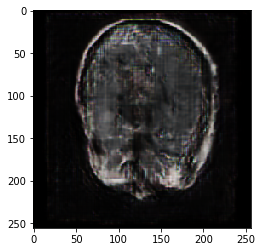

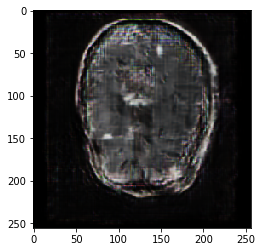

D Real: 0.051260512, D Fake: 0.11187039, G All: 3.6064744
D Real: 0.21161988, D Fake: 0.06934136, G All: 4.2744713
D Real: 0.32896763, D Fake: 0.050121404, G All: 4.4410906
D Real: 1.5979036, D Fake: 0.06835025, G All: 3.8849654
D Real: 0.5247692, D Fake: 0.05132653, G All: 2.4188185
D Real: 0.21851364, D Fake: 0.3117244, G All: 2.116888
D Real: 0.036770307, D Fake: 0.37859073, G All: 2.2917976
D Real: 0.051402725, D Fake: 0.23412836, G All: 1.8811501
D Real: 0.043217875, D Fake: 0.2090455, G All: 2.9493287
D Real: 0.061317228, D Fake: 0.29880825, G All: 3.0858407
D Real: 0.30730215, D Fake: 0.10580037, G All: 3.1646132
D Real: 0.1904752, D Fake: 0.18632197, G All: 3.4514434
D Real: 0.29651913, D Fake: 0.067686304, G All: 3.9248574
D Real: 0.028074933, D Fake: 0.058543984, G All: 3.341758
D Real: 0.057163578, D Fake: 0.4753942, G All: 4.237098
D Real: 0.104423985, D Fake: 0.048011836, G All: 3.8946936
D Real: 0.28186333, D Fake: 0.06353779, G All: 4.042055
D Real: 0.5213893, D Fake: 0.

D Real: 0.20783731, D Fake: 0.34791386, G All: 2.64144
D Real: 0.04308305, D Fake: 0.3827307, G All: 2.6070795
D Real: 0.32175612, D Fake: 0.16274354, G All: 2.1676862
D Real: 0.060182758, D Fake: 0.29811573, G All: 2.656577
D Real: 0.5534369, D Fake: 0.16155177, G All: 2.8804026
D Real: 0.1524577, D Fake: 0.1737406, G All: 2.115167
D Real: 0.858876, D Fake: 0.18492866, G All: 2.7543252
D Real: 0.2295034, D Fake: 0.37295207, G All: 1.6493146
D Real: 0.5019049, D Fake: 0.27442423, G All: 2.079487
D Real: 0.33158457, D Fake: 0.7166134, G All: 2.1571136
D Real: 0.05732699, D Fake: 0.10064477, G All: 2.4831593
D Real: 0.9075671, D Fake: 0.41967303, G All: 1.8665863
D Real: 0.46596977, D Fake: 0.24774297, G All: 1.5494943
D Real: 0.6358646, D Fake: 0.7322741, G All: 1.726572
D Real: 0.17748404, D Fake: 0.13052955, G All: 1.875191
D Real: 0.05216908, D Fake: 0.30117777, G All: 2.4091249
D Real: 0.20690463, D Fake: 0.65229887, G All: 2.509427
D Real: 0.052098338, D Fake: 0.16357628, G All: 2.

D Real: 1.0829476, D Fake: 0.23872137, G All: 3.5506186
D Real: 0.5129193, D Fake: 0.07918801, G All: 1.9364264
D Real: 0.81907886, D Fake: 0.1963365, G All: 1.8013679
D Real: 0.35779172, D Fake: 0.49415576, G All: 1.3047394
D Real: 0.0794445, D Fake: 0.6384457, G All: 0.559043
D Real: 0.050548244, D Fake: 0.84757143, G All: 1.5267305
D Real: 0.43098998, D Fake: 0.38801062, G All: 1.4734237
D Real: 0.247785, D Fake: 0.5077634, G All: 3.3142738
D Real: 0.22368857, D Fake: 0.1351304, G All: 3.7243242
D Real: 0.20884053, D Fake: 0.22951478, G All: 4.5783806
D Real: 0.8577137, D Fake: 0.16105565, G All: 4.3347683
D Real: 1.2516402, D Fake: 0.07848705, G All: 3.2500556
D Real: 0.5181067, D Fake: 0.17475872, G All: 2.9938593
D Real: 0.38397795, D Fake: 0.50520176, G All: 1.3834226
D Real: 0.047571734, D Fake: 1.4065259, G All: 1.320273
D Real: 0.09270656, D Fake: 0.23148279, G All: 2.0818458
D Real: 0.69625, D Fake: 0.20744339, G All: 1.9277481
D Real: 0.06297673, D Fake: 0.23896503, G All: 

D Real: 0.9234657, D Fake: 0.56738424, G All: 1.9107121
D Real: 0.09330268, D Fake: 0.180241, G All: 2.2154984
D Real: 0.09812836, D Fake: 0.2376028, G All: 3.2625344
D Real: 0.058878943, D Fake: 0.5175095, G All: 3.8243105
D Real: 0.21810925, D Fake: 0.13096596, G All: 3.8932414
D Real: 0.31729835, D Fake: 0.119881995, G All: 3.7353768
D Real: 0.36944482, D Fake: 0.110560656, G All: 2.8949976
D Real: 0.08361984, D Fake: 0.2650962, G All: 2.7242875
D Real: 0.32742703, D Fake: 0.044046313, G All: 2.8544216
D Real: 0.050856106, D Fake: 0.09456058, G All: 3.5078187
D Real: 0.09775998, D Fake: 0.1958313, G All: 2.9135618
D Real: 0.14057006, D Fake: 0.2572258, G All: 2.5292664
D Real: 0.9005619, D Fake: 0.12654918, G All: 3.0114524
D Real: 0.19533594, D Fake: 0.17849362, G All: 2.3694625
D Real: 0.50994134, D Fake: 0.24258411, G All: 2.3812876
D Real: 0.22039196, D Fake: 0.2630445, G All: 1.9248949
D Real: 0.15209308, D Fake: 0.64861345, G All: 2.022976
D Real: 0.11907206, D Fake: 0.2730259

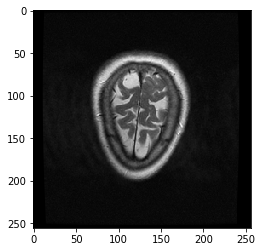

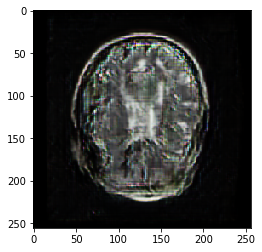

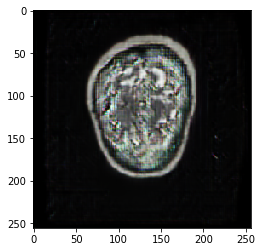

D Real: 0.2640775, D Fake: 0.08755721, G All: 4.0935607
D Real: 0.06181977, D Fake: 0.13757113, G All: 3.4142637
D Real: 0.069522075, D Fake: 0.15810099, G All: 3.2785845
D Real: 0.220828, D Fake: 0.07315344, G All: 3.0038104
D Real: 0.23263782, D Fake: 0.12014748, G All: 2.5083084
D Real: 0.25387797, D Fake: 0.44450077, G All: 2.9728088
D Real: 0.30475992, D Fake: 0.2640993, G All: 3.0942316
D Real: 0.43160653, D Fake: 0.1622852, G All: 2.5218787
D Real: 0.05890566, D Fake: 0.35687345, G All: 2.3656888
D Real: 0.5477155, D Fake: 0.156315, G All: 3.1758728
D Real: 0.16584454, D Fake: 0.4452343, G All: 2.9569275
D Real: 0.33360523, D Fake: 0.5811997, G All: 2.6522956
D Real: 0.12896708, D Fake: 0.06806632, G All: 2.9394248
D Real: 0.35749757, D Fake: 0.1516948, G All: 3.1570003
D Real: 0.5388657, D Fake: 0.08902161, G All: 2.7668705
D Real: 0.7638576, D Fake: 0.11451116, G All: 1.9155805
D Real: 0.044165336, D Fake: 1.1224282, G All: 1.8844362
D Real: 0.05868885, D Fake: 0.52042043, G A

D Real: 0.037620336, D Fake: 0.4816197, G All: 1.933015
D Real: 0.05676955, D Fake: 0.106738806, G All: 2.1535776
D Real: 0.07419141, D Fake: 0.12334495, G All: 3.0723653
D Real: 0.36490637, D Fake: 0.12577102, G All: 3.086088
D Real: 0.04456729, D Fake: 0.09455714, G All: 3.8904486
D Real: 0.090491, D Fake: 0.6281695, G All: 3.439104
D Real: 0.21405053, D Fake: 0.08821746, G All: 4.3752546
D Real: 0.13360313, D Fake: 0.049299534, G All: 4.6105638
D Real: 0.06641028, D Fake: 0.029421924, G All: 3.7316782
D Real: 0.3399052, D Fake: 0.041896835, G All: 3.3807364
D Real: 0.16585693, D Fake: 0.30754608, G All: 3.5694866
D Real: 0.074066915, D Fake: 0.07684997, G All: 2.4975326
D Real: 0.075843826, D Fake: 0.19166711, G All: 2.5085049
D Real: 0.28756616, D Fake: 0.22068727, G All: 2.8604107
D Real: 0.05069789, D Fake: 0.33168745, G All: 2.867352
D Real: 0.12975295, D Fake: 0.37749833, G All: 2.5612226
D Real: 0.11178684, D Fake: 0.19669425, G All: 2.322989
D Real: 0.15598835, D Fake: 0.2412

D Real: 0.27596146, D Fake: 0.4506478, G All: 2.7811368
D Real: 0.29917318, D Fake: 0.27348995, G All: 1.7843654
D Real: 0.46620762, D Fake: 0.9863229, G All: 2.0450656
D Real: 0.6564092, D Fake: 0.5728749, G All: 1.8715045
D Real: 0.038349688, D Fake: 0.17659509, G All: 2.0103943
D Real: 0.22219466, D Fake: 0.069919415, G All: 2.9769702
D Real: 1.0464652, D Fake: 0.37982392, G All: 2.3267698
D Real: 0.089041695, D Fake: 0.16904354, G All: 2.4496722
D Real: 0.2363365, D Fake: 0.6484736, G All: 2.4463167
D Real: 0.48520184, D Fake: 0.6182271, G All: 1.8820862
D Real: 0.25100988, D Fake: 0.6242764, G All: 2.769006
D Real: 0.45908898, D Fake: 0.1880576, G All: 3.4249406
D Real: 0.120893136, D Fake: 0.04009017, G All: 3.565827
D Real: 0.72100645, D Fake: 0.09375918, G All: 3.2843058
D Real: 1.0310197, D Fake: 0.17042169, G All: 1.8817227
D Real: 0.1406506, D Fake: 0.5072225, G All: 1.5348568
D Real: 0.02095171, D Fake: 0.35930037, G All: 1.5124805
D Real: 0.14012142, D Fake: 0.82895494, G 

D Real: 0.63950646, D Fake: 0.227529, G All: 2.3456514
D Real: 0.5726063, D Fake: 0.19032499, G All: 1.7257638
D Real: 0.5052811, D Fake: 0.39587882, G All: 2.2101932
D Real: 0.08030462, D Fake: 0.77837026, G All: 2.4185162
D Real: 0.20306858, D Fake: 0.29954126, G All: 2.4730496
D Real: 0.34171253, D Fake: 0.26384157, G All: 3.4052262
D Real: 1.6333469, D Fake: 0.5006722, G All: 3.2359962
D Real: 0.06890872, D Fake: 0.29943645, G All: 1.8611765
D Real: 0.41246784, D Fake: 0.17234685, G All: 3.4603386
D Real: 0.5189135, D Fake: 0.69760156, G All: 1.9747303
D Real: 0.26149806, D Fake: 0.30096006, G All: 3.2366025
D Real: 0.25466627, D Fake: 0.17382437, G All: 2.8919368
D Real: 1.0676289, D Fake: 0.19958818, G All: 3.7431788
D Real: 0.4533761, D Fake: 0.23968184, G All: 2.438297
D Real: 0.2973857, D Fake: 0.47786033, G All: 3.316319
D Real: 0.23373307, D Fake: 0.24150199, G All: 3.5271935
D Real: 0.067222215, D Fake: 0.25416714, G All: 3.5006871
D Real: 0.2819683, D Fake: 0.1536639, G Al

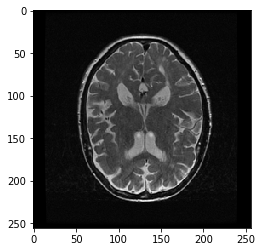

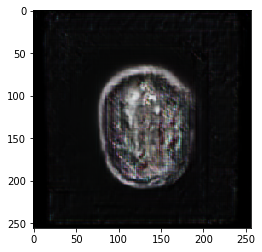

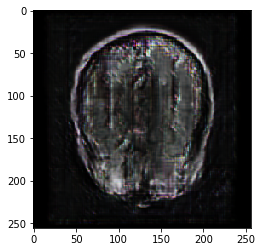

D Real: 0.22353521, D Fake: 0.2115464, G All: 2.8676748
D Real: 0.08975227, D Fake: 0.20981945, G All: 2.2272303
D Real: 0.13645406, D Fake: 0.36143124, G All: 2.4559226
D Real: 0.26978806, D Fake: 0.54895014, G All: 2.5522623
D Real: 0.12130363, D Fake: 0.11782376, G All: 2.8987904
D Real: 0.52202, D Fake: 0.15692812, G All: 3.2577167
D Real: 0.0650736, D Fake: 0.11968534, G All: 2.5360749
D Real: 1.0823252, D Fake: 0.050724123, G All: 2.1465774
D Real: 0.07851056, D Fake: 0.3931955, G All: 1.6636031
D Real: 0.124757275, D Fake: 0.16905311, G All: 1.1783674
D Real: 0.22301556, D Fake: 0.67822266, G All: 1.9847239
D Real: 0.3111305, D Fake: 0.23888199, G All: 2.2398462
D Real: 0.039608378, D Fake: 0.65632975, G All: 2.6621883
D Real: 0.22671023, D Fake: 0.09510603, G All: 2.7933626
D Real: 0.41524044, D Fake: 0.11558277, G All: 3.4476342
D Real: 0.36216772, D Fake: 0.06806366, G All: 2.9751072
D Real: 0.63881624, D Fake: 0.32133386, G All: 2.2878568
D Real: 0.07672021, D Fake: 0.610888

D Real: 0.052534107, D Fake: 0.057792146, G All: 2.1571395
D Real: 0.1458482, D Fake: 0.14768526, G All: 3.0761862
D Real: 0.2966498, D Fake: 0.23706785, G All: 2.2846103
D Real: 0.0988002, D Fake: 0.21370685, G All: 3.5100088
D Real: 0.20949446, D Fake: 0.10736669, G All: 2.7882376
D Real: 0.51791537, D Fake: 0.35232204, G All: 2.4273925
D Real: 0.11465587, D Fake: 0.2769866, G All: 2.691216
D Real: 0.13920668, D Fake: 0.22996214, G All: 2.2974148
D Real: 0.08309435, D Fake: 0.07835733, G All: 2.991705
D Real: 0.2926499, D Fake: 0.22042096, G All: 3.2830749
D Real: 0.41271228, D Fake: 0.08875789, G All: 2.9270449
D Real: 0.03121517, D Fake: 0.11147381, G All: 2.4457774
D Real: 0.036185104, D Fake: 0.2783926, G All: 2.4916034
D Real: 0.21286267, D Fake: 0.041241735, G All: 2.8731008
D Real: 0.04023785, D Fake: 0.09622149, G All: 3.5240154
D Real: 0.039221488, D Fake: 0.16418423, G All: 3.69491
D Real: 1.1109904, D Fake: 0.41474035, G All: 3.3129406
D Real: 0.6539223, D Fake: 0.06653780

D Real: 0.103176355, D Fake: 0.34953642, G All: 3.2548447
D Real: 0.50055337, D Fake: 0.15874192, G All: 3.0061507
D Real: 0.18144396, D Fake: 0.12671006, G All: 3.6070304
D Real: 1.0175049, D Fake: 0.06738487, G All: 2.1718884
D Real: 0.60452414, D Fake: 0.31980032, G All: 1.3699014
D Real: 0.06229601, D Fake: 0.12580755, G All: 1.2615662
D Real: 0.13414842, D Fake: 1.3107308, G All: 1.5951912
D Real: 0.028294737, D Fake: 0.60377836, G All: 1.6942515
D Real: 0.102756485, D Fake: 0.13346937, G All: 2.8576512
D Real: 1.4088457, D Fake: 0.19961771, G All: 3.3651009
D Real: 0.4348757, D Fake: 0.15717882, G All: 2.685576
D Real: 0.24607171, D Fake: 0.066903464, G All: 3.0307655
D Real: 0.23729771, D Fake: 0.26236194, G All: 1.8650532
D Real: 0.07534101, D Fake: 0.12293003, G All: 1.8280811
D Real: 0.09799481, D Fake: 0.22650564, G All: 2.6390676
D Real: 0.11520193, D Fake: 0.1306499, G All: 2.2958612
D Real: 0.05590763, D Fake: 0.16639555, G All: 3.1672797
D Real: 1.2689912, D Fake: 0.1769

D Real: 0.42064476, D Fake: 0.17922285, G All: 2.2649558
D Real: 0.2252306, D Fake: 0.29835165, G All: 1.7526231
D Real: 0.12229727, D Fake: 0.341475, G All: 2.355391
D Real: 0.061933205, D Fake: 0.10184927, G All: 2.495722
D Real: 0.13235705, D Fake: 0.11241235, G All: 3.3937097
D Real: 0.67260456, D Fake: 0.06779307, G All: 2.282146
D Real: 0.27030504, D Fake: 0.17962083, G All: 2.1832983
D Real: 0.0674514, D Fake: 0.23849028, G All: 3.4464169
D Real: 0.25276428, D Fake: 0.86643434, G All: 3.3887296
D Real: 0.1350581, D Fake: 0.40579665, G All: 3.4344168
D Real: 0.1271096, D Fake: 0.108657494, G All: 4.3089514
D Real: 0.31249985, D Fake: 0.059724055, G All: 4.095369
D Real: 1.1524706, D Fake: 0.058409683, G All: 3.1608806
D Real: 0.44068158, D Fake: 0.14464357, G All: 1.9121672
D Real: 0.34784847, D Fake: 1.1201438, G All: 2.3671465
D Real: 0.08843263, D Fake: 0.24553458, G All: 2.3354802
D Real: 0.5487994, D Fake: 0.45003223, G All: 3.3509727
D Real: 0.0751446, D Fake: 0.23545629, G

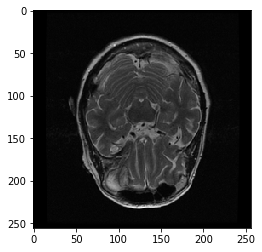

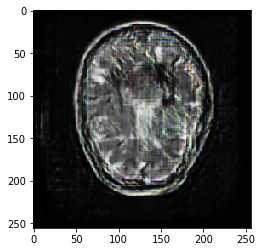

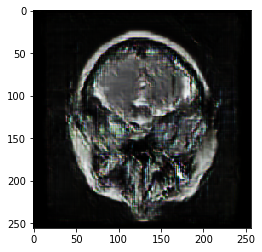

D Real: 0.56063086, D Fake: 0.57027924, G All: 2.429183
D Real: 0.59125, D Fake: 0.8170937, G All: 1.7540109
D Real: 0.057785835, D Fake: 0.77829283, G All: 2.2525501
D Real: 0.44376233, D Fake: 0.10599883, G All: 3.4513817
D Real: 0.5197675, D Fake: 0.10212939, G All: 2.4927368
D Real: 0.47607568, D Fake: 0.24237864, G All: 2.6831398
D Real: 0.18755496, D Fake: 0.33984208, G All: 1.9817019
D Real: 0.9941954, D Fake: 0.24162108, G All: 1.9266214
D Real: 0.091365024, D Fake: 0.27000406, G All: 2.2218304
D Real: 0.8007716, D Fake: 0.62957346, G All: 1.6973968
D Real: 0.050739124, D Fake: 0.2612124, G All: 1.384656
D Real: 0.0815167, D Fake: 0.63035285, G All: 1.885282
D Real: 0.2567133, D Fake: 0.2618397, G All: 2.8426256
D Real: 0.60782105, D Fake: 0.12993744, G All: 3.2378008
D Real: 0.22516692, D Fake: 0.06228567, G All: 3.499579
D Real: 0.4993128, D Fake: 0.13436335, G All: 3.6121707
D Real: 0.97984916, D Fake: 0.29161, G All: 2.1389256
D Real: 0.14722969, D Fake: 0.80046296, G All: 

D Real: 0.05160604, D Fake: 0.1891639, G All: 2.8736703
D Real: 0.25661948, D Fake: 0.19719765, G All: 2.4219966
D Real: 0.07538998, D Fake: 0.39152968, G All: 1.9792457
D Real: 0.13055083, D Fake: 0.399786, G All: 2.5157914
D Real: 0.1021659, D Fake: 0.09480201, G All: 2.2293665
D Real: 0.45651546, D Fake: 0.12639497, G All: 2.126398
D Real: 0.043550216, D Fake: 0.26455277, G All: 2.3638947
D Real: 0.089465365, D Fake: 0.09672203, G All: 2.5991855
D Real: 0.22647355, D Fake: 0.23532824, G All: 2.1738503
D Real: 0.88811046, D Fake: 0.14627938, G All: 2.318849
D Real: 0.19273867, D Fake: 0.28247523, G All: 2.033071
D Real: 0.25004256, D Fake: 1.0167186, G All: 3.3094969
D Real: 0.27925098, D Fake: 0.20754108, G All: 3.1821125
D Real: 1.7559978, D Fake: 0.0946407, G All: 3.2016783
D Real: 0.3078745, D Fake: 0.23166284, G All: 2.7736464
D Real: 0.19017574, D Fake: 0.06819047, G All: 2.9233363
D Real: 0.48202527, D Fake: 0.26542088, G All: 2.240501
D Real: 0.53212434, D Fake: 0.51333714, G

D Real: 1.8005686, D Fake: 0.3071943, G All: 2.9906006
D Real: 0.18904452, D Fake: 0.2773235, G All: 1.9855634
D Real: 0.1089206, D Fake: 0.12681076, G All: 1.4153523
D Real: 0.122783855, D Fake: 0.40603465, G All: 1.8018103
D Real: 0.041698053, D Fake: 0.5030962, G All: 2.2446468
D Real: 0.18561472, D Fake: 0.38851103, G All: 2.881102
D Real: 0.1496633, D Fake: 0.1810923, G All: 2.7305894
D Real: 0.86391544, D Fake: 0.12945125, G All: 2.9865031
D Real: 0.5535015, D Fake: 0.26394585, G All: 2.8243566
D Real: 0.07771826, D Fake: 0.18973672, G All: 2.7880275
D Real: 0.03427816, D Fake: 0.19317295, G All: 2.9463124
D Real: 0.39958638, D Fake: 0.08668805, G All: 2.4513173
D Real: 0.033057626, D Fake: 0.21421999, G All: 2.7978053
D Real: 0.05808281, D Fake: 0.3435458, G All: 2.7855887
D Real: 0.2023621, D Fake: 0.14344868, G All: 3.080497
D Real: 1.1172338, D Fake: 0.24209356, G All: 2.3751106
D Real: 0.19618303, D Fake: 0.26907507, G All: 2.361206
D Real: 0.08380471, D Fake: 0.4821256, G A

D Real: 0.1616664, D Fake: 0.27462983, G All: 1.2847598
D Real: 0.052924454, D Fake: 0.7606387, G All: 1.7681382
D Real: 0.091506734, D Fake: 0.3767292, G All: 2.2600222
D Real: 0.21569914, D Fake: 0.3306613, G All: 3.5788386
D Real: 0.116009735, D Fake: 0.08987449, G All: 4.2930117
D Real: 0.27685708, D Fake: 0.07125813, G All: 3.4069648
D Real: 0.33777744, D Fake: 0.055307575, G All: 3.720089
D Real: 0.33904004, D Fake: 0.12348727, G All: 3.5277615
D Real: 0.14666489, D Fake: 0.33615994, G All: 3.5035963
D Real: 0.25644356, D Fake: 0.120652616, G All: 2.3938465
D Real: 0.34082103, D Fake: 0.29805762, G All: 2.149165
D Real: 0.173279, D Fake: 0.16838145, G All: 1.9471353
D Real: 0.31014696, D Fake: 0.13434105, G All: 1.9046059
D Real: 0.3181433, D Fake: 0.212784, G All: 2.4267411
D Real: 0.19328421, D Fake: 0.50295687, G All: 2.0435324
D Real: 0.06560532, D Fake: 0.47518384, G All: 2.416173
D Real: 0.041675977, D Fake: 0.16442531, G All: 3.501544
D Real: 0.6155027, D Fake: 0.23822036,

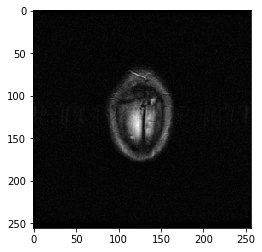

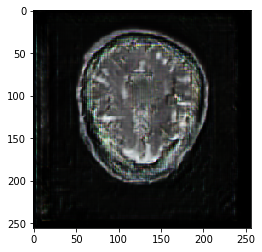

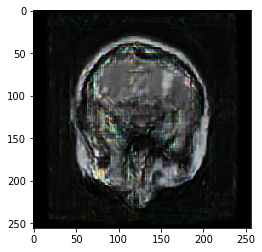

D Real: 1.1228195, D Fake: 0.4629641, G All: 3.7583196
D Real: 0.079228334, D Fake: 0.058000524, G All: 3.5461674
D Real: 0.66231, D Fake: 0.07027808, G All: 3.2297463
D Real: 0.4074545, D Fake: 0.061525088, G All: 2.4461455
D Real: 0.06617893, D Fake: 0.4596908, G All: 1.4796724
D Real: 0.046655033, D Fake: 1.113709, G All: 2.1130996
D Real: 0.04725439, D Fake: 0.38681966, G All: 2.6621509
D Real: 0.5280193, D Fake: 0.075326785, G All: 3.2151475
D Real: 0.17447293, D Fake: 0.14140527, G All: 2.6558828
D Real: 0.042731658, D Fake: 0.21231142, G All: 2.8401873
D Real: 0.13608429, D Fake: 0.054638367, G All: 2.87218
D Real: 0.27677065, D Fake: 0.60440034, G All: 3.52778
D Real: 0.20472035, D Fake: 0.30935898, G All: 3.8716908
D Real: 0.31679934, D Fake: 0.09960906, G All: 3.3986802
D Real: 0.6709905, D Fake: 0.1294528, G All: 3.569345
D Real: 0.08517079, D Fake: 0.16912349, G All: 2.4862342
D Real: 0.99968547, D Fake: 0.55145836, G All: 3.296585
D Real: 0.79665, D Fake: 0.23765786, G All

D Real: 0.55280924, D Fake: 0.09437305, G All: 3.0922956
D Real: 0.22844605, D Fake: 0.07556404, G All: 3.489359
D Real: 0.07795718, D Fake: 0.28052002, G All: 2.4203556
D Real: 0.21147577, D Fake: 0.1978141, G All: 2.5105104
D Real: 0.50325996, D Fake: 0.3733145, G All: 2.22528
D Real: 0.0434763, D Fake: 0.359713, G All: 2.5046635
D Real: 0.07020228, D Fake: 0.18993081, G All: 2.0114627
D Real: 0.40395868, D Fake: 0.24224032, G All: 3.1765568
D Real: 1.4379115, D Fake: 0.37810513, G All: 2.4639797
D Real: 0.056159124, D Fake: 0.09726313, G All: 2.4769106
D Real: 0.050683893, D Fake: 0.084502086, G All: 2.3956366
D Real: 0.063300304, D Fake: 0.41799784, G All: 2.5474007
D Real: 0.29717377, D Fake: 0.07884962, G All: 3.082829
D Real: 0.0376535, D Fake: 0.34953827, G All: 2.6980247
D Real: 0.097616434, D Fake: 0.112542234, G All: 3.341893
D Real: 0.72366524, D Fake: 0.13307226, G All: 3.2167835
D Real: 0.03781349, D Fake: 0.71288586, G All: 3.1057262
D Real: 0.06792918, D Fake: 0.0570995

D Real: 0.18725373, D Fake: 0.10790333, G All: 4.600259
D Real: 0.053822927, D Fake: 0.13231924, G All: 3.089256
D Real: 0.28215662, D Fake: 0.12233402, G All: 2.644055
D Real: 0.21695615, D Fake: 0.14974152, G All: 1.9327365
D Real: 0.600369, D Fake: 0.13416213, G All: 2.2645864
D Real: 0.16277671, D Fake: 0.4928224, G All: 1.8377492
D Real: 0.07598555, D Fake: 1.1871322, G All: 3.0416756
D Real: 0.47548768, D Fake: 0.15216719, G All: 2.7145667
D Real: 0.0983289, D Fake: 0.10165518, G All: 3.2599087
D Real: 0.037506543, D Fake: 0.19454618, G All: 3.5160422
D Real: 1.3289723, D Fake: 0.53242725, G All: 3.320784
D Real: 0.7805724, D Fake: 0.15280762, G All: 3.1220016
D Real: 0.32577637, D Fake: 0.17905232, G All: 2.965403
D Real: 0.20103955, D Fake: 0.4091193, G All: 2.0778441
D Real: 0.87897587, D Fake: 0.26460475, G All: 1.4199219
D Real: 0.30324838, D Fake: 0.72363394, G All: 1.5014001
D Real: 0.25815248, D Fake: 0.21094, G All: 2.2658353
D Real: 0.12462625, D Fake: 1.2317189, G All:

D Real: 0.09650403, D Fake: 0.1971779, G All: 1.4648476
D Real: 0.05008424, D Fake: 0.7226099, G All: 1.5628772
D Real: 0.030602027, D Fake: 0.49250764, G All: 1.3562863
D Real: 0.04717285, D Fake: 0.87607425, G All: 1.5338329
D Real: 0.15041305, D Fake: 0.36524668, G All: 2.8676014
D Real: 0.44716817, D Fake: 0.14937131, G All: 4.1307726
D Real: 0.23303649, D Fake: 0.0852267, G All: 4.3801374
D Real: 0.6955017, D Fake: 0.086772494, G All: 3.9990358
D Real: 0.70907193, D Fake: 0.09878614, G All: 4.0590267
D Real: 1.0766275, D Fake: 0.21514137, G All: 2.4175124
D Real: 0.12528677, D Fake: 0.24118483, G All: 1.6426542
D Real: 0.2433781, D Fake: 0.45003247, G All: 1.5358944
D Real: 0.037993625, D Fake: 0.28755763, G All: 1.6839427
D Real: 0.17106764, D Fake: 0.5313676, G All: 1.9293967
D Real: 0.064753085, D Fake: 0.25129744, G All: 2.0428922
D Real: 0.04605459, D Fake: 0.74066186, G All: 3.2827992
D Real: 0.16761479, D Fake: 0.16533993, G All: 4.596529
D Real: 0.73329747, D Fake: 0.04694

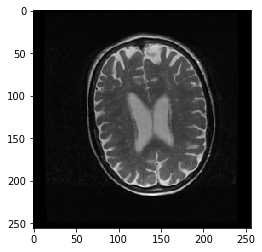

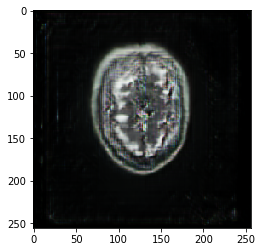

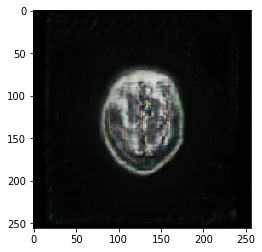

D Real: 0.09711097, D Fake: 0.92957187, G All: 1.2401363
D Real: 1.3690346, D Fake: 0.32943755, G All: 1.9312608
D Real: 0.06829288, D Fake: 0.5005064, G All: 2.037426
D Real: 0.8671286, D Fake: 0.22424182, G All: 2.53903
D Real: 0.061098486, D Fake: 0.26166645, G All: 2.940507
D Real: 0.13065921, D Fake: 0.20792302, G All: 1.835767
D Real: 2.4494655, D Fake: 0.2832578, G All: 2.5812552
D Real: 0.128636, D Fake: 0.0797714, G All: 2.3444443
D Real: 0.055846766, D Fake: 0.4590392, G All: 2.9100635
D Real: 0.3654111, D Fake: 0.28658843, G All: 3.0196772
D Real: 0.81919575, D Fake: 0.34501266, G All: 2.546239
D Real: 0.25218487, D Fake: 0.33681142, G All: 2.3624182
D Real: 0.5656562, D Fake: 0.19587165, G All: 2.3797226
D Real: 0.5949818, D Fake: 0.4151467, G All: 2.3057294
D Real: 0.24709833, D Fake: 0.39166337, G All: 2.5249436
D Real: 0.061465867, D Fake: 0.5677564, G All: 2.5684097
D Real: 0.49792922, D Fake: 0.16315679, G All: 3.0446985
D Real: 1.3789523, D Fake: 0.18310608, G All: 2.

D Real: 0.21484126, D Fake: 0.4626851, G All: 2.6178885
D Real: 0.06093612, D Fake: 0.49972183, G All: 2.06837
D Real: 0.077073105, D Fake: 0.0648736, G All: 2.874717
D Real: 0.16758741, D Fake: 0.10126575, G All: 3.4464476
D Real: 0.1337628, D Fake: 0.082325116, G All: 3.923227
D Real: 1.727412, D Fake: 0.08339737, G All: 2.5913467
D Real: 0.82004786, D Fake: 0.17851007, G All: 1.647728
D Real: 0.15175976, D Fake: 0.22718082, G All: 1.8723373
D Real: 0.12064565, D Fake: 0.73205644, G All: 1.5442551
D Real: 0.18858278, D Fake: 0.7541071, G All: 1.2634807
D Real: 0.28409857, D Fake: 0.7475147, G All: 2.1507711
D Real: 0.15025076, D Fake: 0.19697692, G All: 2.4099529
D Real: 0.6702872, D Fake: 0.30977902, G All: 2.661922
D Real: 0.24801579, D Fake: 0.26176628, G All: 2.4747934
D Real: 0.20376664, D Fake: 0.071038395, G All: 3.7299833
D Real: 1.0075327, D Fake: 0.101343155, G All: 3.382435
D Real: 0.12480073, D Fake: 0.3687677, G All: 2.8050156
D Real: 0.34373915, D Fake: 0.30886978, G Al

D Real: 0.035281457, D Fake: 0.3933652, G All: 2.4417539
D Real: 0.06625719, D Fake: 0.13286898, G All: 2.617496
D Real: 0.30966857, D Fake: 0.24062523, G All: 2.7144713
D Real: 1.1731422, D Fake: 0.17452419, G All: 2.5833874
D Real: 0.070015416, D Fake: 0.3161301, G All: 2.3807874
D Real: 0.04211211, D Fake: 0.3539045, G All: 2.2595124
D Real: 0.091354355, D Fake: 0.19894552, G All: 2.3126497
D Real: 0.25201428, D Fake: 0.2812429, G All: 2.7426367
D Real: 0.09118324, D Fake: 0.10506128, G All: 2.94951
D Real: 0.16834496, D Fake: 0.22080925, G All: 2.839221
D Real: 0.37547976, D Fake: 0.18057017, G All: 3.4206553
D Real: 0.41044873, D Fake: 0.051080734, G All: 2.792313
D Real: 0.24212103, D Fake: 0.5824444, G All: 2.930373
D Real: 0.8327476, D Fake: 0.22195995, G All: 2.3094492
D Real: 0.53921807, D Fake: 0.15616569, G All: 2.180267
D Real: 0.19866706, D Fake: 0.4068165, G All: 1.0798773
D Real: 0.07411441, D Fake: 1.0804486, G All: 2.050362
D Real: 0.13720359, D Fake: 0.22347733, G Al

D Real: 0.1709653, D Fake: 0.29647216, G All: 3.3776004
D Real: 0.53392774, D Fake: 0.22261222, G All: 3.306169
D Real: 0.056471784, D Fake: 0.31162402, G All: 3.031638
D Real: 0.20003146, D Fake: 0.09371961, G All: 2.6963768
D Real: 0.4233129, D Fake: 0.37396097, G All: 2.7527761
D Real: 0.2694403, D Fake: 0.16311738, G All: 2.6257343
D Real: 0.049657688, D Fake: 0.12600681, G All: 2.960507
D Real: 0.044999555, D Fake: 0.26386666, G All: 3.0041282
D Real: 0.0703758, D Fake: 0.1248174, G All: 2.5188458
D Real: 0.10131871, D Fake: 0.15033987, G All: 2.9948344
D Real: 0.060255863, D Fake: 0.07372662, G All: 2.9783578
D Real: 0.27451885, D Fake: 0.052897274, G All: 2.307011
D Real: 0.14514583, D Fake: 0.17616746, G All: 3.655563
D Real: 0.146, D Fake: 0.40753537, G All: 3.4153423
D Real: 0.43730462, D Fake: 0.07497288, G All: 3.9219494
D Real: 0.27739537, D Fake: 0.32258797, G All: 2.467029
D Real: 0.40112132, D Fake: 0.2924785, G All: 3.0575273
D Real: 0.71185136, D Fake: 0.11444272, G A

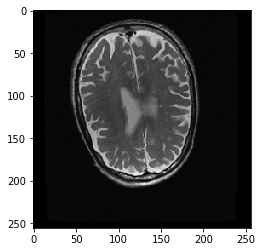

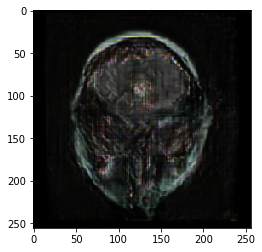

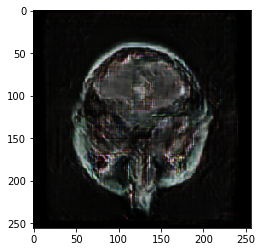

D Real: 0.20033279, D Fake: 0.10195072, G All: 3.2858226
D Real: 0.29693022, D Fake: 0.3003335, G All: 3.3067098
D Real: 0.20900303, D Fake: 0.1616153, G All: 3.997308
D Real: 0.2252696, D Fake: 0.18581459, G All: 2.6221871
D Real: 0.120125614, D Fake: 0.21201436, G All: 3.2838738
D Real: 1.1055534, D Fake: 0.24536286, G All: 3.0015526
D Real: 0.40057987, D Fake: 0.2507991, G All: 2.3917031
D Real: 0.11743738, D Fake: 0.44548535, G All: 2.08768
D Real: 0.0485167, D Fake: 0.19923212, G All: 2.7054203
D Real: 0.7475444, D Fake: 0.0945413, G All: 2.072566
D Real: 0.92038465, D Fake: 0.22669947, G All: 1.9272302
D Real: 0.07170272, D Fake: 0.18526535, G All: 1.7674384
D Real: 0.11621474, D Fake: 0.37345332, G All: 1.7156525
D Real: 0.04983446, D Fake: 0.42046744, G All: 2.1033666
D Real: 0.041172385, D Fake: 0.31433547, G All: 2.1608913
D Real: 1.2619377, D Fake: 0.30166507, G All: 2.895724
D Real: 0.7673874, D Fake: 0.24357715, G All: 2.7591028
D Real: 0.2129868, D Fake: 0.8659308, G All:

D Real: 0.13396002, D Fake: 0.16415188, G All: 2.090283
D Real: 0.49226582, D Fake: 0.08502542, G All: 1.8306193
D Real: 0.38567388, D Fake: 0.5653801, G All: 1.8347497
D Real: 0.083554655, D Fake: 0.63494813, G All: 2.0650845
D Real: 0.29605865, D Fake: 0.34440157, G All: 2.3083444
D Real: 0.099675134, D Fake: 0.18896434, G All: 2.486714
D Real: 0.93224585, D Fake: 0.15410334, G All: 2.7913399
D Real: 0.37568444, D Fake: 0.39527303, G All: 2.0694008
D Real: 0.56256795, D Fake: 0.275926, G All: 2.1717057
D Real: 0.18215695, D Fake: 0.6182382, G All: 2.09064
D Real: 0.35305226, D Fake: 0.38612115, G All: 2.46838
D Real: 0.46791288, D Fake: 0.16553998, G All: 2.9970214
D Real: 0.2662461, D Fake: 0.49166793, G All: 2.3829598
D Real: 0.2811507, D Fake: 0.34966063, G All: 2.931498
D Real: 0.16567636, D Fake: 0.29568514, G All: 3.3485672
D Real: 0.11677903, D Fake: 0.3399921, G All: 2.8071537
D Real: 0.117297366, D Fake: 0.3494002, G All: 3.7399058
D Real: 0.39913705, D Fake: 0.114380896, G 

D Real: 0.18796521, D Fake: 0.05065815, G All: 4.9680605
D Real: 2.386331, D Fake: 0.110691115, G All: 3.3340554
D Real: 0.21376339, D Fake: 0.10753816, G All: 3.8754058
D Real: 0.80866736, D Fake: 0.06620181, G All: 4.6374025
D Real: 0.15271221, D Fake: 0.11205317, G All: 3.9816508
D Real: 0.054213062, D Fake: 0.5329139, G All: 2.343121
D Real: 0.20265575, D Fake: 0.2120469, G All: 2.5699866
D Real: 0.06396582, D Fake: 0.48500848, G All: 2.6218297
D Real: 0.21774317, D Fake: 0.21291098, G All: 2.7125778
D Real: 0.4002288, D Fake: 0.13601044, G All: 2.3987353
D Real: 0.19721308, D Fake: 0.24133486, G All: 2.211873
D Real: 0.09982295, D Fake: 0.17529461, G All: 2.7240105
D Real: 0.038150534, D Fake: 0.33124912, G All: 2.659925
D Real: 0.11536195, D Fake: 0.16138789, G All: 3.4511266
D Real: 0.30827874, D Fake: 0.15635633, G All: 3.0228438
D Real: 0.13052028, D Fake: 0.1068553, G All: 2.3089037
D Real: 0.16770557, D Fake: 0.095507056, G All: 3.3440104
D Real: 0.17851412, D Fake: 0.178271

D Real: 1.0677981, D Fake: 0.47219008, G All: 2.7773285
D Real: 0.5159596, D Fake: 0.51736665, G All: 1.6227564
D Real: 0.10468459, D Fake: 0.91090786, G All: 1.773346
D Real: 0.06526048, D Fake: 0.6470567, G All: 2.2085133
D Real: 0.19201857, D Fake: 0.26671547, G All: 2.6753013
D Real: 0.055716965, D Fake: 0.34300584, G All: 2.410163
D Real: 1.4557555, D Fake: 0.06278388, G All: 3.1209345
D Real: 1.4690949, D Fake: 0.44318238, G All: 2.7890582
D Real: 0.05179166, D Fake: 0.18689531, G All: 2.7743294
D Real: 0.25597864, D Fake: 0.2779888, G All: 2.4634802
D Real: 0.39605534, D Fake: 0.4499277, G All: 2.3589926
D Real: 0.20541114, D Fake: 0.29195252, G All: 2.3562024
D Real: 0.38410586, D Fake: 0.6568211, G All: 2.9982467
D Real: 0.38568488, D Fake: 0.21785581, G All: 3.2296662
D Real: 0.9299808, D Fake: 0.78557193, G All: 2.2136326
D Real: 0.6516525, D Fake: 0.3813779, G All: 1.9615614
D Real: 0.48127836, D Fake: 0.29073635, G All: 2.3243916
D Real: 0.46004647, D Fake: 0.37658834, G A

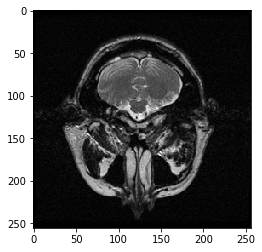

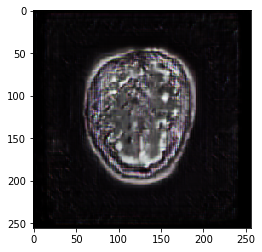

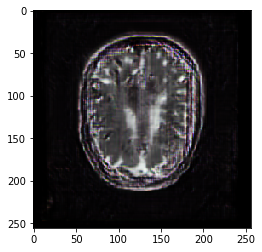

D Real: 0.5705741, D Fake: 0.33310586, G All: 3.1281307
D Real: 0.3791973, D Fake: 0.17611444, G All: 2.9780617
D Real: 0.3275472, D Fake: 0.29684556, G All: 2.4395041
D Real: 0.11959249, D Fake: 0.3523497, G All: 2.2640975
D Real: 0.13779178, D Fake: 0.44807494, G All: 1.7630572
D Real: 1.1031634, D Fake: 0.46343464, G All: 2.2198632
D Real: 0.15254416, D Fake: 0.67562824, G All: 2.798102
D Real: 0.09699933, D Fake: 0.17260805, G All: 2.1613085
D Real: 0.14217356, D Fake: 0.17557368, G All: 2.798468
D Real: 0.43840307, D Fake: 0.19147912, G All: 3.6334984
D Real: 0.57507086, D Fake: 0.1527233, G All: 3.184062
D Real: 0.45762748, D Fake: 0.24546301, G All: 2.5058963
D Real: 0.17842478, D Fake: 0.14435798, G All: 2.6755857
D Real: 0.06460539, D Fake: 0.3087884, G All: 2.6405694
D Real: 0.6637542, D Fake: 0.21599244, G All: 2.4936414
D Real: 0.09813437, D Fake: 0.21404256, G All: 2.4649637
D Real: 0.55655897, D Fake: 0.36694628, G All: 2.1546073
D Real: 0.90877974, D Fake: 0.4119804, G A

D Real: 0.8678036, D Fake: 0.2578169, G All: 1.7573134
D Real: 0.051569913, D Fake: 0.29241276, G All: 1.7650697
D Real: 1.1121895, D Fake: 0.2364341, G All: 1.3070786
D Real: 0.16330098, D Fake: 0.94168115, G All: 1.5296612
D Real: 0.12164528, D Fake: 0.3334974, G All: 2.017967
D Real: 0.26262164, D Fake: 0.166118, G All: 1.7212572
D Real: 0.038532782, D Fake: 0.3361394, G All: 2.517878
D Real: 0.7841456, D Fake: 0.22885934, G All: 2.6314712
D Real: 0.094943866, D Fake: 0.2689271, G All: 2.773089
D Real: 0.46880552, D Fake: 0.25643426, G All: 2.7852275
D Real: 0.44633582, D Fake: 0.23910463, G All: 2.7095747
D Real: 0.054631464, D Fake: 0.35385835, G All: 2.2152166
D Real: 0.45131153, D Fake: 0.18121752, G All: 1.7881771
D Real: 0.25043622, D Fake: 0.21696158, G All: 1.7146233
D Real: 0.11811289, D Fake: 0.2505788, G All: 1.8420267
D Real: 0.31084818, D Fake: 0.40225714, G All: 1.630941
D Real: 1.3533262, D Fake: 0.27021846, G All: 1.5538818
D Real: 0.16343114, D Fake: 0.5064695, G Al

D Real: 0.09161243, D Fake: 0.2845118, G All: 2.7425385
D Real: 0.14747027, D Fake: 0.060602486, G All: 2.6242578
D Real: 0.15620053, D Fake: 0.09423144, G All: 2.5487847
D Real: 0.2565483, D Fake: 0.14407913, G All: 3.2316241
D Real: 0.42487645, D Fake: 0.05700224, G All: 3.05865
D Real: 0.06750023, D Fake: 0.2872571, G All: 2.6561575
D Real: 0.2151509, D Fake: 0.07158502, G All: 2.0701838
D Real: 0.23022422, D Fake: 0.08688389, G All: 2.5010629
D Real: 0.12320666, D Fake: 0.10147187, G All: 2.157818
D Real: 0.03617085, D Fake: 0.49396816, G All: 1.9192208
D Real: 0.28473008, D Fake: 0.109570295, G All: 2.321655
D Real: 0.048527434, D Fake: 0.28976345, G All: 2.1740923
D Real: 0.3520227, D Fake: 0.74107736, G All: 2.5571952
D Real: 0.1087026, D Fake: 0.38312033, G All: 2.941376
D Real: 0.12872751, D Fake: 0.21433704, G All: 3.7585256
D Real: 1.4531984, D Fake: 0.26454622, G All: 4.487391
D Real: 1.1164706, D Fake: 0.19488609, G All: 2.7383525
D Real: 0.4531986, D Fake: 0.07025586, G A

D Real: 0.48356384, D Fake: 0.15761116, G All: 2.75951
D Real: 0.42958552, D Fake: 0.113363005, G All: 2.76732
D Real: 0.48039827, D Fake: 0.14663807, G All: 2.919485
D Real: 0.2410707, D Fake: 0.25437164, G All: 2.4860554
D Real: 0.08350828, D Fake: 0.5051064, G All: 2.0686946
D Real: 0.27007976, D Fake: 0.27751595, G All: 2.4431622
D Real: 0.16081257, D Fake: 0.47896403, G All: 2.9043188
D Real: 0.17294611, D Fake: 0.08809648, G All: 2.4583182
D Real: 0.40146744, D Fake: 0.116330996, G All: 3.2024062
D Real: 1.9104724, D Fake: 0.27079576, G All: 2.3011727
D Real: 0.036070056, D Fake: 0.5143782, G All: 2.497238
D Real: 0.22920473, D Fake: 0.19182657, G All: 2.0486932
D Real: 0.09324943, D Fake: 0.28045636, G All: 2.2179601
D Real: 0.04033281, D Fake: 0.108411714, G All: 2.7383645
D Real: 0.15887244, D Fake: 0.4033494, G All: 2.9958596
D Real: 0.47521204, D Fake: 0.12314031, G All: 2.6998792
D Real: 0.07632082, D Fake: 0.15858942, G All: 2.5562685
D Real: 0.28648615, D Fake: 0.06804231

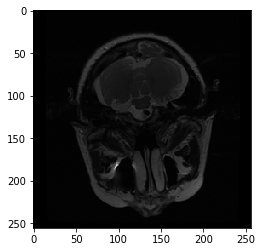

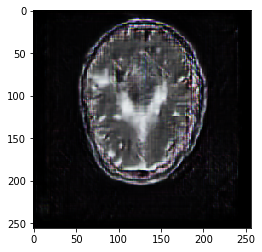

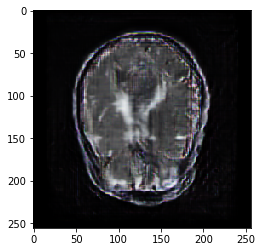

D Real: 0.15751337, D Fake: 0.09158334, G All: 3.2083206
D Real: 0.14450604, D Fake: 0.14572772, G All: 2.1438203
D Real: 0.27156, D Fake: 0.18957458, G All: 2.2693832
D Real: 0.29880822, D Fake: 0.41760615, G All: 1.2044072
D Real: 0.33448666, D Fake: 0.63347244, G All: 2.3315864
D Real: 0.5890119, D Fake: 0.38090497, G All: 2.344831
D Real: 0.20804702, D Fake: 0.5749051, G All: 1.6992581
D Real: 0.1776457, D Fake: 0.1858219, G All: 2.5952585
D Real: 0.652969, D Fake: 0.37130073, G All: 2.4875326
D Real: 0.5228603, D Fake: 0.2721244, G All: 2.1796026
D Real: 0.037822507, D Fake: 0.20639199, G All: 1.7694883
D Real: 0.099907614, D Fake: 0.55988324, G All: 3.0176523
D Real: 0.05414895, D Fake: 0.1627605, G All: 2.4803343
D Real: 0.9875697, D Fake: 0.08324518, G All: 2.9792538
D Real: 0.9066557, D Fake: 0.18683618, G All: 2.8539717
D Real: 0.19191942, D Fake: 0.09586125, G All: 1.18608
D Real: 0.29329956, D Fake: 0.32571292, G All: 1.7311287
D Real: 0.035800125, D Fake: 0.56998, G All: 1

D Real: 0.0975949, D Fake: 0.39405096, G All: 1.9926374
D Real: 0.17233557, D Fake: 0.45673102, G All: 2.197932
D Real: 0.5793032, D Fake: 0.20980822, G All: 2.4773374
D Real: 0.14440376, D Fake: 1.0290283, G All: 2.5003698
D Real: 0.14151004, D Fake: 0.39339873, G All: 2.5742064
D Real: 0.28120196, D Fake: 0.3999503, G All: 2.971654
D Real: 0.09914461, D Fake: 0.16108045, G All: 3.594958
D Real: 0.26037565, D Fake: 0.045488257, G All: 3.9870198
D Real: 1.0296476, D Fake: 0.11856328, G All: 3.2484927
D Real: 0.088491485, D Fake: 0.08208713, G All: 2.9869876
D Real: 0.32549247, D Fake: 0.13037866, G All: 2.0569804
D Real: 0.056893066, D Fake: 0.1233388, G All: 2.2110682
D Real: 0.20430008, D Fake: 0.10370071, G All: 1.8674014
D Real: 0.04068227, D Fake: 0.35442626, G All: 1.8952115
D Real: 0.41769874, D Fake: 0.4198497, G All: 2.1564188
D Real: 0.20479701, D Fake: 0.3684625, G All: 2.1520114
D Real: 0.13776176, D Fake: 0.12473993, G All: 2.3841457
D Real: 0.045262374, D Fake: 0.38692555

D Real: 0.39822483, D Fake: 0.34655917, G All: 3.1025102
D Real: 1.9661158, D Fake: 0.32850733, G All: 1.8521553
D Real: 0.14508069, D Fake: 0.54284436, G All: 1.6620436
D Real: 0.20883092, D Fake: 0.75358254, G All: 1.4982848
D Real: 0.07616077, D Fake: 0.6074768, G All: 2.1038423
D Real: 0.18783134, D Fake: 0.15380052, G All: 2.2176797
D Real: 0.03371555, D Fake: 0.33595666, G All: 3.0812774
D Real: 0.317464, D Fake: 0.12110012, G All: 3.8216362
D Real: 1.0018032, D Fake: 0.084355734, G All: 4.143584
D Real: 0.46356106, D Fake: 0.110133976, G All: 4.031133
D Real: 0.12446304, D Fake: 0.07464661, G All: 2.7044253
D Real: 0.30029032, D Fake: 0.10162611, G All: 3.226242
D Real: 0.1657278, D Fake: 0.15341984, G All: 2.262858
D Real: 0.447771, D Fake: 0.06370277, G All: 2.482128
D Real: 0.049887687, D Fake: 0.29325107, G All: 2.18917
D Real: 0.1876482, D Fake: 0.64520204, G All: 2.2659912
D Real: 0.32827452, D Fake: 0.3078703, G All: 1.8424139
D Real: 0.7756309, D Fake: 0.73354894, G All:

D Real: 0.08837551, D Fake: 0.21220385, G All: 2.4625828
D Real: 1.1048986, D Fake: 0.10165076, G All: 2.0833497
D Real: 0.24020064, D Fake: 0.5176503, G All: 2.0512471
D Real: 0.052925788, D Fake: 0.4582706, G All: 1.6137729
D Real: 0.08919847, D Fake: 0.47808862, G All: 2.505848
D Real: 0.09181603, D Fake: 0.45749834, G All: 3.611268
D Real: 0.38937566, D Fake: 0.080700025, G All: 3.8582222
D Real: 1.3660902, D Fake: 0.128724, G All: 3.82585
D Real: 0.7027271, D Fake: 0.055157386, G All: 2.5937846
D Real: 0.5256185, D Fake: 0.32805467, G All: 1.5373654
D Real: 0.044782378, D Fake: 0.61396503, G All: 1.720275
D Real: 0.09660826, D Fake: 1.3254118, G All: 1.4696381
D Real: 0.031188866, D Fake: 0.0894271, G All: 2.7684164
D Real: 0.2088487, D Fake: 0.37978908, G All: 3.3037453
D Real: 0.22129767, D Fake: 0.21486184, G All: 3.4181786
D Real: 0.21562323, D Fake: 0.105621666, G All: 3.745698
D Real: 0.19920366, D Fake: 0.118313044, G All: 3.5869274
D Real: 0.36056954, D Fake: 0.20102918, G

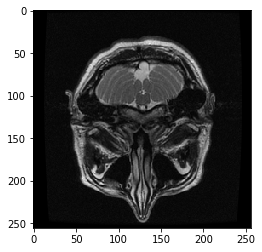

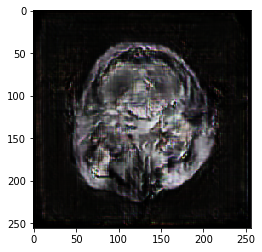

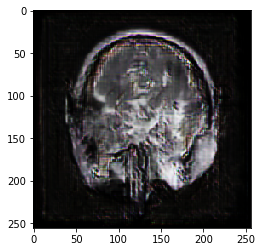

D Real: 0.24808507, D Fake: 0.0778863, G All: 3.4535456
D Real: 0.45477384, D Fake: 0.10893594, G All: 3.2585247
D Real: 0.26633728, D Fake: 0.12713474, G All: 3.1022968
D Real: 0.25626948, D Fake: 0.0856052, G All: 2.6396208
D Real: 0.03393559, D Fake: 0.22197385, G All: 2.4100852
D Real: 0.038099065, D Fake: 0.33777362, G All: 2.092669
D Real: 0.45708078, D Fake: 0.15853398, G All: 2.766189
D Real: 0.23293309, D Fake: 0.6198243, G All: 2.5699139
D Real: 0.49516195, D Fake: 0.37208337, G All: 1.7426051
D Real: 0.23587891, D Fake: 0.20938587, G All: 1.9381176
D Real: 0.15324101, D Fake: 0.061885826, G All: 3.7233315
D Real: 0.3262679, D Fake: 0.07695216, G All: 2.829585
D Real: 0.1866392, D Fake: 0.28883228, G All: 2.40657
D Real: 0.16141388, D Fake: 0.6110538, G All: 2.0964441
D Real: 0.10456965, D Fake: 0.21866253, G All: 2.1323786
D Real: 0.66565806, D Fake: 0.16216435, G All: 2.5286174
D Real: 0.34375182, D Fake: 0.08777906, G All: 2.7739186
D Real: 0.10065864, D Fake: 0.45623648, 

D Real: 0.051405393, D Fake: 0.4463468, G All: 3.237705
D Real: 0.576308, D Fake: 0.24181232, G All: 3.078349
D Real: 0.51208293, D Fake: 0.4426155, G All: 1.8708472
D Real: 0.0971283, D Fake: 0.23759153, G All: 1.9837437
D Real: 0.11440221, D Fake: 0.26168668, G All: 2.40973
D Real: 0.62954706, D Fake: 0.16449869, G All: 2.6508799
D Real: 1.2687941, D Fake: 0.08156654, G All: 2.0962045
D Real: 0.15035614, D Fake: 0.51351774, G All: 1.2849822
D Real: 0.24212554, D Fake: 0.46199268, G All: 1.7161076
D Real: 0.07409343, D Fake: 1.1007082, G All: 2.1074526
D Real: 0.65650076, D Fake: 0.18369284, G All: 1.9630108
D Real: 0.1580238, D Fake: 0.43353114, G All: 2.4048815
D Real: 0.07656002, D Fake: 0.1800685, G All: 3.1382518
D Real: 0.14857008, D Fake: 0.29065287, G All: 3.2700958
D Real: 0.23834343, D Fake: 0.084646285, G All: 4.29091
D Real: 1.2445115, D Fake: 0.06691506, G All: 3.4917207
D Real: 0.10147084, D Fake: 0.059816938, G All: 4.3655586
D Real: 1.155206, D Fake: 0.3847449, G All: 

D Real: 0.2431441, D Fake: 0.30912036, G All: 1.9415598
D Real: 0.09338395, D Fake: 0.4269979, G All: 2.0139577
D Real: 0.25031918, D Fake: 0.4020765, G All: 1.9786935
D Real: 0.3309173, D Fake: 0.06744656, G All: 2.616291
D Real: 0.10709214, D Fake: 0.07034376, G All: 3.2311263
D Real: 1.1197475, D Fake: 0.21674621, G All: 3.8679862
D Real: 0.99742156, D Fake: 0.17091322, G All: 1.8191757
D Real: 0.38015825, D Fake: 0.45774847, G All: 1.4570785
D Real: 0.7675723, D Fake: 0.4612382, G All: 1.187032
D Real: 0.14393237, D Fake: 0.56765866, G All: 0.9627016
D Real: 0.13515627, D Fake: 0.5743487, G All: 1.0286493
D Real: 0.072484486, D Fake: 0.6889265, G All: 1.3842647
D Real: 0.25854033, D Fake: 0.6276652, G All: 2.370471
D Real: 0.21295576, D Fake: 0.31673604, G All: 2.744484
D Real: 0.5131743, D Fake: 0.060810205, G All: 3.2863781
D Real: 0.83324766, D Fake: 0.16748576, G All: 2.931607
D Real: 1.0883219, D Fake: 0.37643316, G All: 3.6199841
D Real: 0.84647346, D Fake: 0.11304189, G All:

D Real: 0.14213988, D Fake: 0.47670102, G All: 2.0450149
D Real: 0.11023727, D Fake: 0.21482185, G All: 2.9399428
D Real: 0.23077738, D Fake: 0.3674469, G All: 2.69171
D Real: 0.20097893, D Fake: 0.18159877, G All: 2.4316401
D Real: 0.16647816, D Fake: 0.07080239, G All: 2.9265602
D Real: 0.48387295, D Fake: 0.10454956, G All: 2.346108
D Real: 0.28404695, D Fake: 0.07803277, G All: 2.5562642
D Real: 0.17501351, D Fake: 0.18154979, G All: 1.788636
D Real: 0.20629668, D Fake: 0.27573052, G All: 2.2069259
D Real: 0.16938734, D Fake: 0.17843604, G All: 1.9963601
D Real: 0.0371565, D Fake: 0.37185293, G All: 2.1505446
D Real: 0.5031727, D Fake: 0.58892107, G All: 2.5651917
D Real: 0.062254135, D Fake: 0.20502347, G All: 1.8331296
D Real: 0.14944652, D Fake: 0.14381132, G All: 3.1001956
D Real: 0.6011832, D Fake: 0.094765276, G All: 2.9846892
D Real: 0.045545816, D Fake: 0.10397251, G All: 2.4618697
D Real: 0.17122325, D Fake: 0.18869533, G All: 2.7994394
D Real: 0.4682607, D Fake: 0.3270957

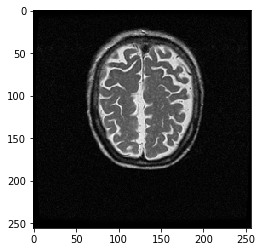

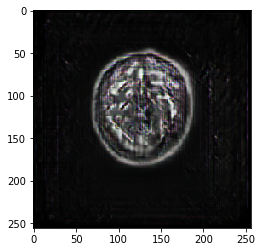

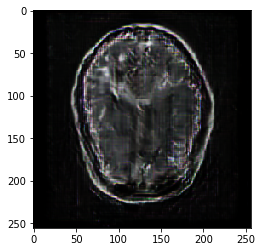

D Real: 0.15015244, D Fake: 0.21800631, G All: 2.7670722
D Real: 0.3686913, D Fake: 0.073984414, G All: 2.0250268
D Real: 0.31302428, D Fake: 0.4281319, G All: 2.5299988
D Real: 0.5378338, D Fake: 0.41434935, G All: 2.0718658
D Real: 0.04105661, D Fake: 0.08350941, G All: 1.4686764
D Real: 0.26210248, D Fake: 0.64172435, G All: 2.1754818
D Real: 0.62238777, D Fake: 0.3416084, G All: 2.3701754
D Real: 0.18967058, D Fake: 0.5353991, G All: 2.5969098
D Real: 0.057888277, D Fake: 0.32847917, G All: 2.9596636
D Real: 0.9108315, D Fake: 0.1743927, G All: 2.9396472
D Real: 0.53309786, D Fake: 0.3583883, G All: 2.8717415
D Real: 0.5830349, D Fake: 0.15411702, G All: 2.2644324
D Real: 0.13576692, D Fake: 0.36232942, G All: 2.1712599
D Real: 0.13442644, D Fake: 0.35568094, G All: 1.6063676
D Real: 0.04981889, D Fake: 0.5181918, G All: 1.8809657
D Real: 0.27336416, D Fake: 0.26759163, G All: 2.0631683
D Real: 0.24257106, D Fake: 0.18678977, G All: 2.4837713
D Real: 0.34647807, D Fake: 0.092262894

D Real: 0.14631855, D Fake: 0.27131248, G All: 2.6521094
D Real: 0.05085034, D Fake: 0.48119265, G All: 3.0678735
D Real: 0.6766968, D Fake: 0.17636785, G All: 2.7988691
D Real: 0.8933952, D Fake: 0.09952682, G All: 3.0872555
D Real: 0.11233159, D Fake: 0.13106287, G All: 1.629535
D Real: 0.06266026, D Fake: 0.56949496, G All: 1.7878155
D Real: 0.30765885, D Fake: 0.12814972, G All: 2.2417376
D Real: 0.066395015, D Fake: 0.20817812, G All: 2.2295215
D Real: 0.47147653, D Fake: 0.12091733, G All: 2.6430655
D Real: 0.33786476, D Fake: 0.23806266, G All: 2.6312985
D Real: 1.3850384, D Fake: 0.0894464, G All: 1.2945387
D Real: 0.09614989, D Fake: 0.647254, G All: 1.882056
D Real: 0.19895954, D Fake: 0.7954979, G All: 1.014264
D Real: 0.734043, D Fake: 0.4827363, G All: 1.3784502
D Real: 0.2476659, D Fake: 0.5653705, G All: 1.2837533
D Real: 0.05602342, D Fake: 0.29162645, G All: 2.0985544
D Real: 0.23457094, D Fake: 0.24879181, G All: 2.777876
D Real: 0.050530564, D Fake: 0.30739027, G All

D Real: 0.10894201, D Fake: 0.5535124, G All: 2.8063078
D Real: 0.03648749, D Fake: 0.33863333, G All: 2.3132126
D Real: 0.53208494, D Fake: 0.14472762, G All: 2.2639363
D Real: 0.09573198, D Fake: 0.19304632, G All: 3.0176072
D Real: 0.44394875, D Fake: 0.12232161, G All: 2.2354007
D Real: 0.31783634, D Fake: 0.17732418, G All: 1.8923552
D Real: 0.06218803, D Fake: 0.23776618, G All: 2.2663734
D Real: 0.33624738, D Fake: 0.14769466, G All: 2.5908241
D Real: 0.27428916, D Fake: 0.3663993, G All: 1.6607443
D Real: 0.25542113, D Fake: 0.16272092, G All: 2.4128265
D Real: 0.053461067, D Fake: 0.7996731, G All: 2.21027
D Real: 0.09628314, D Fake: 0.10641603, G All: 3.436507
D Real: 0.058717843, D Fake: 0.07228606, G All: 3.5109906
D Real: 1.1772708, D Fake: 0.23876984, G All: 3.547439
D Real: 0.11343837, D Fake: 0.15356025, G All: 3.237001
D Real: 0.2884763, D Fake: 0.06217649, G All: 3.125751
D Real: 0.6686114, D Fake: 0.17728494, G All: 2.8095918
D Real: 0.42858708, D Fake: 0.10285165, G

D Real: 0.13848886, D Fake: 0.21788771, G All: 2.6691763
D Real: 0.035676077, D Fake: 0.14958462, G All: 2.9982696
D Real: 0.56129676, D Fake: 0.07208313, G All: 2.6366684
D Real: 0.37972665, D Fake: 0.15008336, G All: 2.5851908
D Real: 0.25617218, D Fake: 0.122909054, G All: 2.4830465
D Real: 0.22082788, D Fake: 0.5106483, G All: 2.508028
D Real: 0.3217219, D Fake: 0.12542729, G All: 2.5458193
D Real: 0.39812794, D Fake: 0.3553669, G All: 2.8711014
D Real: 0.40201533, D Fake: 0.16813397, G All: 2.4239528
D Real: 0.04938207, D Fake: 0.6864753, G All: 2.4026484
D Real: 0.17888531, D Fake: 0.17765674, G All: 2.7717261
D Real: 0.100818224, D Fake: 0.16320476, G All: 3.2616165
D Real: 0.3080257, D Fake: 0.3465747, G All: 3.5223017
D Real: 0.6210971, D Fake: 0.19243276, G All: 3.1232803
D Real: 0.988311, D Fake: 0.31669354, G All: 2.445931
D Real: 0.42022562, D Fake: 0.12222085, G All: 2.1293988
D Real: 0.25663418, D Fake: 0.5067967, G All: 1.6432204
D Real: 0.43920904, D Fake: 0.5213155, G

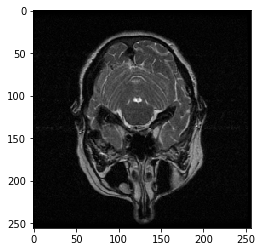

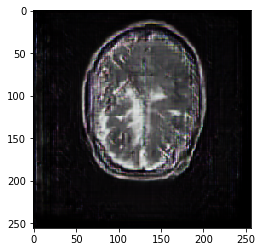

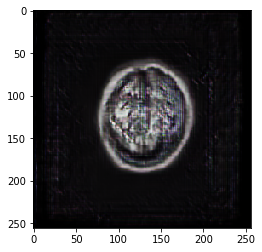

D Real: 0.38673645, D Fake: 0.55816466, G All: 2.2909303
D Real: 0.29110235, D Fake: 0.1765914, G All: 2.0407681
D Real: 0.04595629, D Fake: 0.35759842, G All: 3.1973417
D Real: 0.42535505, D Fake: 0.3099261, G All: 2.6011167
D Real: 0.31348544, D Fake: 0.12298092, G All: 2.5227664
D Real: 1.2716677, D Fake: 0.075185135, G All: 1.680464
D Real: 0.75087595, D Fake: 0.07669077, G All: 1.7836986
D Real: 0.21205953, D Fake: 0.47455537, G All: 1.4802506
D Real: 0.12586024, D Fake: 0.8579165, G All: 1.1458919
D Real: 0.03985013, D Fake: 0.56166685, G All: 2.327341
D Real: 0.24874319, D Fake: 0.5095998, G All: 2.6140265
D Real: 0.09051396, D Fake: 0.11892469, G All: 2.9008482
D Real: 0.3323549, D Fake: 0.096934006, G All: 3.4825869
D Real: 0.0844564, D Fake: 0.32063568, G All: 3.3919854
D Real: 0.44003773, D Fake: 0.21172556, G All: 4.5073013
D Real: 1.2297624, D Fake: 0.15003227, G All: 3.941024
D Real: 0.23000428, D Fake: 0.039893992, G All: 2.7505078
D Real: 0.0454851, D Fake: 0.11015404, 

D Real: 0.2257779, D Fake: 0.17875086, G All: 1.82565
D Real: 0.23225653, D Fake: 0.6648587, G All: 2.164956
D Real: 0.040768273, D Fake: 0.12590925, G All: 1.3476403
D Real: 0.08978598, D Fake: 0.24960919, G All: 1.5295169
D Real: 0.044325188, D Fake: 0.45736235, G All: 2.0798075
D Real: 0.0813093, D Fake: 0.100988716, G All: 2.662312
D Real: 0.111172795, D Fake: 0.24910697, G All: 2.1097586
D Real: 0.36862075, D Fake: 0.10079967, G All: 3.1211946
D Real: 0.33371967, D Fake: 0.18865177, G All: 3.3374395
D Real: 0.21299237, D Fake: 0.08500357, G All: 2.267303
D Real: 0.3823181, D Fake: 0.17295127, G All: 2.8172064
D Real: 0.52182776, D Fake: 0.089213416, G All: 2.6108198
D Real: 0.06288934, D Fake: 0.22132328, G All: 1.8846995
D Real: 0.10164492, D Fake: 0.46953, G All: 2.682899
D Real: 0.2465879, D Fake: 0.49409994, G All: 2.2117221
D Real: 1.0365329, D Fake: 0.48425943, G All: 2.418203
D Real: 0.073182255, D Fake: 0.15315545, G All: 2.6534767
D Real: 0.047215544, D Fake: 0.19515492, 

D Real: 0.04922907, D Fake: 0.13422835, G All: 3.4866476
D Real: 0.69408065, D Fake: 0.12667227, G All: 3.9053364
D Real: 0.5841967, D Fake: 0.09856215, G All: 3.417738
D Real: 1.0055321, D Fake: 0.10612942, G All: 2.6502867
D Real: 0.38902867, D Fake: 0.41428584, G All: 2.4122796
D Real: 0.56681275, D Fake: 0.22387779, G All: 1.4889596
D Real: 0.32988974, D Fake: 0.51675665, G All: 1.0349888
D Real: 0.06916321, D Fake: 0.4865222, G All: 1.6792922
D Real: 0.19883546, D Fake: 0.3441817, G All: 1.973882
D Real: 0.060999885, D Fake: 0.62975955, G All: 2.0575995
D Real: 0.21052021, D Fake: 0.21586785, G All: 2.1554115
D Real: 1.0169159, D Fake: 0.39986208, G All: 2.8859735
D Real: 0.1339758, D Fake: 0.36262828, G All: 2.8333566
D Real: 0.18681432, D Fake: 0.20051679, G All: 2.4806924
D Real: 0.2152896, D Fake: 0.13214248, G All: 3.2523499
D Real: 0.3137895, D Fake: 0.069716215, G All: 2.9678078
D Real: 0.7790191, D Fake: 0.40515983, G All: 2.2716997
D Real: 0.17540675, D Fake: 0.119207256,

D Real: 0.12461506, D Fake: 0.11183447, G All: 3.0920858
D Real: 0.4835937, D Fake: 0.20051727, G All: 2.91083
D Real: 0.5349828, D Fake: 0.74115026, G All: 1.9528608
D Real: 0.14101458, D Fake: 0.055016257, G All: 1.8559215
D Real: 0.9203274, D Fake: 0.45437497, G All: 2.0041962
D Real: 0.03113025, D Fake: 0.17033318, G All: 1.7331867
D Real: 0.10993624, D Fake: 0.34910586, G All: 1.6664875
D Real: 0.22504689, D Fake: 0.3385201, G All: 2.200586
D Real: 0.043521177, D Fake: 0.62991875, G All: 2.885559
D Real: 0.29150987, D Fake: 0.4486872, G All: 3.7977588
D Real: 0.4811965, D Fake: 0.055034652, G All: 3.514092
D Real: 0.11622604, D Fake: 0.05029006, G All: 3.3661156
D Real: 0.9661269, D Fake: 0.07509789, G All: 2.8493676
D Real: 0.47838104, D Fake: 0.08945935, G All: 1.8030698
D Real: 0.055862457, D Fake: 0.27923048, G All: 1.4000928
D Real: 0.076679654, D Fake: 0.52434564, G All: 1.5164474
D Real: 1.1575754, D Fake: 0.85617995, G All: 1.7795229
D Real: 0.12886828, D Fake: 0.16596375,

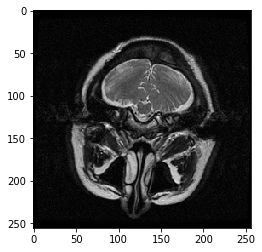

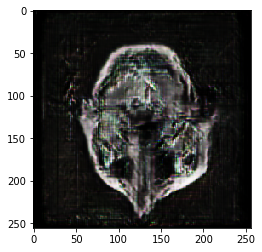

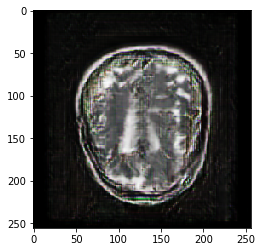

D Real: 0.2906576, D Fake: 0.039299935, G All: 2.0220509
D Real: 0.041611597, D Fake: 0.17797978, G All: 2.3461447
D Real: 0.4278593, D Fake: 0.19644733, G All: 3.0786424
D Real: 0.23127376, D Fake: 0.22636792, G All: 2.510933
D Real: 0.27565777, D Fake: 0.23110391, G All: 2.9545553
D Real: 0.30013093, D Fake: 0.3905346, G All: 2.4353228
D Real: 0.4817136, D Fake: 0.2022712, G All: 2.0195715
D Real: 0.13145748, D Fake: 0.15847814, G All: 2.1863604
D Real: 0.090291195, D Fake: 0.20701614, G All: 2.9788256
D Real: 0.26151568, D Fake: 0.23433132, G All: 2.917581
D Real: 0.9260665, D Fake: 0.45291752, G All: 2.9653988
D Real: 0.18182047, D Fake: 0.5496001, G All: 2.0919428
D Real: 0.34496891, D Fake: 0.15176341, G All: 1.5469234
D Real: 0.037206903, D Fake: 0.26918906, G All: 2.135748
D Real: 0.065376, D Fake: 0.2105121, G All: 2.2734728
D Real: 0.15770087, D Fake: 0.3445317, G All: 2.2058501
D Real: 0.27654338, D Fake: 0.16200244, G All: 3.4064262
D Real: 0.12449001, D Fake: 0.36393625, G

D Real: 0.8109325, D Fake: 0.17618671, G All: 2.0279393
D Real: 0.038526, D Fake: 0.2509006, G All: 2.1592846
D Real: 0.45587415, D Fake: 0.19890615, G All: 2.7075694
D Real: 0.18745765, D Fake: 0.80870533, G All: 2.436399
D Real: 0.3153223, D Fake: 0.18072122, G All: 3.1460495
D Real: 0.5319499, D Fake: 0.4602663, G All: 1.8329703
D Real: 0.20251563, D Fake: 0.15140447, G All: 1.8208025
D Real: 0.11387873, D Fake: 0.1890069, G All: 2.758731
D Real: 0.82449055, D Fake: 0.7525835, G All: 2.0512924
D Real: 0.5516856, D Fake: 0.4496851, G All: 2.21638
D Real: 0.59379435, D Fake: 0.8370842, G All: 2.9321184
D Real: 0.57537055, D Fake: 0.22918086, G All: 2.385056
D Real: 0.21999547, D Fake: 0.4057596, G All: 3.2043061
D Real: 0.28114736, D Fake: 0.19756359, G All: 3.1723466
D Real: 0.59690416, D Fake: 0.0815494, G All: 2.9681873
D Real: 0.4971407, D Fake: 0.24942781, G All: 2.5569968
D Real: 0.14018369, D Fake: 0.4536941, G All: 2.444345
D Real: 0.058922403, D Fake: 0.2096835, G All: 2.1677

D Real: 0.39310527, D Fake: 0.20261905, G All: 2.5953808
D Real: 0.78135705, D Fake: 0.20537832, G All: 2.13556
D Real: 0.41847256, D Fake: 1.0923382, G All: 2.0914493
D Real: 0.06802177, D Fake: 0.17072688, G All: 2.523015
D Real: 0.22133288, D Fake: 0.2209382, G All: 2.36633
D Real: 0.17696363, D Fake: 0.34263045, G All: 3.1290717
D Real: 0.54334265, D Fake: 0.14052682, G All: 2.8658671
D Real: 0.652428, D Fake: 0.17935498, G All: 2.6672392
D Real: 0.12545723, D Fake: 0.108413436, G All: 2.5516863
D Real: 1.3429655, D Fake: 0.15636678, G All: 1.8143035
D Real: 0.20025879, D Fake: 0.37235177, G All: 1.8585709
D Real: 0.10245144, D Fake: 0.6937745, G All: 1.6404147
D Real: 0.08237724, D Fake: 0.21894349, G All: 1.780755
D Real: 0.20260826, D Fake: 0.54648155, G All: 1.9088854
D Real: 0.23429298, D Fake: 0.32902542, G All: 3.4465406
D Real: 0.22653705, D Fake: 0.16290574, G All: 3.6687582
D Real: 0.29670554, D Fake: 0.106589325, G All: 3.8531702
D Real: 0.80294454, D Fake: 0.1500327, G 

D Real: 0.28192377, D Fake: 0.17863229, G All: 2.6501937
D Real: 0.35248178, D Fake: 0.25816488, G All: 2.0937264
D Real: 0.16572282, D Fake: 0.43041044, G All: 2.5316126
D Real: 1.1207283, D Fake: 0.56764185, G All: 2.7879567
D Real: 0.28970784, D Fake: 0.31962132, G All: 2.2575152
D Real: 0.55415726, D Fake: 0.27335685, G All: 2.8746157
D Real: 0.5499677, D Fake: 0.38770187, G All: 2.7404847
D Real: 0.34791726, D Fake: 0.1838713, G All: 2.3845136
D Real: 0.34166878, D Fake: 0.4984862, G All: 2.0572362
D Real: 0.30003613, D Fake: 0.17757508, G All: 1.6682014
D Real: 0.27149597, D Fake: 0.34727958, G All: 1.2414899
D Real: 0.20004383, D Fake: 0.36204425, G All: 2.228047
D Real: 0.17977342, D Fake: 0.3927043, G All: 2.162045
D Real: 0.062273838, D Fake: 0.39593047, G All: 2.9469438
D Real: 0.29856873, D Fake: 0.051623967, G All: 2.3833091
D Real: 0.53169423, D Fake: 0.14843465, G All: 2.6044765
D Real: 0.96497047, D Fake: 0.43637466, G All: 2.5663939
D Real: 0.4002308, D Fake: 0.1143734

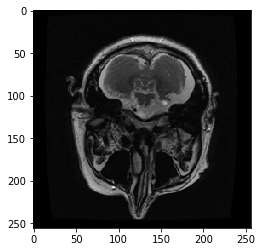

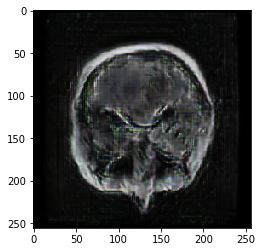

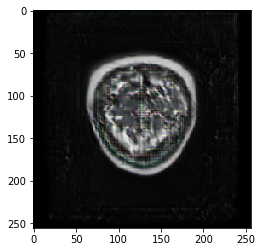

D Real: 0.3192315, D Fake: 0.79753363, G All: 2.5974362
D Real: 0.17895928, D Fake: 0.33516002, G All: 3.0672245
D Real: 0.21290441, D Fake: 0.23921892, G All: 2.9000025
D Real: 0.53159136, D Fake: 0.051298495, G All: 2.6945713
D Real: 0.18103224, D Fake: 0.14419714, G All: 3.0484443
D Real: 0.32988566, D Fake: 0.05241278, G All: 2.9879985
D Real: 0.08762336, D Fake: 0.15621671, G All: 2.51502
D Real: 0.08421376, D Fake: 0.08721015, G All: 2.6450014
D Real: 0.2810371, D Fake: 0.57190084, G All: 2.7966871
D Real: 0.1233317, D Fake: 0.13611424, G All: 2.8842044
D Real: 0.6525787, D Fake: 0.18855718, G All: 2.153614
D Real: 0.2099359, D Fake: 0.25791824, G All: 2.4405317
D Real: 0.3476886, D Fake: 0.32954007, G All: 2.3153348
D Real: 0.033586778, D Fake: 0.5265845, G All: 2.887022
D Real: 0.065929875, D Fake: 0.12963095, G All: 2.257521
D Real: 0.04156718, D Fake: 0.35142887, G All: 3.396269
D Real: 0.8823215, D Fake: 0.05828437, G All: 2.882022
D Real: 0.875941, D Fake: 0.16763496, G All

D Real: 0.47315058, D Fake: 0.37738922, G All: 2.7243035
D Real: 0.10581565, D Fake: 0.061526112, G All: 2.741754
D Real: 0.1421706, D Fake: 0.13420938, G All: 2.8934805
D Real: 0.36460254, D Fake: 0.15874729, G All: 3.2438717
D Real: 0.12638597, D Fake: 0.15557098, G All: 3.3743787
D Real: 0.33559123, D Fake: 0.06625718, G All: 3.0452573
D Real: 0.18472749, D Fake: 0.23008347, G All: 3.3795094
D Real: 0.45592433, D Fake: 0.18235287, G All: 2.3733463
D Real: 0.059361693, D Fake: 0.51832473, G All: 2.3885026
D Real: 0.3791973, D Fake: 0.20547962, G All: 2.135378
D Real: 0.0901253, D Fake: 0.8739533, G All: 2.3008113
D Real: 0.06707934, D Fake: 0.11321375, G All: 2.3626943
D Real: 0.6642277, D Fake: 0.23098405, G All: 3.1103494
D Real: 0.048065703, D Fake: 0.06340076, G All: 2.1105332
D Real: 0.05062545, D Fake: 0.52215767, G All: 2.502447
D Real: 0.3544315, D Fake: 0.1132406, G All: 3.6080751
D Real: 0.47239035, D Fake: 0.18160306, G All: 3.5600746
D Real: 0.048186194, D Fake: 0.0621249

D Real: 0.36028624, D Fake: 0.265779, G All: 3.310643
D Real: 1.3773358, D Fake: 0.06728737, G All: 3.1289778
D Real: 0.17462797, D Fake: 0.29407382, G All: 2.6087782
D Real: 0.82367456, D Fake: 0.24124385, G All: 2.0616248
D Real: 0.16008902, D Fake: 0.40835592, G All: 1.6461519
D Real: 0.25361058, D Fake: 0.60432494, G All: 2.4972925
D Real: 1.0906984, D Fake: 0.5099257, G All: 1.0003507
D Real: 0.6105379, D Fake: 0.9308574, G All: 1.4402567
D Real: 0.44007432, D Fake: 0.41771156, G All: 1.4965758
D Real: 0.057910316, D Fake: 0.11580933, G All: 1.2695003
D Real: 0.13062616, D Fake: 1.143797, G All: 3.0079367
D Real: 0.21955624, D Fake: 0.46621376, G All: 2.9946585
D Real: 0.52718973, D Fake: 0.2961421, G All: 3.9900823
D Real: 1.2283416, D Fake: 0.076625906, G All: 3.5528636
D Real: 1.330668, D Fake: 0.043780338, G All: 3.279142
D Real: 0.5997195, D Fake: 0.28671044, G All: 2.0282857
D Real: 0.3403575, D Fake: 0.21378817, G All: 1.4482145
D Real: 0.03889551, D Fake: 0.5663242, G All:

D Real: 0.3555047, D Fake: 0.08987142, G All: 2.9099705
D Real: 0.35641813, D Fake: 0.09643945, G All: 2.3436666
D Real: 0.55009115, D Fake: 0.53855765, G All: 2.5526717
D Real: 0.039414853, D Fake: 0.14744306, G All: 2.5120635
D Real: 0.2786074, D Fake: 0.24272028, G All: 2.4135497
D Real: 0.19135597, D Fake: 0.1717333, G All: 1.7785411
D Real: 0.065266356, D Fake: 0.24065864, G All: 1.5857329
D Real: 0.07457042, D Fake: 0.35676992, G All: 2.257071
D Real: 0.062771454, D Fake: 0.08929449, G All: 2.539502
D Real: 0.04942476, D Fake: 0.19859195, G All: 2.7887964
D Real: 0.15400301, D Fake: 0.24811137, G All: 2.6329374
D Real: 0.036176257, D Fake: 0.09149944, G All: 3.5966353
D Real: 0.108320765, D Fake: 0.06498016, G All: 4.0477486
D Real: 1.0350327, D Fake: 0.052034147, G All: 3.5782328
D Real: 1.0308422, D Fake: 0.55140644, G All: 3.5858417
D Real: 0.09298882, D Fake: 0.08117789, G All: 2.7756133
D Real: 0.21336667, D Fake: 0.17800437, G All: 2.7845502
D Real: 0.14019758, D Fake: 0.30

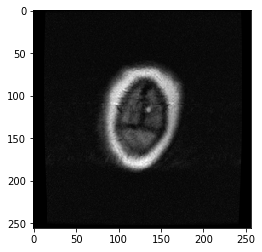

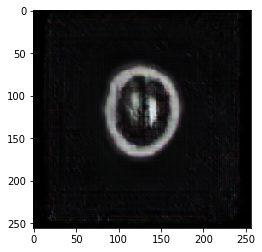

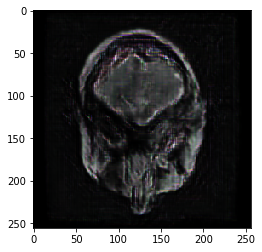

D Real: 0.15828644, D Fake: 0.12709525, G All: 2.7014315
D Real: 0.09779103, D Fake: 0.08850719, G All: 1.45701
D Real: 0.053257365, D Fake: 0.18342948, G All: 1.8390644
D Real: 0.4233728, D Fake: 0.28649744, G All: 2.8148954
D Real: 0.7008542, D Fake: 0.20777035, G All: 1.5513109
D Real: 0.24463432, D Fake: 0.11941971, G All: 1.9033628
D Real: 0.2991689, D Fake: 0.39371836, G All: 2.1928754
D Real: 0.15825209, D Fake: 0.5487041, G All: 2.0709696
D Real: 0.36750913, D Fake: 0.18506742, G All: 1.8311542
D Real: 0.5650785, D Fake: 0.1510891, G All: 1.9737511
D Real: 0.4575744, D Fake: 0.32686847, G All: 1.5258485
D Real: 0.0981935, D Fake: 0.4381022, G All: 2.1365995
D Real: 0.28254473, D Fake: 0.21763714, G All: 2.1147895
D Real: 0.12219771, D Fake: 0.54304236, G All: 1.7533814
D Real: 0.3370762, D Fake: 0.23121579, G All: 2.0419421
D Real: 0.29232806, D Fake: 0.2752238, G All: 2.1143367
D Real: 0.10900833, D Fake: 0.31046593, G All: 2.829296
D Real: 0.52084804, D Fake: 0.26429433, G Al

D Real: 0.09587595, D Fake: 0.19969161, G All: 2.8225994
D Real: 0.5146281, D Fake: 0.18320721, G All: 2.1271994
D Real: 0.42592138, D Fake: 0.5516343, G All: 2.1829278
D Real: 0.048093263, D Fake: 0.5700823, G All: 2.1630838
D Real: 0.10644451, D Fake: 0.49023116, G All: 2.9421883
D Real: 0.43422648, D Fake: 0.13676395, G All: 3.5139537
D Real: 1.2167407, D Fake: 0.2051749, G All: 2.4611318
D Real: 1.5313604, D Fake: 0.24716964, G All: 3.0686717
D Real: 0.35589862, D Fake: 0.07829012, G All: 2.4253597
D Real: 0.36181843, D Fake: 0.2980683, G All: 1.747935
D Real: 0.15891872, D Fake: 0.45983088, G All: 1.1703157
D Real: 0.44326854, D Fake: 0.8928973, G All: 1.4914025
D Real: 0.121202886, D Fake: 0.57392585, G All: 2.444787
D Real: 0.17156452, D Fake: 0.31295544, G All: 3.2725167
D Real: 0.38529587, D Fake: 0.20347792, G All: 2.8045747
D Real: 0.63483846, D Fake: 0.14812812, G All: 3.0816207
D Real: 0.32655543, D Fake: 0.13789651, G All: 1.8505023
D Real: 0.37783474, D Fake: 0.11716657,

D Real: 0.5986386, D Fake: 1.2337626, G All: 2.3975022
D Real: 0.03966926, D Fake: 0.2523665, G All: 2.1969886
D Real: 0.15947364, D Fake: 0.08755452, G All: 2.39137
D Real: 1.0894527, D Fake: 0.18857417, G All: 2.8681154
D Real: 0.38314468, D Fake: 0.77090496, G All: 2.2270489
D Real: 0.050774693, D Fake: 0.25624916, G All: 2.6321018
D Real: 0.5559632, D Fake: 0.13929603, G All: 2.7217865
D Real: 0.08834728, D Fake: 0.20977227, G All: 2.5424967
D Real: 0.39996743, D Fake: 0.33613065, G All: 3.4412465
D Real: 0.090788856, D Fake: 0.1798318, G All: 2.4876797
D Real: 0.1922629, D Fake: 0.23897804, G All: 3.4405403
D Real: 0.36081326, D Fake: 0.17175882, G All: 2.4746678
D Real: 0.46386313, D Fake: 0.10906932, G All: 2.234726
D Real: 0.2661469, D Fake: 0.26718408, G All: 1.8131832
D Real: 0.29898947, D Fake: 0.30520016, G All: 2.268878
D Real: 0.74810994, D Fake: 0.33100492, G All: 1.9960958
D Real: 0.21144609, D Fake: 1.5413129, G All: 1.6406443
D Real: 0.023500104, D Fake: 0.32168093, G

D Real: 0.37089258, D Fake: 0.10649051, G All: 3.563476
D Real: 0.18029463, D Fake: 0.068201736, G All: 2.896965
D Real: 0.2630718, D Fake: 0.1649955, G All: 2.2517343
D Real: 0.4056031, D Fake: 0.2647139, G All: 2.1697822
D Real: 0.24843496, D Fake: 0.51299596, G All: 1.8120375
D Real: 0.23400219, D Fake: 0.5728034, G All: 1.6015396
D Real: 0.31031716, D Fake: 0.5226034, G All: 2.6631374
D Real: 0.3687601, D Fake: 0.91712224, G All: 2.8283408
D Real: 0.17059417, D Fake: 0.105662555, G All: 3.8188663
D Real: 0.16420008, D Fake: 0.33242208, G All: 4.1183863
D Real: 0.89555955, D Fake: 0.053727664, G All: 4.180763
D Real: 0.44691646, D Fake: 0.046217624, G All: 3.5355573
D Real: 0.63894606, D Fake: 0.06294245, G All: 2.643734
D Real: 0.301866, D Fake: 0.35161346, G All: 1.756238
D Real: 0.117322996, D Fake: 0.23721714, G All: 1.981095
D Real: 0.11615193, D Fake: 0.46926278, G All: 1.8548055
D Real: 0.38296694, D Fake: 0.6541194, G All: 2.45781
D Real: 0.081297204, D Fake: 0.23254299, G A

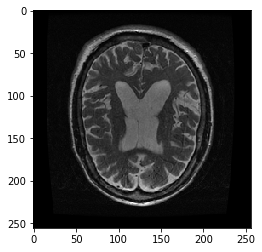

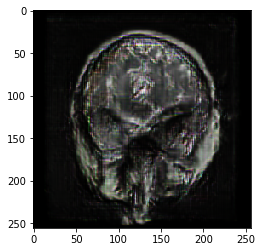

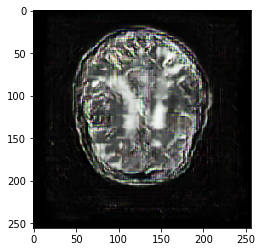

D Real: 0.25212383, D Fake: 0.37484688, G All: 2.0918589
D Real: 0.28989786, D Fake: 0.7603589, G All: 2.4612465
D Real: 0.08468711, D Fake: 0.124689125, G All: 3.0074086
D Real: 0.18153585, D Fake: 0.095104754, G All: 3.6159894
D Real: 0.5867132, D Fake: 0.40492916, G All: 3.940792
D Real: 0.252454, D Fake: 0.0926268, G All: 3.4872324
D Real: 0.10627547, D Fake: 0.21469757, G All: 3.5273266
D Real: 0.55657935, D Fake: 0.050355006, G All: 3.0809932
D Real: 0.8123839, D Fake: 0.238054, G All: 2.2851825
D Real: 0.17916381, D Fake: 0.6893238, G All: 1.9561368
D Real: 0.37996995, D Fake: 0.26513642, G All: 1.9706862
D Real: 0.2064945, D Fake: 0.89542526, G All: 1.7086916
D Real: 0.21949956, D Fake: 0.6702007, G All: 1.4293334
D Real: 0.1989539, D Fake: 0.16224048, G All: 1.9659635
D Real: 0.061986215, D Fake: 0.1766736, G All: 3.3998766
D Real: 0.5176915, D Fake: 0.19191411, G All: 2.653535
D Real: 0.18744108, D Fake: 0.11408958, G All: 2.2420418
D Real: 0.70877975, D Fake: 0.06339238, G A

D Real: 1.0087192, D Fake: 0.055357404, G All: 2.2601323
D Real: 0.47540584, D Fake: 0.3873328, G All: 2.1217294
D Real: 0.28552517, D Fake: 0.6156147, G All: 1.7581437
D Real: 0.13109252, D Fake: 0.1317812, G All: 1.9545032
D Real: 0.0367387, D Fake: 0.9370104, G All: 1.8790342
D Real: 0.37714925, D Fake: 0.414958, G All: 2.2947702
D Real: 0.48104024, D Fake: 0.4133435, G All: 2.541368
D Real: 0.2740214, D Fake: 0.18667336, G All: 2.9481063
D Real: 0.2667234, D Fake: 0.12897183, G All: 2.542613
D Real: 0.86978143, D Fake: 0.26050606, G All: 3.0617294
D Real: 0.2574899, D Fake: 0.12227551, G All: 2.6907926
D Real: 0.09134702, D Fake: 0.25239873, G All: 2.5074577
D Real: 0.32595748, D Fake: 0.37912607, G All: 2.7736554
D Real: 0.17704102, D Fake: 0.16205853, G All: 2.726974
D Real: 0.26429236, D Fake: 0.31669196, G All: 2.648991
D Real: 0.33165705, D Fake: 0.32402718, G All: 2.9012961
D Real: 0.32968494, D Fake: 0.54615486, G All: 2.9142709
D Real: 0.31232822, D Fake: 0.15318802, G All:

D Real: 0.8355979, D Fake: 0.21997413, G All: 2.5223818
D Real: 0.33132085, D Fake: 0.17051381, G All: 2.0976453
D Real: 0.56773925, D Fake: 0.5999284, G All: 1.6945661
D Real: 0.14479612, D Fake: 0.36021262, G All: 1.6767968
D Real: 0.04488556, D Fake: 0.59114254, G All: 1.7102922
D Real: 0.08763677, D Fake: 1.1838009, G All: 1.8959703
D Real: 0.24471928, D Fake: 0.4651802, G All: 2.9784634
D Real: 0.7793218, D Fake: 0.12992696, G All: 2.7340636
D Real: 0.36955935, D Fake: 0.08535662, G All: 3.6955094
D Real: 0.689518, D Fake: 0.08862517, G All: 2.9008205
D Real: 0.7172483, D Fake: 0.5069527, G All: 2.2002923
D Real: 0.31991768, D Fake: 0.1980672, G All: 2.928658
D Real: 0.3304514, D Fake: 0.28296807, G All: 2.6856203
D Real: 0.32832214, D Fake: 0.59566545, G All: 2.765319
D Real: 0.043237768, D Fake: 0.18901533, G All: 2.9624345
D Real: 0.10802262, D Fake: 0.47933257, G All: 2.2266312
D Real: 0.15295023, D Fake: 0.4356641, G All: 2.7845988
D Real: 1.4863882, D Fake: 0.7172233, G All:

D Real: 0.29048088, D Fake: 0.18135694, G All: 2.1933265
D Real: 0.31563663, D Fake: 0.5823798, G All: 1.2750776
D Real: 0.102510355, D Fake: 0.6459103, G All: 1.8643548
D Real: 0.18280464, D Fake: 0.41907838, G All: 2.5978408
D Real: 0.09771919, D Fake: 0.24573034, G All: 2.9868166
D Real: 0.6070015, D Fake: 0.26000977, G All: 2.3777616
D Real: 0.3387581, D Fake: 0.28824136, G All: 2.5157976
D Real: 0.06394189, D Fake: 0.14150232, G All: 3.3444262
D Real: 0.5689199, D Fake: 0.34748572, G All: 2.605469
D Real: 0.21249017, D Fake: 0.15862438, G All: 2.0835524
D Real: 0.56404984, D Fake: 0.38004282, G All: 2.0680375
D Real: 0.60512066, D Fake: 0.25997272, G All: 2.3520098
D Real: 0.0796292, D Fake: 0.25057203, G All: 2.0169015
D Real: 0.052050322, D Fake: 0.38444966, G All: 2.428576
D Real: 0.17118526, D Fake: 0.24310131, G All: 2.7897398
D Real: 0.6727402, D Fake: 0.23645668, G All: 1.5525594
D Real: 1.017987, D Fake: 0.09142343, G All: 2.0574198
D Real: 0.09390502, D Fake: 0.46147034, 

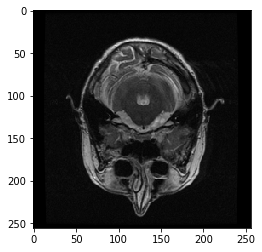

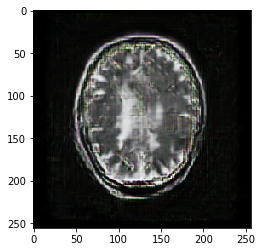

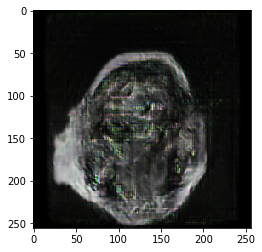

D Real: 0.13630092, D Fake: 1.0569981, G All: 2.1753068
D Real: 0.659533, D Fake: 0.4880367, G All: 2.2698164
D Real: 0.4850837, D Fake: 0.19520961, G All: 2.9187403
D Real: 0.34127516, D Fake: 0.30038196, G All: 2.7025323
D Real: 0.060077816, D Fake: 0.061094034, G All: 3.1869018
D Real: 0.24112746, D Fake: 0.1316511, G All: 3.5996664
D Real: 0.25688487, D Fake: 0.07601525, G All: 3.3065162
D Real: 0.08521819, D Fake: 0.17833206, G All: 2.8225863
D Real: 0.9021824, D Fake: 0.2813694, G All: 3.4873028
D Real: 0.5917662, D Fake: 0.13564485, G All: 2.0500743
D Real: 0.31478965, D Fake: 0.17256635, G All: 1.8876021
D Real: 0.049858734, D Fake: 0.41828355, G All: 1.1940932
D Real: 0.3828839, D Fake: 0.22513387, G All: 2.3536015
D Real: 0.45514995, D Fake: 0.36374152, G All: 1.5217584
D Real: 0.1455499, D Fake: 0.4758895, G All: 1.6895331
D Real: 0.22644834, D Fake: 0.27500474, G All: 2.0463548
D Real: 0.21722609, D Fake: 0.3074763, G All: 1.6985133
D Real: 0.039900325, D Fake: 0.120067164,

D Real: 0.58201504, D Fake: 0.14347321, G All: 2.63901
D Real: 0.65479743, D Fake: 0.2110121, G All: 2.087978
D Real: 0.18629491, D Fake: 0.5307002, G All: 1.7649775
D Real: 0.5483875, D Fake: 0.095879726, G All: 1.7364876
D Real: 0.30401093, D Fake: 0.2452861, G All: 2.090427
D Real: 0.043673813, D Fake: 0.62633383, G All: 1.9692986
D Real: 0.07487556, D Fake: 0.28027725, G All: 2.4873815
D Real: 0.27300936, D Fake: 0.38264316, G All: 2.0814319
D Real: 0.10788872, D Fake: 0.22446084, G All: 3.582461
D Real: 0.89593077, D Fake: 0.24134544, G All: 2.8207102
D Real: 0.13336153, D Fake: 0.06995956, G All: 3.676483
D Real: 0.32398516, D Fake: 0.03649223, G All: 3.4521687
D Real: 0.67045677, D Fake: 0.06592403, G All: 2.5452044
D Real: 0.19227818, D Fake: 0.10423428, G All: 2.090757
D Real: 0.037233442, D Fake: 0.6188847, G All: 1.8025393
D Real: 0.24060258, D Fake: 0.3490357, G All: 1.4878001
D Real: 0.050590012, D Fake: 0.76190937, G All: 2.3041258
D Real: 0.24455214, D Fake: 0.9692554, G

D Real: 0.37623972, D Fake: 0.41312903, G All: 2.142079
D Real: 0.67362565, D Fake: 0.41008937, G All: 1.7969453
D Real: 0.12557495, D Fake: 1.0163546, G All: 3.0070763
D Real: 0.12274051, D Fake: 0.22191374, G All: 3.1246614
D Real: 0.4168378, D Fake: 0.09453402, G All: 3.6845605
D Real: 0.5094428, D Fake: 0.27795172, G All: 3.9394684
D Real: 0.40037796, D Fake: 0.08362273, G All: 3.725661
D Real: 0.6828717, D Fake: 0.104088396, G All: 2.5747948
D Real: 0.14181715, D Fake: 0.28768185, G All: 2.044998
D Real: 0.31797382, D Fake: 0.5845985, G All: 2.1740553
D Real: 0.3239222, D Fake: 0.36543214, G All: 2.784695
D Real: 0.6093308, D Fake: 0.9164903, G All: 2.5768595
D Real: 0.28366885, D Fake: 0.49042267, G All: 2.7560906
D Real: 0.5837558, D Fake: 0.16699903, G All: 2.355348
D Real: 0.12049271, D Fake: 0.22212943, G All: 2.359993
D Real: 0.32597408, D Fake: 0.45425898, G All: 2.6613393
D Real: 0.70624924, D Fake: 0.1803882, G All: 1.9722884
D Real: 0.2299044, D Fake: 0.28050512, G All: 

D Real: 0.53023905, D Fake: 0.4838418, G All: 1.9917656
D Real: 0.27112216, D Fake: 0.21119955, G All: 2.6849875
D Real: 0.13442461, D Fake: 0.0939663, G All: 2.8272843
D Real: 0.78040016, D Fake: 0.28449547, G All: 1.6509461
D Real: 0.7704973, D Fake: 0.26931253, G All: 2.3617966
D Real: 0.059415, D Fake: 0.26550817, G All: 1.0004282
D Real: 0.19799535, D Fake: 0.3737469, G All: 1.5839226
D Real: 0.097667284, D Fake: 0.83844364, G All: 1.595931
D Real: 0.037005518, D Fake: 1.5102754, G All: 2.5364347
D Real: 0.92449844, D Fake: 0.10705521, G All: 2.9746652
D Real: 1.3176465, D Fake: 0.11223297, G All: 2.3564293
D Real: 0.42828816, D Fake: 0.31114203, G All: 1.2324896
D Real: 0.6479784, D Fake: 0.49072087, G All: 2.3628483
D Real: 0.16613425, D Fake: 0.37476617, G All: 1.8679969
D Real: 0.48549885, D Fake: 0.14788353, G All: 2.182145
D Real: 0.032972682, D Fake: 0.36099064, G All: 1.3079584
D Real: 0.05362274, D Fake: 0.404396, G All: 2.333363
D Real: 0.07137807, D Fake: 0.22864674, G 

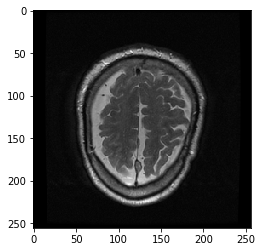

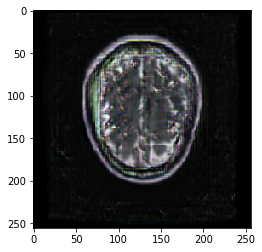

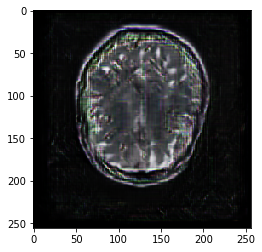

D Real: 0.51921594, D Fake: 0.31587455, G All: 2.7644622
D Real: 0.4889711, D Fake: 0.18540217, G All: 2.4998145
D Real: 0.47060722, D Fake: 0.08406059, G All: 2.693594
D Real: 0.092367105, D Fake: 0.4721101, G All: 2.9124646
D Real: 0.19628873, D Fake: 0.46520618, G All: 3.8140213
D Real: 0.85529894, D Fake: 0.39682984, G All: 3.319737
D Real: 0.044880543, D Fake: 0.185546, G All: 2.0826893
D Real: 0.95854723, D Fake: 0.10278718, G All: 2.8736808
D Real: 0.21954298, D Fake: 0.123481154, G All: 2.768269
D Real: 0.16907014, D Fake: 0.114701845, G All: 2.0419538
D Real: 0.16693759, D Fake: 0.11440271, G All: 2.3987846
D Real: 0.7644428, D Fake: 0.85140514, G All: 2.1289494
D Real: 0.338116, D Fake: 0.22099766, G All: 2.144101
D Real: 0.116268985, D Fake: 0.5093596, G All: 1.8452907
D Real: 0.18835527, D Fake: 0.19775298, G All: 2.0029361
D Real: 0.16293977, D Fake: 0.6296976, G All: 2.6957505
D Real: 0.575333, D Fake: 0.04903643, G All: 3.7361484
D Real: 0.38344026, D Fake: 0.35159183, G

D Real: 0.070273995, D Fake: 0.24922404, G All: 1.8527675
D Real: 0.088642664, D Fake: 0.36822206, G All: 3.3179278
D Real: 0.29357538, D Fake: 0.84146893, G All: 2.6576202
D Real: 0.56956625, D Fake: 0.14627603, G All: 3.673911
D Real: 0.5892583, D Fake: 0.3932026, G All: 3.3644269
D Real: 0.4227934, D Fake: 0.22690976, G All: 1.9370801
D Real: 0.5211403, D Fake: 0.32722354, G All: 2.259085
D Real: 0.42311877, D Fake: 0.39761204, G All: 2.3711047
D Real: 0.4712011, D Fake: 0.6115152, G All: 1.9210213
D Real: 0.2397704, D Fake: 0.24599192, G All: 2.024499
D Real: 0.036303043, D Fake: 0.3541804, G All: 2.556746
D Real: 0.10862281, D Fake: 0.22570251, G All: 2.7895317
D Real: 0.06194548, D Fake: 0.38341635, G All: 3.1754026
D Real: 0.828199, D Fake: 0.094926134, G All: 3.690755
D Real: 1.1768417, D Fake: 0.26583296, G All: 3.5601337
D Real: 1.4099576, D Fake: 0.17734343, G All: 2.5346236
D Real: 0.18717307, D Fake: 0.18208143, G All: 2.0872903
D Real: 0.26972657, D Fake: 0.64327246, G Al

D Real: 0.122164175, D Fake: 0.18236569, G All: 2.1592622
D Real: 0.039234996, D Fake: 0.49701166, G All: 2.4633107
D Real: 0.19360209, D Fake: 0.07358061, G All: 2.029342
D Real: 0.08250962, D Fake: 0.11710077, G All: 2.7856662
D Real: 0.8147361, D Fake: 0.13484323, G All: 2.9192863
D Real: 0.45088133, D Fake: 0.57017684, G All: 2.6832175
D Real: 0.5364107, D Fake: 0.3956694, G All: 2.1350434
D Real: 0.5243939, D Fake: 0.37317175, G All: 2.4968367
D Real: 0.14450318, D Fake: 0.5995303, G All: 2.7498596
D Real: 0.033255123, D Fake: 0.14175253, G All: 2.0497036
D Real: 0.3719052, D Fake: 0.11368011, G All: 3.076251
D Real: 0.6637706, D Fake: 0.057346925, G All: 2.8353376
D Real: 0.07920882, D Fake: 0.08281536, G All: 2.9357648
D Real: 0.11637128, D Fake: 0.09236732, G All: 2.5787416
D Real: 0.053645432, D Fake: 0.4314487, G All: 2.6228642
D Real: 0.66297793, D Fake: 0.15238515, G All: 1.9255502
D Real: 0.19951414, D Fake: 0.24629042, G All: 2.2641726
D Real: 0.052225135, D Fake: 0.35677

D Real: 0.20973186, D Fake: 0.18779883, G All: 3.1712317
D Real: 0.5285492, D Fake: 0.087491706, G All: 4.000247
D Real: 0.5492583, D Fake: 0.10351117, G All: 3.6401753
D Real: 0.801889, D Fake: 0.1608746, G All: 2.930097
D Real: 0.24177718, D Fake: 0.111885585, G All: 1.8270086
D Real: 0.7124424, D Fake: 0.294707, G All: 1.516851
D Real: 0.05895577, D Fake: 0.27444994, G All: 1.5995958
D Real: 0.43594354, D Fake: 0.81718814, G All: 1.4047474
D Real: 0.052448757, D Fake: 1.0784564, G All: 0.95940423
D Real: 0.04497664, D Fake: 1.4952698, G All: 1.8635077
D Real: 0.06689257, D Fake: 0.4467757, G All: 2.9425688
D Real: 0.9887121, D Fake: 0.11350505, G All: 3.5963955
D Real: 0.038575612, D Fake: 0.07141944, G All: 4.6879907
D Real: 0.5111606, D Fake: 0.06419017, G All: 4.230345
D Real: 0.8841893, D Fake: 0.084861614, G All: 3.3753443
D Real: 0.091170594, D Fake: 0.10139084, G All: 3.2049887
D Real: 0.78390914, D Fake: 0.14456406, G All: 2.5415964
D Real: 0.28273794, D Fake: 0.6647819, G A

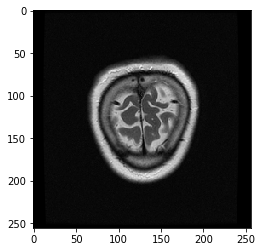

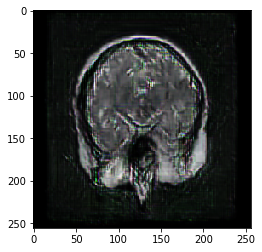

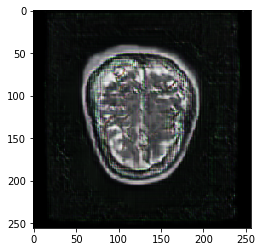

D Real: 0.26014388, D Fake: 0.30696127, G All: 1.9667029
D Real: 0.12320973, D Fake: 0.34530762, G All: 2.7637348
D Real: 0.33970818, D Fake: 0.18968491, G All: 2.434184
D Real: 0.25169387, D Fake: 0.07779369, G All: 3.4151456
D Real: 0.13264246, D Fake: 0.099481195, G All: 2.491944
D Real: 0.3332949, D Fake: 0.11477523, G All: 2.3312569
D Real: 0.058330506, D Fake: 0.72167253, G All: 2.4271894
D Real: 0.29044357, D Fake: 0.13568328, G All: 2.6692479
D Real: 0.25167882, D Fake: 0.14196904, G All: 2.7987778
D Real: 0.2126634, D Fake: 0.22801542, G All: 2.5504556
D Real: 0.39365524, D Fake: 0.5037054, G All: 1.7518252
D Real: 0.10860878, D Fake: 0.3781433, G All: 2.5285025
D Real: 0.11399936, D Fake: 0.0610371, G All: 2.284613
D Real: 0.034149777, D Fake: 0.117688045, G All: 3.1417866
D Real: 0.46555847, D Fake: 0.11445732, G All: 3.6418095
D Real: 0.9321548, D Fake: 0.29672796, G All: 2.3736615
D Real: 0.957232, D Fake: 0.096979626, G All: 1.6799133
D Real: 0.23975882, D Fake: 1.3645797

D Real: 0.09828329, D Fake: 0.2144965, G All: 2.7252975
D Real: 0.45538753, D Fake: 0.053403776, G All: 3.3864746
D Real: 1.2787633, D Fake: 0.045769125, G All: 3.793777
D Real: 0.210206, D Fake: 0.13807747, G All: 2.646218
D Real: 0.21991454, D Fake: 0.26006043, G All: 2.4524488
D Real: 0.13323131, D Fake: 0.40735734, G All: 2.6760917
D Real: 0.61608297, D Fake: 0.3884582, G All: 2.2554758
D Real: 0.11904153, D Fake: 0.46347952, G All: 2.2222571
D Real: 0.2347146, D Fake: 0.48255727, G All: 2.5967007
D Real: 0.10310653, D Fake: 0.1533981, G All: 2.4072287
D Real: 0.19191994, D Fake: 0.14179127, G All: 3.0175707
D Real: 0.9609058, D Fake: 0.11762369, G All: 3.0076184
D Real: 0.16198088, D Fake: 0.31764457, G All: 2.1942294
D Real: 0.45673138, D Fake: 0.70428663, G All: 2.4199536
D Real: 0.07130685, D Fake: 0.630062, G All: 2.9708705
D Real: 0.1535456, D Fake: 0.2004624, G All: 2.8824706
D Real: 0.1538329, D Fake: 0.54222304, G All: 3.0620675
D Real: 0.4009402, D Fake: 0.07118121, G All

D Real: 0.4168028, D Fake: 0.4749261, G All: 2.134645
D Real: 0.2824407, D Fake: 0.26058114, G All: 0.928275
D Real: 0.3286549, D Fake: 0.884395, G All: 1.3272436
D Real: 0.04217424, D Fake: 0.43927747, G All: 1.6878988
D Real: 0.2986415, D Fake: 0.33553633, G All: 2.4025269
D Real: 0.25963488, D Fake: 0.39815956, G All: 2.109991
D Real: 0.43282872, D Fake: 0.37742788, G All: 2.0215347
D Real: 0.117786765, D Fake: 0.12606567, G All: 2.6883845
D Real: 0.09118027, D Fake: 0.17874365, G All: 2.9721408
D Real: 0.09460788, D Fake: 0.13821368, G All: 3.6415222
D Real: 0.32810807, D Fake: 0.19760874, G All: 2.9634926
D Real: 0.44005275, D Fake: 0.109518915, G All: 3.272394
D Real: 0.39716762, D Fake: 0.16761719, G All: 3.6843617
D Real: 0.5382439, D Fake: 0.20101249, G All: 2.6101825
D Real: 0.080906466, D Fake: 0.20256428, G All: 2.8733792
D Real: 0.08770263, D Fake: 0.29698753, G All: 2.0902739
D Real: 0.6756835, D Fake: 0.7439637, G All: 2.2255106
D Real: 0.04160772, D Fake: 0.4511362, G A

D Real: 0.08464767, D Fake: 0.14752707, G All: 2.6484847
D Real: 0.16039845, D Fake: 0.114115685, G All: 2.481244
D Real: 0.20187661, D Fake: 0.124666184, G All: 2.3695111
D Real: 0.08149466, D Fake: 0.11612593, G All: 2.3251104
D Real: 0.7296664, D Fake: 0.5022911, G All: 1.9052719
D Real: 0.07376082, D Fake: 0.1849952, G All: 2.3841476
D Real: 0.052417487, D Fake: 0.45365047, G All: 1.6585498
D Real: 0.05856911, D Fake: 0.4251988, G All: 2.7288089
D Real: 0.29597682, D Fake: 0.28288805, G All: 3.4481926
D Real: 0.13382562, D Fake: 0.18217845, G All: 3.8714664
D Real: 0.35211405, D Fake: 0.053169057, G All: 2.8859537
D Real: 1.050351, D Fake: 0.28486243, G All: 1.8311554
D Real: 0.23440832, D Fake: 0.07706618, G All: 1.8481148
D Real: 0.24839926, D Fake: 0.37769145, G All: 1.9257884
D Real: 0.12787752, D Fake: 0.43237633, G All: 1.7488456
D Real: 0.31144974, D Fake: 0.664316, G All: 2.1407506
D Real: 0.13825089, D Fake: 0.6217613, G All: 2.515441
D Real: 0.07556687, D Fake: 0.11873862

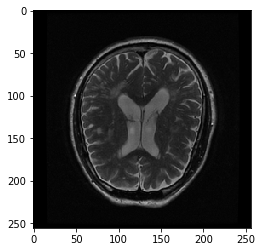

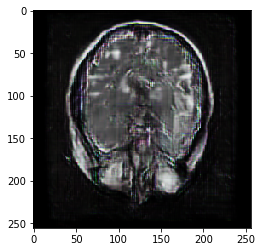

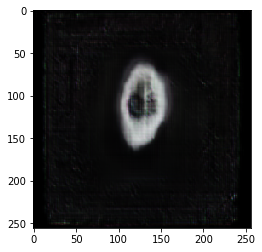

D Real: 0.041242532, D Fake: 0.7830345, G All: 1.5411775
D Real: 0.14548281, D Fake: 0.6857905, G All: 2.0862288
D Real: 0.040106773, D Fake: 0.17492715, G All: 3.1631353
D Real: 0.3096354, D Fake: 0.4633397, G All: 4.050225
D Real: 0.18557838, D Fake: 0.046821754, G All: 4.1173406
D Real: 0.1764716, D Fake: 0.05931917, G All: 5.163786
D Real: 0.05106493, D Fake: 0.039720364, G All: 5.577183
D Real: 1.1670027, D Fake: 0.0364548, G All: 4.279278
D Real: 0.081529245, D Fake: 0.16102469, G All: 4.081458
D Real: 0.48944724, D Fake: 0.06853249, G All: 4.29385
D Real: 0.40399835, D Fake: 0.10663891, G All: 2.9788654
D Real: 0.14469798, D Fake: 0.6379681, G All: 1.9783754
D Real: 0.13823012, D Fake: 0.34927905, G All: 2.1694155
D Real: 0.1002979, D Fake: 0.2908463, G All: 2.9433455
D Real: 0.09077911, D Fake: 0.8181148, G All: 2.15242
D Real: 0.17988512, D Fake: 0.196518, G All: 3.1240785
D Real: 0.25671798, D Fake: 0.43662646, G All: 3.1022716
D Real: 0.21112558, D Fake: 0.22461887, G All: 3

D Real: 0.18371177, D Fake: 0.113884844, G All: 3.3093715
D Real: 0.090270355, D Fake: 0.16867882, G All: 3.0766482
D Real: 0.72883856, D Fake: 1.1205084, G All: 2.3760056
D Real: 0.057464704, D Fake: 0.17828438, G All: 2.893765
D Real: 0.46957764, D Fake: 0.50837433, G All: 3.3678877
D Real: 0.30546612, D Fake: 0.04340599, G All: 3.3838706
D Real: 0.44347474, D Fake: 0.08600458, G All: 3.4987247
D Real: 0.27709153, D Fake: 0.21196346, G All: 3.562503
D Real: 0.09358478, D Fake: 0.17701758, G All: 2.6216807
D Real: 0.06926742, D Fake: 0.33220896, G All: 2.9260318
D Real: 0.07160106, D Fake: 0.10133835, G All: 3.3534489
D Real: 0.16236584, D Fake: 0.31380606, G All: 2.8826888
D Real: 0.11493089, D Fake: 0.05490767, G All: 3.3866644
D Real: 0.32781017, D Fake: 0.052676246, G All: 3.380446
D Real: 0.38669032, D Fake: 0.13712505, G All: 3.0424638
D Real: 0.061641984, D Fake: 0.10873898, G All: 3.168085
D Real: 0.1223498, D Fake: 0.33544925, G All: 2.355388
D Real: 0.08889663, D Fake: 0.443

D Real: 0.47013265, D Fake: 0.27300632, G All: 2.3526578
D Real: 0.03409179, D Fake: 0.2967453, G All: 1.9740117
D Real: 0.31441242, D Fake: 0.7746883, G All: 1.5215858
D Real: 0.037465524, D Fake: 0.3946948, G All: 2.621809
D Real: 0.1764447, D Fake: 0.43764222, G All: 2.9659998
D Real: 0.2679358, D Fake: 0.06302455, G All: 3.077069
D Real: 0.15558046, D Fake: 0.05205699, G All: 3.5100985
D Real: 0.84346676, D Fake: 0.12540007, G All: 2.7442856
D Real: 0.101199314, D Fake: 0.6149805, G All: 2.4149108
D Real: 0.37233025, D Fake: 0.3357278, G All: 2.4504743
D Real: 0.10592072, D Fake: 0.19257474, G All: 2.693953
D Real: 0.37609297, D Fake: 0.55091304, G All: 2.592866
D Real: 0.26739025, D Fake: 0.2076517, G All: 2.6023726
D Real: 0.717532, D Fake: 0.5651916, G All: 2.3910866
D Real: 0.03153357, D Fake: 0.21400766, G All: 2.5037909
D Real: 0.2010954, D Fake: 0.7544124, G All: 3.1868522
D Real: 1.0919371, D Fake: 0.19358087, G All: 2.5638459
D Real: 0.8746165, D Fake: 0.45260248, G All: 1

D Real: 0.07329926, D Fake: 0.80456245, G All: 2.388161
D Real: 0.35148075, D Fake: 0.16152234, G All: 2.2784734
D Real: 0.45797592, D Fake: 0.07396527, G All: 2.7132387
D Real: 0.09216878, D Fake: 0.20852835, G All: 3.2281969
D Real: 0.18416673, D Fake: 0.09431625, G All: 2.8896756
D Real: 0.33237118, D Fake: 0.13767089, G All: 2.4122877
D Real: 0.7563338, D Fake: 0.11794041, G All: 2.6506085
D Real: 0.17996716, D Fake: 0.07850325, G All: 1.6880231
D Real: 1.5462836, D Fake: 0.19630358, G All: 1.1754057
D Real: 0.12796919, D Fake: 1.3337163, G All: 1.2808385
D Real: 0.030943256, D Fake: 0.26490447, G All: 1.1825883
D Real: 0.10487198, D Fake: 0.4618249, G All: 2.233879
D Real: 0.2363489, D Fake: 0.79081655, G All: 1.8914936
D Real: 0.4252567, D Fake: 0.32908577, G All: 1.7042227
D Real: 0.03481279, D Fake: 0.060301524, G All: 3.473185
D Real: 0.14090526, D Fake: 0.22487132, G All: 3.4641523
D Real: 0.79305387, D Fake: 0.084490165, G All: 3.8602867
D Real: 0.43842256, D Fake: 0.1372307

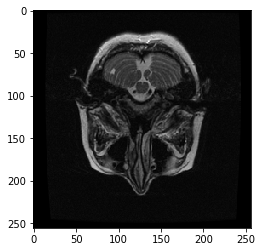

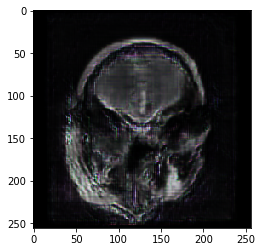

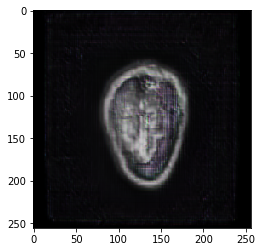

D Real: 0.1499653, D Fake: 0.32911998, G All: 1.9930025
D Real: 0.35843274, D Fake: 0.66622806, G All: 3.0804281
D Real: 0.27762136, D Fake: 0.17483847, G All: 2.0471036
D Real: 0.21983951, D Fake: 0.10459564, G All: 1.8397948
D Real: 0.7131695, D Fake: 0.19310413, G All: 2.0438788
D Real: 0.11831564, D Fake: 0.2706954, G All: 2.458929
D Real: 0.5971039, D Fake: 0.10583842, G All: 2.035769
D Real: 0.080464326, D Fake: 0.33657917, G All: 2.591906
D Real: 0.081112206, D Fake: 0.4554268, G All: 1.9081502
D Real: 0.050329845, D Fake: 0.3141, G All: 2.5069823
D Real: 0.12406485, D Fake: 0.14615184, G All: 2.816217
D Real: 0.16290718, D Fake: 0.14785342, G All: 2.9046488
D Real: 0.52199847, D Fake: 0.4675765, G All: 3.539744
D Real: 0.74180186, D Fake: 0.3040796, G All: 2.9517643
D Real: 0.5706499, D Fake: 0.36459532, G All: 2.5397282
D Real: 0.09659642, D Fake: 0.2261712, G All: 2.6302977
D Real: 0.05448521, D Fake: 0.26640213, G All: 2.6306403
D Real: 0.36234492, D Fake: 0.31509978, G All:

D Real: 0.06983386, D Fake: 0.115050934, G All: 2.0791144
D Real: 0.04584001, D Fake: 0.3668247, G All: 2.888169
D Real: 0.6052242, D Fake: 0.13026871, G All: 2.3552198
D Real: 0.034306414, D Fake: 0.37737662, G All: 2.49945
D Real: 0.04718834, D Fake: 0.25845945, G All: 3.2550945
D Real: 0.039396897, D Fake: 0.18948433, G All: 2.429936
D Real: 0.48756802, D Fake: 0.1181446, G All: 2.913578
D Real: 0.2896135, D Fake: 0.16283742, G All: 4.5254683
D Real: 0.21888596, D Fake: 0.07671863, G All: 2.7493317
D Real: 0.1474095, D Fake: 0.14949295, G All: 2.401713
D Real: 0.06498705, D Fake: 0.39779538, G All: 2.9140334
D Real: 0.32096177, D Fake: 0.13762638, G All: 3.2409327
D Real: 0.363208, D Fake: 0.32566354, G All: 3.5602531
D Real: 0.11232234, D Fake: 0.15622309, G All: 3.4984102
D Real: 0.22736113, D Fake: 0.25139415, G All: 2.7504568
D Real: 0.2573362, D Fake: 0.0887793, G All: 3.2415624
D Real: 0.17953616, D Fake: 0.5052756, G All: 3.4336102
D Real: 0.4910825, D Fake: 0.23044208, G All

D Real: 0.058166735, D Fake: 0.22566207, G All: 3.3374772
D Real: 0.32894117, D Fake: 0.049141783, G All: 3.1350555
D Real: 0.06593834, D Fake: 0.06337817, G All: 2.843454
D Real: 0.19912797, D Fake: 0.41183963, G All: 2.694998
D Real: 0.45972788, D Fake: 0.29932848, G All: 2.9137309
D Real: 0.13186468, D Fake: 0.18993762, G All: 2.7531211
D Real: 0.21637252, D Fake: 0.30094728, G All: 2.7437959
D Real: 0.074569866, D Fake: 0.33466476, G All: 2.6739087
D Real: 0.05968097, D Fake: 0.044728175, G All: 2.83811
D Real: 0.090764165, D Fake: 0.3742597, G All: 2.354869
D Real: 0.07904769, D Fake: 0.06253351, G All: 3.3186045
D Real: 0.7346433, D Fake: 0.1608884, G All: 2.5528655
D Real: 0.18784863, D Fake: 0.43317497, G All: 2.73079
D Real: 0.042569414, D Fake: 0.100392856, G All: 3.2436628
D Real: 0.16918612, D Fake: 0.13598336, G All: 3.224029
D Real: 0.21163183, D Fake: 0.09626201, G All: 2.3113174
D Real: 0.1005778, D Fake: 0.6164104, G All: 2.167009
D Real: 0.38189122, D Fake: 0.05273432

D Real: 0.052146032, D Fake: 0.38822794, G All: 3.3441167
D Real: 0.031978346, D Fake: 0.22672695, G All: 1.6883154
D Real: 0.16073395, D Fake: 0.44148174, G All: 1.9560412
D Real: 0.057034634, D Fake: 0.13180366, G All: 3.3706002
D Real: 0.4114546, D Fake: 0.066571064, G All: 3.477357
D Real: 1.0719016, D Fake: 0.1819946, G All: 3.2515655
D Real: 0.057664335, D Fake: 0.06055452, G All: 2.198123
D Real: 0.6679466, D Fake: 0.3764916, G All: 2.7103462
D Real: 0.33711684, D Fake: 0.85714674, G All: 2.1404734
D Real: 0.20461048, D Fake: 0.30157012, G All: 2.9405813
D Real: 0.7801466, D Fake: 0.1898734, G All: 1.6457255
D Real: 0.018994106, D Fake: 0.22803715, G All: 3.068153
D Real: 0.05117383, D Fake: 0.25952563, G All: 3.4285188
D Real: 0.1987656, D Fake: 0.05010675, G All: 3.0780783
D Real: 0.19987324, D Fake: 0.122033745, G All: 3.876821
D Real: 0.96702147, D Fake: 0.21355984, G All: 2.9439676
D Real: 0.27153736, D Fake: 0.09459087, G All: 3.013761
D Real: 0.4496893, D Fake: 0.18033981

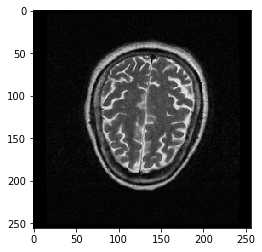

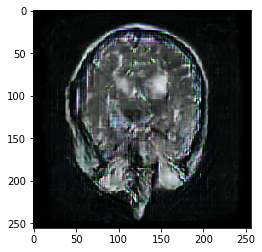

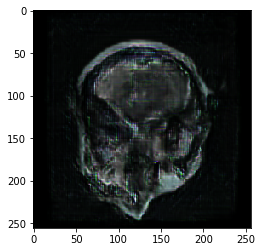

D Real: 0.24325463, D Fake: 0.12349297, G All: 2.6846719
D Real: 0.43571126, D Fake: 0.2889698, G All: 2.1863163
D Real: 0.5600765, D Fake: 0.3309679, G All: 1.4809144
D Real: 0.20175008, D Fake: 0.4136372, G All: 1.8826648
D Real: 0.21462178, D Fake: 0.29085955, G All: 2.301859
D Real: 0.586445, D Fake: 0.3102155, G All: 1.7111843
D Real: 0.080301285, D Fake: 0.40150982, G All: 2.38399
D Real: 0.09702608, D Fake: 0.15499441, G All: 3.0313694
D Real: 0.28281558, D Fake: 0.324291, G All: 3.3905334
D Real: 0.38746187, D Fake: 0.08151114, G All: 3.4730787
D Real: 0.45468718, D Fake: 0.045685276, G All: 2.5436687
D Real: 0.12909058, D Fake: 0.2287315, G All: 2.2155771
D Real: 0.15248087, D Fake: 0.33520338, G All: 2.0253425
D Real: 0.17140096, D Fake: 0.46854365, G All: 1.6051128
D Real: 0.06729714, D Fake: 0.30284208, G All: 2.2833252
D Real: 0.6507469, D Fake: 0.34237218, G All: 2.3038836
D Real: 0.106748715, D Fake: 0.19364558, G All: 2.1021576
D Real: 0.23042446, D Fake: 0.15712832, G 

D Real: 0.33770254, D Fake: 0.12695852, G All: 2.8392854
D Real: 0.35902214, D Fake: 0.19164646, G All: 2.477759
D Real: 0.7399662, D Fake: 0.338839, G All: 1.7204359
D Real: 0.05693487, D Fake: 0.7158234, G All: 1.8892746
D Real: 0.39915454, D Fake: 0.13900273, G All: 1.7997861
D Real: 0.058953203, D Fake: 0.73508894, G All: 2.575237
D Real: 0.38045985, D Fake: 0.20464283, G All: 2.870016
D Real: 0.22068036, D Fake: 0.14990222, G All: 2.8571973
D Real: 0.49130383, D Fake: 0.054963067, G All: 2.888233
D Real: 0.100589216, D Fake: 0.16742241, G All: 2.6188438
D Real: 0.64689773, D Fake: 0.17715687, G All: 2.8842316
D Real: 0.045054123, D Fake: 0.127222, G All: 2.0521803
D Real: 0.06458892, D Fake: 0.09455016, G All: 2.7789814
D Real: 0.86445296, D Fake: 0.24609664, G All: 2.1690025
D Real: 0.46387178, D Fake: 0.33683187, G All: 1.6655037
D Real: 0.15319256, D Fake: 0.25321466, G All: 1.6338048
D Real: 0.12280435, D Fake: 0.6023565, G All: 1.5603273
D Real: 0.055315148, D Fake: 0.7282967

D Real: 0.18155709, D Fake: 0.2104375, G All: 3.1971455
D Real: 0.33804125, D Fake: 0.18558726, G All: 2.9605088
D Real: 0.23409075, D Fake: 0.082793035, G All: 3.1990044
D Real: 0.60005355, D Fake: 0.0885241, G All: 2.8894005
D Real: 0.66330314, D Fake: 0.31182972, G All: 2.8537304
D Real: 0.19337767, D Fake: 0.895325, G All: 2.0896924
D Real: 0.09140419, D Fake: 0.4523824, G All: 1.8972502
D Real: 0.23658076, D Fake: 0.21259667, G All: 3.0493288
D Real: 0.05537209, D Fake: 0.11966502, G All: 3.1666217
D Real: 0.050653417, D Fake: 0.38726535, G All: 3.0677361
D Real: 0.32270288, D Fake: 0.18922608, G All: 3.5543783
D Real: 0.47897792, D Fake: 0.56619143, G All: 4.372016
D Real: 0.38900155, D Fake: 0.2198258, G All: 3.2850325
D Real: 0.051786363, D Fake: 0.07367441, G All: 3.8889022
D Real: 0.53572077, D Fake: 0.107934795, G All: 3.5986767
D Real: 1.0851512, D Fake: 0.103143565, G All: 2.7870352
D Real: 0.6700686, D Fake: 0.4416272, G All: 1.7598293
D Real: 0.06696011, D Fake: 0.519814

D Real: 0.053043455, D Fake: 0.3293077, G All: 3.1728735
D Real: 0.36547616, D Fake: 0.2518637, G All: 3.4213676
D Real: 0.7677697, D Fake: 0.06845219, G All: 4.1647587
D Real: 0.16588369, D Fake: 0.10909951, G All: 2.7086155
D Real: 0.10744052, D Fake: 0.14215304, G All: 2.4854784
D Real: 1.4084795, D Fake: 0.15656734, G All: 2.8334754
D Real: 0.15074864, D Fake: 0.3649534, G All: 2.0623107
D Real: 0.0784671, D Fake: 0.4413786, G All: 1.7250252
D Real: 0.42154378, D Fake: 0.4080776, G All: 2.160049
D Real: 0.03442689, D Fake: 0.12391928, G All: 2.0584147
D Real: 0.03529948, D Fake: 0.08466683, G All: 1.9514285
D Real: 0.2296112, D Fake: 0.442625, G All: 1.2926282
D Real: 0.2209521, D Fake: 0.17744045, G All: 2.5913873
D Real: 0.08207334, D Fake: 0.24892144, G All: 2.5001388
D Real: 0.104706936, D Fake: 0.29084367, G All: 2.799521
D Real: 0.38679075, D Fake: 0.1369426, G All: 2.666585
D Real: 1.212256, D Fake: 0.16774642, G All: 2.8043242
D Real: 0.6166687, D Fake: 0.37130958, G All: 3

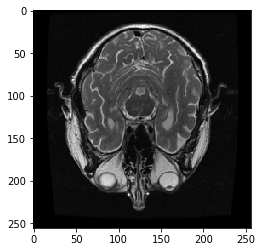

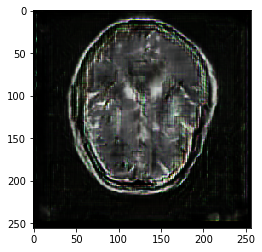

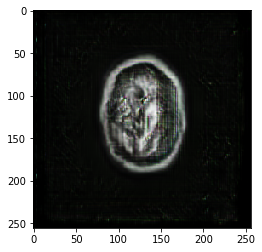

D Real: 0.2533202, D Fake: 0.21040215, G All: 2.2868648
D Real: 0.29212254, D Fake: 0.3769468, G All: 2.9241967
D Real: 0.46207237, D Fake: 0.18245935, G All: 3.6148305
D Real: 0.087412626, D Fake: 0.09047665, G All: 3.034109
D Real: 0.63376665, D Fake: 0.13883694, G All: 3.5525014
D Real: 0.35993475, D Fake: 0.25808606, G All: 2.9295201
D Real: 0.24318404, D Fake: 0.13343832, G All: 3.372664
D Real: 0.22957548, D Fake: 0.2552845, G All: 3.1265259
D Real: 0.5061674, D Fake: 0.34358257, G All: 2.9241247
D Real: 0.07612266, D Fake: 0.3144269, G All: 2.722908
D Real: 0.105917156, D Fake: 0.06474577, G All: 2.5834777
D Real: 0.088483125, D Fake: 0.8303964, G All: 2.9499385
D Real: 0.12962052, D Fake: 0.6068108, G All: 3.329243
D Real: 0.06474603, D Fake: 0.19356118, G All: 3.2700593
D Real: 0.10344009, D Fake: 0.13791865, G All: 4.299035
D Real: 1.0647848, D Fake: 0.07910017, G All: 4.0966873
D Real: 0.7203938, D Fake: 0.06698644, G All: 3.4422147
D Real: 0.27059603, D Fake: 0.5133707, G A

D Real: 0.04428266, D Fake: 0.40667164, G All: 2.794118
D Real: 0.39244047, D Fake: 0.15983728, G All: 2.400032
D Real: 0.28334007, D Fake: 0.44664583, G All: 3.655765
D Real: 0.22940485, D Fake: 0.12304359, G All: 2.886407
D Real: 0.07983424, D Fake: 0.19398105, G All: 3.4385343
D Real: 0.2543279, D Fake: 0.063483946, G All: 4.0689583
D Real: 0.03389883, D Fake: 0.1028629, G All: 3.6409793
D Real: 0.5563649, D Fake: 0.051742814, G All: 2.9129934
D Real: 0.0582923, D Fake: 0.4117472, G All: 4.091399
D Real: 0.7871227, D Fake: 0.24182436, G All: 3.446497
D Real: 0.30738267, D Fake: 0.1633699, G All: 2.0230427
D Real: 0.24547145, D Fake: 0.6449553, G All: 2.3578467
D Real: 0.12616053, D Fake: 0.6258337, G All: 2.8214574
D Real: 0.22923157, D Fake: 0.108529374, G All: 2.1537545
D Real: 0.43918866, D Fake: 0.07401806, G All: 3.2599735
D Real: 1.3897252, D Fake: 0.09251142, G All: 2.1802008
D Real: 1.5933185, D Fake: 0.3219576, G All: 1.848916
D Real: 0.25506127, D Fake: 0.4390577, G All: 1

D Real: 0.14736931, D Fake: 0.08156392, G All: 3.1010408
D Real: 0.4118081, D Fake: 0.32757318, G All: 2.2018132
D Real: 1.0500429, D Fake: 0.34608948, G All: 2.0631158
D Real: 0.25715396, D Fake: 0.14785549, G All: 2.3039484
D Real: 0.09959436, D Fake: 1.0032032, G All: 1.95234
D Real: 0.05337647, D Fake: 0.1782538, G All: 2.277063
D Real: 0.05164118, D Fake: 0.079994425, G All: 2.8253922
D Real: 0.108717136, D Fake: 0.23370075, G All: 2.9465532
D Real: 0.093107365, D Fake: 0.09147777, G All: 3.4722855
D Real: 0.66120654, D Fake: 0.1218582, G All: 2.3052835
D Real: 0.13577697, D Fake: 0.083735995, G All: 2.7686808
D Real: 0.20049673, D Fake: 0.53911996, G All: 3.069808
D Real: 0.0715555, D Fake: 0.35706002, G All: 3.3347592
D Real: 0.54096377, D Fake: 0.101922125, G All: 3.0554087
D Real: 0.6283214, D Fake: 0.1495887, G All: 2.6749947
D Real: 1.2525337, D Fake: 0.4603257, G All: 2.1150846
D Real: 0.8353225, D Fake: 0.5462303, G All: 0.9043106
D Real: 0.08558212, D Fake: 0.6468953, G A

D Real: 0.21664217, D Fake: 0.9119984, G All: 2.0615513
D Real: 0.16198112, D Fake: 0.6500038, G All: 2.837402
D Real: 0.36654842, D Fake: 0.3834925, G All: 2.2161765
D Real: 0.364393, D Fake: 0.10010903, G All: 2.7495773
D Real: 0.077067986, D Fake: 0.063897036, G All: 2.0742645
D Real: 0.3565337, D Fake: 0.079482295, G All: 3.3810549
D Real: 0.09488911, D Fake: 0.2741365, G All: 3.326777
D Real: 0.71454775, D Fake: 0.3380791, G All: 2.4297502
D Real: 0.059776567, D Fake: 0.07909052, G All: 2.6534069
D Real: 0.025459992, D Fake: 0.63226247, G All: 2.6389832
D Real: 0.32109502, D Fake: 0.16056968, G All: 2.5493965
D Real: 0.48662227, D Fake: 0.5450752, G All: 2.6624904
D Real: 0.39584494, D Fake: 0.24853076, G All: 2.0656257
D Real: 0.07103399, D Fake: 0.40293548, G All: 2.5349555
D Real: 0.08770248, D Fake: 0.6076537, G All: 2.3119538
D Real: 0.62707716, D Fake: 0.09323203, G All: 2.5132298
D Real: 0.20570919, D Fake: 0.110176854, G All: 2.345549
D Real: 0.23807684, D Fake: 0.23785663

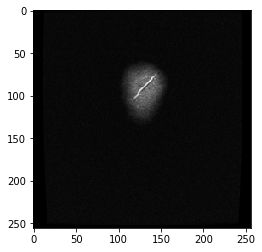

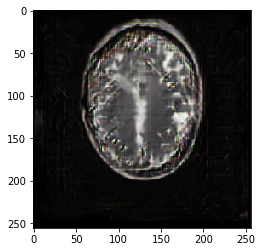

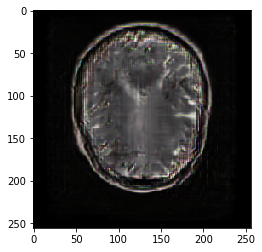

D Real: 0.5696173, D Fake: 0.17527443, G All: 2.3199854
D Real: 0.06969786, D Fake: 0.085535295, G All: 2.1683369
D Real: 0.9877821, D Fake: 0.27539974, G All: 2.1759772
D Real: 0.04850971, D Fake: 0.29068017, G All: 2.2938669
D Real: 0.09925762, D Fake: 0.37550583, G All: 2.2008257
D Real: 0.1017126, D Fake: 0.26413876, G All: 2.5670447
D Real: 0.5163189, D Fake: 0.16536804, G All: 2.6372378
D Real: 0.25536412, D Fake: 0.19181117, G All: 2.4102347
D Real: 0.10308267, D Fake: 0.40084255, G All: 3.2419157
D Real: 0.19370987, D Fake: 0.12138448, G All: 2.4426992
D Real: 0.2922727, D Fake: 0.12015242, G All: 2.6950636
D Real: 0.06736261, D Fake: 0.12598473, G All: 2.957112
D Real: 0.23644868, D Fake: 0.074549764, G All: 2.9612417
D Real: 0.4545089, D Fake: 0.21890783, G All: 2.4099488
D Real: 0.2396434, D Fake: 0.21615288, G All: 2.7269402
D Real: 0.15780476, D Fake: 0.5071972, G All: 2.8998117
D Real: 0.24693203, D Fake: 0.12889788, G All: 3.0665987
D Real: 0.24991581, D Fake: 0.18432257

D Real: 0.061015885, D Fake: 0.49401614, G All: 2.2795124
D Real: 0.9674821, D Fake: 0.34483522, G All: 1.8075764
D Real: 0.12012024, D Fake: 0.21074952, G All: 1.6465273
D Real: 0.068952374, D Fake: 0.27865198, G All: 2.1215162
D Real: 0.11441727, D Fake: 0.11385022, G All: 2.3182018
D Real: 0.11189987, D Fake: 0.39382327, G All: 2.6833627
D Real: 0.22152758, D Fake: 0.123535074, G All: 3.5971384
D Real: 0.5498905, D Fake: 0.18503785, G All: 2.339846
D Real: 0.40530115, D Fake: 0.29602587, G All: 3.4084947
D Real: 0.47405222, D Fake: 0.17969826, G All: 2.8656025
D Real: 0.18119664, D Fake: 0.3612848, G All: 3.2773545
D Real: 0.61668426, D Fake: 0.07252815, G All: 2.1154532
D Real: 1.3379468, D Fake: 0.21523279, G All: 1.1659532
D Real: 0.07614539, D Fake: 0.60172737, G All: 1.1888824
D Real: 0.12311101, D Fake: 0.50007355, G All: 0.89968216
D Real: 0.06357752, D Fake: 0.9636015, G All: 0.81421804
D Real: 0.061477907, D Fake: 0.541115, G All: 1.5750755
D Real: 0.30278993, D Fake: 0.203

D Real: 0.18364757, D Fake: 0.22395523, G All: 2.857222
D Real: 0.4866946, D Fake: 0.05774135, G All: 2.897492
D Real: 1.2481437, D Fake: 0.13093121, G All: 2.4416378
D Real: 0.49056163, D Fake: 0.20989455, G All: 1.1364118
D Real: 0.044613786, D Fake: 1.247764, G All: 1.1424845
D Real: 0.047136895, D Fake: 0.6722194, G All: 1.2669127
D Real: 0.1120447, D Fake: 0.47868747, G All: 2.5508676
D Real: 0.79650456, D Fake: 0.31653988, G All: 1.9300895
D Real: 0.28244606, D Fake: 0.604354, G All: 2.9108374
D Real: 0.041468825, D Fake: 0.124692634, G All: 2.8623986
D Real: 0.75379807, D Fake: 0.15064867, G All: 3.533996
D Real: 0.95669067, D Fake: 0.05812452, G All: 2.4828248
D Real: 0.3456651, D Fake: 0.23906386, G All: 2.5106251
D Real: 0.06175553, D Fake: 0.1904302, G All: 2.4992263
D Real: 0.3850648, D Fake: 0.88551307, G All: 1.9310288
D Real: 0.9304339, D Fake: 0.36673403, G All: 2.1337843
D Real: 0.3520794, D Fake: 0.30756032, G All: 2.0968003
D Real: 0.08827965, D Fake: 0.7568781, G Al

D Real: 0.33044136, D Fake: 0.28737417, G All: 2.5469878
D Real: 0.18787327, D Fake: 0.77478117, G All: 2.7859776
D Real: 0.17278585, D Fake: 0.13386996, G All: 1.8401091
D Real: 0.12557563, D Fake: 0.18920949, G All: 2.3843746
D Real: 0.2839802, D Fake: 0.27931127, G All: 2.4206085
D Real: 0.099877946, D Fake: 0.35212004, G All: 3.045633
D Real: 0.5452709, D Fake: 0.32423967, G All: 2.99425
D Real: 0.7758885, D Fake: 0.13839713, G All: 2.298807
D Real: 0.102901556, D Fake: 0.39678374, G All: 2.3836136
D Real: 0.21351597, D Fake: 0.23102607, G All: 2.1687279
D Real: 0.50007534, D Fake: 0.38808292, G All: 2.0539012
D Real: 0.08946076, D Fake: 0.21739614, G All: 1.9883852
D Real: 0.09827949, D Fake: 0.489446, G All: 2.5454483
D Real: 0.39817852, D Fake: 0.15116088, G All: 2.2354228
D Real: 0.16397147, D Fake: 0.2466332, G All: 2.5001574
D Real: 0.37626952, D Fake: 0.16927916, G All: 2.5099907
D Real: 0.5266656, D Fake: 0.1827928, G All: 1.9525442
D Real: 0.07141039, D Fake: 0.3709476, G 

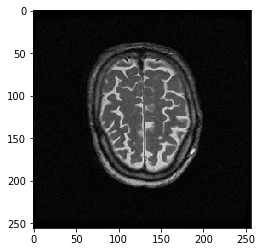

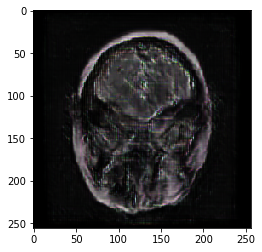

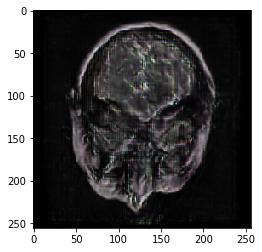

D Real: 0.15424278, D Fake: 0.35581344, G All: 2.5260153
D Real: 0.37683445, D Fake: 0.1502949, G All: 2.6776175
D Real: 0.10897307, D Fake: 0.17421821, G All: 2.2555454
D Real: 0.14456768, D Fake: 0.16809443, G All: 2.028349
D Real: 0.3424779, D Fake: 0.5359992, G All: 2.9734802
D Real: 0.21252906, D Fake: 0.3136298, G All: 2.4124599
D Real: 0.286726, D Fake: 0.52422625, G All: 2.5414665
D Real: 0.13224532, D Fake: 0.1317124, G All: 2.414474
D Real: 0.120083965, D Fake: 0.17328712, G All: 1.9652885
D Real: 0.51755667, D Fake: 0.4930457, G All: 2.2451673
D Real: 0.5748973, D Fake: 0.49258292, G All: 2.4571924
D Real: 0.3765512, D Fake: 0.24359673, G All: 2.4958887
D Real: 0.25051445, D Fake: 0.19619101, G All: 2.6046538
D Real: 0.759547, D Fake: 1.0929114, G All: 1.9699829
D Real: 0.14246501, D Fake: 0.26954624, G All: 1.5484188
D Real: 0.5607514, D Fake: 0.67749345, G All: 1.9545685
D Real: 0.42944488, D Fake: 0.9265105, G All: 2.7072592
D Real: 0.053658083, D Fake: 0.36115408, G All:

D Real: 0.624851, D Fake: 0.6451926, G All: 2.088846
D Real: 0.08814516, D Fake: 0.7224723, G All: 1.6416166
D Real: 0.056296393, D Fake: 0.32736415, G All: 2.2482066
D Real: 0.13817126, D Fake: 0.16773891, G All: 3.1080883
D Real: 0.36227533, D Fake: 0.33395988, G All: 2.4738371
D Real: 0.6643561, D Fake: 0.15322769, G All: 2.7814565
D Real: 0.3604808, D Fake: 0.17112294, G All: 2.4053116
D Real: 0.08403194, D Fake: 0.20556533, G All: 2.8050966
D Real: 0.19303286, D Fake: 0.2756279, G All: 2.9531941
D Real: 0.5625398, D Fake: 0.50431603, G All: 2.5860906
D Real: 0.24033374, D Fake: 0.78543854, G All: 2.4856143
D Real: 0.4492398, D Fake: 0.8041325, G All: 2.3475356
D Real: 0.04240148, D Fake: 0.28008103, G All: 2.7944095
D Real: 0.6360216, D Fake: 0.056408003, G All: 3.0524595
D Real: 0.032147165, D Fake: 0.056163125, G All: 4.1460867
D Real: 0.5616586, D Fake: 0.13140228, G All: 3.4272778
D Real: 0.37667674, D Fake: 0.22930299, G All: 2.467878
D Real: 0.62824035, D Fake: 0.42673242, G

D Real: 0.1161631, D Fake: 0.6430261, G All: 1.9708383
D Real: 0.042003267, D Fake: 0.35034668, G All: 2.0543108
D Real: 1.2369658, D Fake: 0.3201145, G All: 1.9916703
D Real: 0.27910227, D Fake: 0.305255, G All: 3.187087
D Real: 0.77091354, D Fake: 0.14970087, G All: 2.524765
D Real: 0.032525405, D Fake: 0.1557912, G All: 2.4464583
D Real: 0.043975297, D Fake: 0.050138317, G All: 2.3019736
D Real: 0.11180696, D Fake: 0.11334043, G All: 1.9175783
D Real: 0.25359282, D Fake: 0.19923836, G All: 2.022726
D Real: 0.3150371, D Fake: 0.11498721, G All: 1.8625731
D Real: 0.07447877, D Fake: 0.5076314, G All: 1.9697437
D Real: 0.34835717, D Fake: 0.10533777, G All: 1.8710847
D Real: 0.55853033, D Fake: 0.29131585, G All: 2.1436002
D Real: 0.32712707, D Fake: 0.48315227, G All: 1.6130193
D Real: 1.5100713, D Fake: 0.5631063, G All: 0.6969088
D Real: 0.29557908, D Fake: 0.48879254, G All: 1.2959435
D Real: 0.03687349, D Fake: 0.3312504, G All: 1.8025012
D Real: 0.30272824, D Fake: 0.56575656, G 

D Real: 0.5862641, D Fake: 0.15305078, G All: 2.3698277
D Real: 0.7201184, D Fake: 0.28146416, G All: 1.3203114
D Real: 0.15227595, D Fake: 0.5941397, G All: 1.2926307
D Real: 0.0837298, D Fake: 0.23543562, G All: 1.3453877
D Real: 0.03967557, D Fake: 0.47374398, G All: 1.3861141
D Real: 0.2555964, D Fake: 0.28053987, G All: 2.0319786
D Real: 0.37015444, D Fake: 0.39473432, G All: 1.6822073
D Real: 0.078917325, D Fake: 0.3384724, G All: 1.5130388
D Real: 0.16891883, D Fake: 0.58862257, G All: 2.9505525
D Real: 0.16928077, D Fake: 0.28944364, G All: 2.5564442
D Real: 0.13615298, D Fake: 0.115169264, G All: 3.9233801
D Real: 0.5139247, D Fake: 0.059636995, G All: 3.3824959
D Real: 0.038395032, D Fake: 0.20788476, G All: 3.7474008
D Real: 0.3512692, D Fake: 0.05014015, G All: 3.5898118
D Real: 0.31202203, D Fake: 0.21165158, G All: 2.6943161
D Real: 0.65575397, D Fake: 0.07763032, G All: 2.433648
D Real: 0.8266832, D Fake: 0.19880868, G All: 1.9339836
D Real: 0.050367147, D Fake: 0.869557

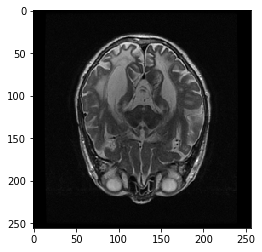

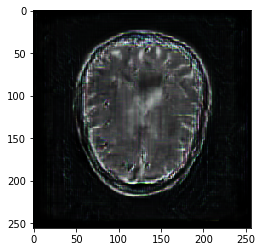

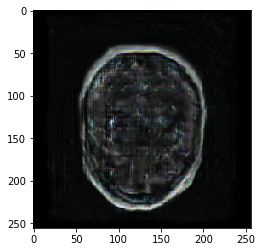

D Real: 0.75843257, D Fake: 0.18356395, G All: 2.4239807
D Real: 0.89740944, D Fake: 0.56296754, G All: 1.8258708
D Real: 0.09550765, D Fake: 0.8644606, G All: 1.8332001
D Real: 0.14459978, D Fake: 0.34640467, G All: 2.9859653
D Real: 0.11074242, D Fake: 0.6736586, G All: 2.9843855
D Real: 0.279014, D Fake: 0.09423606, G All: 3.4500306
D Real: 1.1905081, D Fake: 0.06359464, G All: 3.4249997
D Real: 0.7833818, D Fake: 0.47574735, G All: 2.7097697
D Real: 0.14940292, D Fake: 0.2879591, G All: 2.5828044
D Real: 0.25388655, D Fake: 0.34876359, G All: 2.3664646
D Real: 0.83106446, D Fake: 0.16722828, G All: 2.4938376
D Real: 0.67191195, D Fake: 0.32319683, G All: 1.4822062
D Real: 0.07592118, D Fake: 0.19611996, G All: 1.2514472
D Real: 0.042348463, D Fake: 0.18458955, G All: 2.636381
D Real: 0.05850678, D Fake: 0.20287931, G All: 2.2656145
D Real: 0.20798112, D Fake: 0.608243, G All: 1.888212
D Real: 0.20508938, D Fake: 0.14234231, G All: 2.8823116
D Real: 0.06481543, D Fake: 0.26201957, G

D Real: 0.4800928, D Fake: 0.17635803, G All: 2.9667058
D Real: 1.0972636, D Fake: 0.2833252, G All: 2.298016
D Real: 0.072555654, D Fake: 0.6944401, G All: 2.8336434
D Real: 0.12982188, D Fake: 0.27805787, G All: 2.8021693
D Real: 0.19972908, D Fake: 0.071730904, G All: 2.832138
D Real: 0.32749102, D Fake: 0.19641817, G All: 2.9938335
D Real: 0.9077029, D Fake: 0.07048214, G All: 2.8891613
D Real: 0.24319097, D Fake: 0.2068329, G All: 2.7341585
D Real: 0.043585844, D Fake: 0.62916905, G All: 2.4591403
D Real: 0.21463726, D Fake: 0.24663348, G All: 2.307226
D Real: 0.08831969, D Fake: 0.34842595, G All: 2.5538127
D Real: 0.51100856, D Fake: 0.18361582, G All: 2.9534016
D Real: 0.17927562, D Fake: 0.09747811, G All: 3.7632334
D Real: 0.2876716, D Fake: 0.048405506, G All: 2.5922306
D Real: 0.98559535, D Fake: 0.20834, G All: 1.4791567
D Real: 0.046767607, D Fake: 0.3124109, G All: 2.6530306
D Real: 0.11002636, D Fake: 0.23329505, G All: 2.1959352
D Real: 0.033100404, D Fake: 0.7365265, 

D Real: 0.4881382, D Fake: 0.37184274, G All: 2.3838468
D Real: 0.44372657, D Fake: 0.37853983, G All: 3.518085
D Real: 0.215295, D Fake: 0.06826131, G All: 3.4692655
D Real: 0.40848702, D Fake: 0.07474959, G All: 3.4264877
D Real: 0.35558438, D Fake: 0.34537554, G All: 2.8052535
D Real: 0.31416255, D Fake: 0.41712886, G All: 2.8469315
D Real: 1.106076, D Fake: 0.16391703, G All: 2.5630374
D Real: 0.038336214, D Fake: 0.6099572, G All: 2.550105
D Real: 0.6835873, D Fake: 0.26563802, G All: 2.7223191
D Real: 0.4057211, D Fake: 0.42586905, G All: 2.4654658
D Real: 0.22077657, D Fake: 0.88013583, G All: 1.8956127
D Real: 0.23895364, D Fake: 0.16835591, G All: 2.469737
D Real: 0.19006002, D Fake: 0.30883604, G All: 2.5482736
D Real: 0.15368927, D Fake: 0.09936045, G All: 2.231149
D Real: 0.12172401, D Fake: 0.6977627, G All: 2.8002284
D Real: 0.053406462, D Fake: 0.10421938, G All: 4.026393
D Real: 0.48023087, D Fake: 0.1557943, G All: 3.1116686
D Real: 0.60345423, D Fake: 0.074182145, G A

D Real: 0.30961028, D Fake: 0.23832941, G All: 3.8136806
D Real: 0.9987775, D Fake: 0.29651427, G All: 3.8791702
D Real: 0.6325044, D Fake: 0.091576666, G All: 3.0004554
D Real: 0.6036298, D Fake: 0.36164495, G All: 2.0021346
D Real: 0.1285266, D Fake: 0.27944136, G All: 2.2259007
D Real: 0.33270928, D Fake: 0.6339315, G All: 1.9878719
D Real: 0.15845963, D Fake: 0.40197942, G All: 2.052135
D Real: 0.087989554, D Fake: 0.17901522, G All: 3.0165224
D Real: 0.43614635, D Fake: 0.54233354, G All: 2.5746171
D Real: 0.39381534, D Fake: 0.2943867, G All: 2.2073388
D Real: 0.081537396, D Fake: 0.2987854, G All: 2.499415
D Real: 0.430514, D Fake: 0.085163765, G All: 2.3772902
D Real: 1.2013913, D Fake: 0.25814587, G All: 2.2148833
D Real: 0.76678294, D Fake: 0.07694541, G All: 1.941257
D Real: 0.22463056, D Fake: 0.10054058, G All: 1.9540123
D Real: 1.1771603, D Fake: 0.49806675, G All: 1.6017692
D Real: 0.07632637, D Fake: 0.59363914, G All: 1.31422
D Real: 0.13068771, D Fake: 0.5556525, G Al

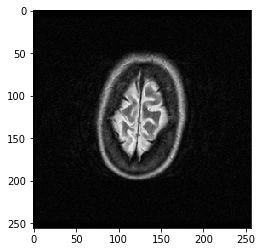

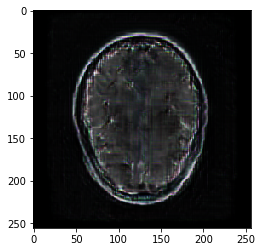

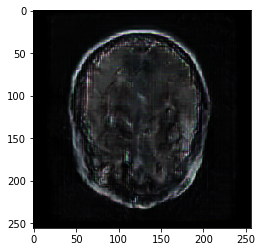

D Real: 0.06321651, D Fake: 1.6377053, G All: 3.6088796
D Real: 0.6709921, D Fake: 0.06347236, G All: 3.616564
D Real: 0.9003955, D Fake: 0.16438863, G All: 3.500554
D Real: 0.35453084, D Fake: 0.17007786, G All: 3.579806
D Real: 0.47245222, D Fake: 0.1470813, G All: 2.609776
D Real: 0.30112922, D Fake: 0.14090902, G All: 3.1789072
D Real: 0.8400849, D Fake: 0.11127139, G All: 1.6831031
D Real: 0.05160034, D Fake: 0.21278708, G All: 1.872669
D Real: 0.50842535, D Fake: 1.4525665, G All: 1.537279
D Real: 0.22994725, D Fake: 1.0880654, G All: 1.5635037
D Real: 0.14897214, D Fake: 0.20861661, G All: 3.244413
D Real: 0.052885137, D Fake: 0.46093947, G All: 2.7301698
D Real: 0.535485, D Fake: 0.66457474, G All: 3.1833115
D Real: 0.7075327, D Fake: 0.21187013, G All: 3.3777742
D Real: 0.5172366, D Fake: 0.2505666, G All: 3.5531769
D Real: 0.3973435, D Fake: 0.2522055, G All: 3.916088
D Real: 0.93089974, D Fake: 0.13866559, G All: 3.03293
D Real: 0.28085947, D Fake: 0.09282516, G All: 2.64842

D Real: 0.1202621, D Fake: 0.40276355, G All: 1.469771
D Real: 0.052403636, D Fake: 1.0311859, G All: 1.7405555
D Real: 0.55828553, D Fake: 0.53278315, G All: 2.5475144
D Real: 0.07421073, D Fake: 0.22239137, G All: 2.509761
D Real: 0.50512916, D Fake: 0.5517683, G All: 2.81139
D Real: 0.38606358, D Fake: 0.089554735, G All: 3.5871902
D Real: 0.1768661, D Fake: 0.07394097, G All: 3.4065201
D Real: 0.5326633, D Fake: 0.09804655, G All: 3.146833
D Real: 0.57890135, D Fake: 0.12422879, G All: 3.056466
D Real: 0.66634595, D Fake: 0.103264056, G All: 2.1328423
D Real: 0.73021513, D Fake: 0.4396873, G All: 2.861401
D Real: 0.046397064, D Fake: 0.26760665, G All: 2.2767348
D Real: 0.11416589, D Fake: 0.49482042, G All: 1.2058526
D Real: 0.102314055, D Fake: 0.2698657, G All: 2.0340254
D Real: 0.66123533, D Fake: 0.95220625, G All: 2.079719
D Real: 0.32624188, D Fake: 0.22035968, G All: 2.1692314
D Real: 0.4885667, D Fake: 0.4158804, G All: 1.7708907
D Real: 0.24780951, D Fake: 0.13349995, G A

D Real: 0.21530901, D Fake: 0.18712777, G All: 2.393489
D Real: 0.058266755, D Fake: 0.15954274, G All: 2.5365775
D Real: 0.12625402, D Fake: 0.32148913, G All: 3.338766
D Real: 0.2789038, D Fake: 0.0743996, G All: 2.5942557
D Real: 1.1964948, D Fake: 0.09744179, G All: 3.031481
D Real: 1.051765, D Fake: 0.21670002, G All: 2.517334
D Real: 0.45078874, D Fake: 0.38735753, G All: 1.6409662
D Real: 0.36016285, D Fake: 0.63135916, G All: 1.6945817
D Real: 0.048402593, D Fake: 1.3504571, G All: 1.412458
D Real: 0.08649894, D Fake: 1.0928483, G All: 1.5751557
D Real: 0.37754497, D Fake: 0.47802037, G All: 2.5318475
D Real: 0.78432894, D Fake: 0.06303029, G All: 2.8158107
D Real: 0.9837361, D Fake: 0.0969007, G All: 3.1273186
D Real: 0.31117094, D Fake: 0.25138608, G All: 2.9908051
D Real: 0.4512534, D Fake: 0.2478512, G All: 2.44312
D Real: 0.28204274, D Fake: 0.3015483, G All: 1.7137139
D Real: 0.09220792, D Fake: 0.10044423, G All: 2.2794483
D Real: 0.36509037, D Fake: 0.3158635, G All: 2.

D Real: 0.15290071, D Fake: 0.1548367, G All: 1.9494692
D Real: 0.05095367, D Fake: 1.3835657, G All: 2.2791085
D Real: 0.24263205, D Fake: 0.23466837, G All: 2.5711582
D Real: 0.68286556, D Fake: 0.07164253, G All: 2.3943923
D Real: 0.10071673, D Fake: 0.54072773, G All: 2.5345876
D Real: 0.15517026, D Fake: 0.14792407, G All: 2.6902394
D Real: 0.1929793, D Fake: 0.087124646, G All: 3.6311893
D Real: 0.6569484, D Fake: 0.093105055, G All: 2.8069289
D Real: 1.3400741, D Fake: 0.09206268, G All: 3.076623
D Real: 0.06159867, D Fake: 0.1794593, G All: 1.5790627
D Real: 0.033090863, D Fake: 0.17042622, G All: 2.2332282
D Real: 0.052947477, D Fake: 0.7547949, G All: 2.2016191
D Real: 0.26412082, D Fake: 0.573821, G All: 1.8158613
D Real: 0.08668171, D Fake: 0.12614879, G All: 1.9344788
D Real: 0.99685466, D Fake: 0.13051304, G All: 2.9157233
D Real: 0.08698194, D Fake: 0.42676643, G All: 3.2303648
D Real: 0.30772793, D Fake: 0.1464777, G All: 2.971712
D Real: 0.1471844, D Fake: 1.0373267, G

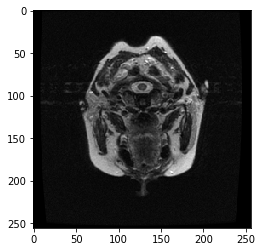

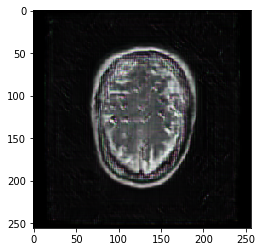

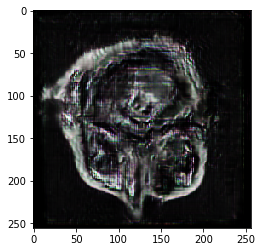

D Real: 0.12184051, D Fake: 0.07150449, G All: 2.7293544
D Real: 0.14584088, D Fake: 0.14369209, G All: 3.0864038
D Real: 0.12334633, D Fake: 0.048121274, G All: 3.0330513
D Real: 0.109336756, D Fake: 0.13936096, G All: 3.4163005
D Real: 0.62934047, D Fake: 0.096757516, G All: 3.184207
D Real: 1.5665734, D Fake: 0.3033595, G All: 2.9353356
D Real: 1.3824927, D Fake: 0.22461757, G All: 2.8851542
D Real: 0.5643488, D Fake: 0.20401365, G All: 1.2718229
D Real: 0.060288545, D Fake: 0.716094, G All: 1.6155894
D Real: 0.043776534, D Fake: 0.5602743, G All: 1.3285466
D Real: 0.2714103, D Fake: 0.5874243, G All: 1.3214455
D Real: 0.26691642, D Fake: 0.2965962, G All: 2.6403394
D Real: 0.29253364, D Fake: 0.35493538, G All: 2.8325677
D Real: 0.16485061, D Fake: 0.15638094, G All: 2.8380146
D Real: 0.12754199, D Fake: 0.34290925, G All: 3.0624847
D Real: 0.102237366, D Fake: 0.37603828, G All: 3.7337184
D Real: 0.15610746, D Fake: 0.06695865, G All: 3.5624337
D Real: 1.3093895, D Fake: 0.0614602

D Real: 0.8781824, D Fake: 0.06955085, G All: 2.3420928
D Real: 0.47187394, D Fake: 0.47769284, G All: 2.4011717
D Real: 0.07085678, D Fake: 0.28655294, G All: 1.6550827
D Real: 0.95158374, D Fake: 0.41924542, G All: 1.5506586
D Real: 0.04916908, D Fake: 0.35300043, G All: 1.2010024
D Real: 0.15886037, D Fake: 0.6123848, G All: 1.6627042
D Real: 0.46717978, D Fake: 0.19913758, G All: 1.726
D Real: 0.24374257, D Fake: 0.71461123, G All: 1.9775666
D Real: 0.576529, D Fake: 0.56982803, G All: 3.123342
D Real: 0.43594402, D Fake: 0.18307869, G All: 2.7718165
D Real: 0.101800114, D Fake: 0.14434128, G All: 2.711591
D Real: 0.60863805, D Fake: 0.14824127, G All: 2.6683764
D Real: 0.103047036, D Fake: 0.13102803, G All: 2.4498477
D Real: 0.116936944, D Fake: 0.2559348, G All: 3.0724788
D Real: 0.104939856, D Fake: 0.056509115, G All: 3.1969357
D Real: 0.38962373, D Fake: 0.41442382, G All: 2.3727515
D Real: 0.12126461, D Fake: 0.31590116, G All: 2.7659798
D Real: 0.08295266, D Fake: 0.2215885

D Real: 0.16227064, D Fake: 0.23685619, G All: 2.4793155
D Real: 0.8386494, D Fake: 0.64012116, G All: 2.551232
D Real: 1.1811768, D Fake: 0.32125658, G All: 2.607236
D Real: 0.13547105, D Fake: 0.17517886, G All: 2.3407536
D Real: 0.12311401, D Fake: 0.519389, G All: 3.0484805
D Real: 0.25725627, D Fake: 0.110896856, G All: 2.9636812
D Real: 0.05373479, D Fake: 0.18861814, G All: 2.257257
D Real: 0.30872232, D Fake: 0.2926761, G All: 2.5326176
D Real: 0.096408725, D Fake: 0.45595026, G All: 3.050321
D Real: 0.18825549, D Fake: 0.104071334, G All: 2.5455914
D Real: 0.31797758, D Fake: 0.10825194, G All: 3.7794814
D Real: 0.19912095, D Fake: 0.215049, G All: 2.3929687
D Real: 0.046784863, D Fake: 0.34491384, G All: 3.822335
D Real: 0.11316264, D Fake: 0.077272296, G All: 3.3878558
D Real: 0.38599974, D Fake: 0.17970024, G All: 3.255844
D Real: 0.43598133, D Fake: 0.18273842, G All: 2.992163
D Real: 0.36052164, D Fake: 0.0592598, G All: 2.4478428
D Real: 0.09311834, D Fake: 0.85926586, G

ResourceExhaustedError: OOM when allocating tensor with shape[4096,512,4,4] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node training_13/Adam/gradients/sequential_4_6/conv2d_transpose_1/conv2d_transpose_grad/Conv2DBackpropFilter}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


In [10]:
#if training new model:
model = Model_GAN() 
model.GAN.D.summary()
model.GAN.G.summary()

print("We're off! See you in a while!")
#model.GAN.steps = 165001
while(model.GAN.steps < 500000):
    
    #print("\n\n\n\nRound " + str(model.GAN.steps) + ":")
    model.train()
    if model.GAN.steps % 500 == 0:
        print("\nRound: " + str(model.GAN.steps))
    
    if model.GAN.steps % 1000 == 0:
        print("\n\n\n\nRound " + str(model.GAN.steps) + ":")
        model.eval2(int(model.GAN.steps / 1000))

